# Business Case 4

## ManyGiftsUK recommender system

#### Made by:
* Catarina Candeias (m20200656@novaims.unl.pt)
* Catarina Urbano (m20200607@novaims.unl.pt)
* Margarida Pereira (m20201038@novaims.unl.pt)
* Rita Ferreira (m20200661@novaims.unl.pt)

### Table of contents:

* [1. Business Understanding](#1)
* [2. Data Understanding](#2)
* [3. Data Preparation](#3)
* [4. Modeling and Evaluation](#4)
    * [4.1. RFM Analysis](#4.1)
    * [4.2. Model 1 - Simple Recommender System](#4.2)
    * [4.3. Model 2 - ALS Model](#4.3)    
    * [4.4. Model 3 - ALS Model with restrictions](#4.4)
        * [4.4.1. Hyper-parameter Tuning ALS](#4.4.1)
    * [4.5. Model 4 - Weighted ALS Model](#4.5)
        * [<font color='red'>4.5.1. Hyper-parameter Tuning Weighted ALS</font>  ](#4.5.1)    
* [5. Deployment (Recommender Example)](#5)

# 1. Business Understanding <a class="anchor" id="1"></a>

This section can be seen in detail in our report

# 2. Data Understanding <a class="anchor" id="2"></a>

#### Imports 

In [1]:
import os
from pathlib import Path
import pandas as pd
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
import datetime
from sklearn.preprocessing import StandardScaler
import squarify
import plotly.express as px 
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

from scipy.sparse import coo_matrix
from implicit.als import AlternatingLeastSquares
from implicit.evaluation import ranking_metrics_at_k
from tqdm import tqdm
import random

sns.set_style(style='white')

import warnings
warnings.filterwarnings("always", message='',category=FutureWarning)


### 2.1. Collect Initial Data

In [2]:
# Load data 
df = pd.read_csv('retail.csv')

In [3]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


### 2.2. Describe, explore and assess data quality <a class="anchor" id="2.2"></a>
Note that this is an interactive process, so in order to perform better exploration and assessment of our data some data cleaning was needed in this step

##### Number of unique users in the dataset

In [4]:
# checking how many unique customer IDs are there

x = df['CustomerID'].nunique()

# printing the value
print("There are {} number of different customers".format(x))

There are 4372 number of different customers


##### Count the number of unique products in the dataset

In [5]:
products = df['Description'].unique()
len(products)

4224

##### Count the number of unique countries in the dataset

In [6]:
# checking different number of unique countries present in this dataset

x = df['Country'].nunique()

# printing the result
print("There are {} number of different countries who do online retailing from UK".format(x))

There are 38 number of different countries who do online retailing from UK


In [7]:
# Get the row and column count,columns and their datatypes and presence of null values.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [8]:
# Getting a Profile Report:
# report=pandas_profiling.ProfileReport(df)
# report.to_file("output_profilling.html")

In [9]:
# shape of retail:
df.shape

(541909, 8)

In [10]:
# To avoid errors:
df.replace("", np.nan, inplace=True)

In [11]:
# Checking if there are white spaces where they aren´t supposed to be
lst = []
for column in df.columns:
    if (df[column].isin([' ']).sum()>0):
        lst.append(column)
print(lst)

[]


In [12]:
# Check for missing values:
display(df.isna().sum())

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [13]:
# some statistics:
df[['Quantity','UnitPrice']].describe()

,Quantity,UnitPrice
count,541909.000000,541909.000000
mean,9.552250,4.611114
std,218.081158,96.759853
min,-80995.000000,-11062.060000
25%,1.000000,1.250000
50%,3.000000,2.080000
75%,10.000000,4.130000
max,80995.000000,38970.000000


## Understanding missing values

In [14]:
df[df.isna().sum(axis=1)!=0].head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,12/1/2010 11:52,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,12/1/2010 14:32,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,12/1/2010 14:32,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,12/1/2010 14:32,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,12/1/2010 14:32,1.66,NaN,United Kingdom


### Negative quantities-> invoice number starts with C or price is 0:

In [15]:
print('\n% Negative Quantity: {:3.2%}'.format(df[(df.Quantity<0)].shape[0]/df.shape[0]))
print('\nAll register with negative quantity has Invoice start with:', 
      df.loc[(df.Quantity<0) & ~(df.CustomerID.isnull()), 'InvoiceNo'].apply(lambda x: x[0]).unique())


% Negative Quantity: 1.96%

All register with negative quantity has Invoice start with: ['C']


In [16]:
len(df[df['Quantity']<0])-len(df[((df['InvoiceNo'].str.contains('C'))&(df['Quantity']<0))| ((df['UnitPrice']==0.)&(df['Quantity']<0))])

0

In [17]:
df[df['InvoiceNo']=='C581490']
df[df['InvoiceNo']=='C536391']

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
238,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
239,C536391,21484,CHICK GREY HOT WATER BOTTLE,-12,12/1/2010 10:24,3.45,17548.0,United Kingdom
240,C536391,22557,PLASTERS IN TIN VINTAGE PAISLEY,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom
241,C536391,22553,PLASTERS IN TIN SKULLS,-24,12/1/2010 10:24,1.65,17548.0,United Kingdom


If I was to drop all the missing values, and non positive quantities and prices, +144.000 records would be deleted:

In [18]:
len(df)-len(df[(df['Quantity']>0) & (df['UnitPrice']>0)].dropna())

144025

Auxiliary function to identify if InvoiceNO has digits

In [19]:
def funcao(x):
    return x[0].isdigit()

aux= df[df['InvoiceNo'].apply(funcao)]
len(aux[(aux['UnitPrice']==0)&(aux['Quantity']<0)])/len(df)*100#['Description'].unique()

0.24653585749636933

#### Outliers detection

In [20]:
metric_features =["Quantity","UnitPrice"]

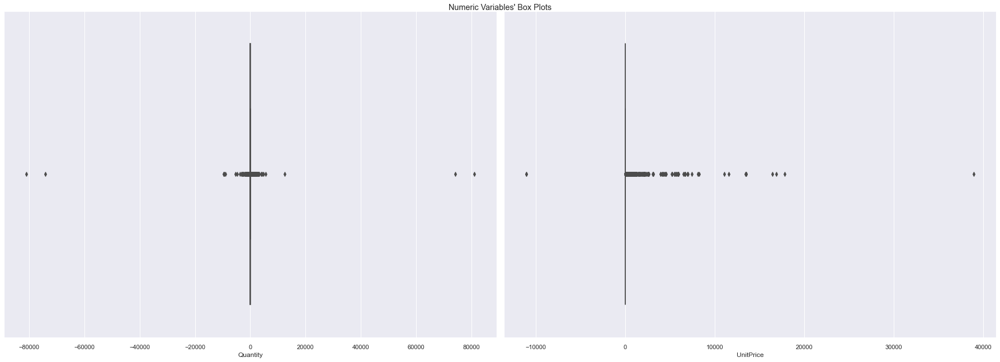

In [21]:
# check boxplots and univariate outliers

# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(1, 2, figsize=(25, 9), squeeze=True)

# Plot data
# Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=df[feat], ax=ax)
#     ax.set_title(feat, y=-0.21)

# Adjusting my subplots:
fig.tight_layout()

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"
plt.suptitle(title,y=1)

plt.show()

##### Some required data preparation to enable good data exploration at this step:

In [22]:
#Convert to proper format
df['InvoiceDate']=pd.to_datetime(df['InvoiceDate'])

In [23]:
# Get min max of Invoice dates
df['InvoiceDate'].min(), df['InvoiceDate'].max()

(Timestamp('2010-12-01 08:26:00'), Timestamp('2011-12-09 12:50:00'))

In [24]:
# See how many products can be there in one invoice
df['InvoiceNo'].value_counts()

573585     1114
581219      749
581492      731
580729      721
558475      705
           ... 
C537630       1
546137        1
558624        1
C538755       1
537367        1
Name: InvoiceNo, Length: 25900, dtype: int64

### Visualizations

In [25]:
df['Canceled'] = df['InvoiceNo'].str.contains('C')
df['Canceled'].replace({False: 0, True: 1}, inplace=True)

###### What time of day do people often online shop?

In [26]:
hour_list = []
def getHour(x):
    return x.hour

df_aux = df[df['Canceled']==0]
hour_list = df_aux["InvoiceDate"].map(getHour)

In [27]:
hour_list.value_counts().reset_index()

,index,InvoiceDate
0,12,77371
1,15,76626
2,13,71196
3,14,66448
4,11,56481
5,16,53597
6,10,48028
7,9,33807
8,17,27798
9,8,8807


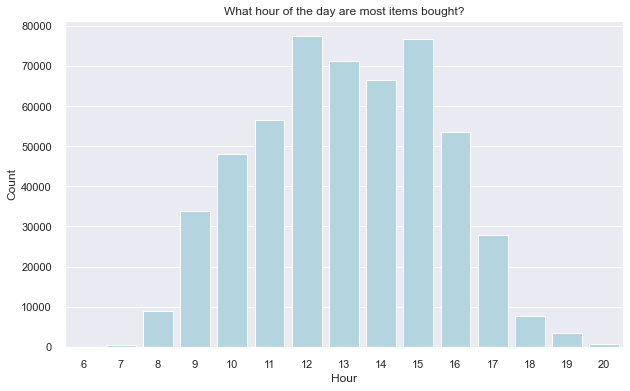

In [28]:
plt.figure(figsize = (10,6))
ax = sns.barplot(x = "index", y = "InvoiceDate", data = hour_list.value_counts().reset_index(), color = "lightblue")
ax.set(xlabel='Hour', ylabel='Count')
ax.set_title('What hour of the day are most items bought?')
plt.show()

###### What day of the week do people often online shop?

In [29]:
day = []
def get_dow(x):
    return calendar.day_name[x.weekday()]
day = df_aux['InvoiceDate'].map(get_dow)

In [30]:
day.value_counts().reset_index()

,index,InvoiceDate
0,Thursday,101502
1,Tuesday,100060
2,Monday,93491
3,Wednesday,92836
4,Friday,80822
5,Sunday,63910


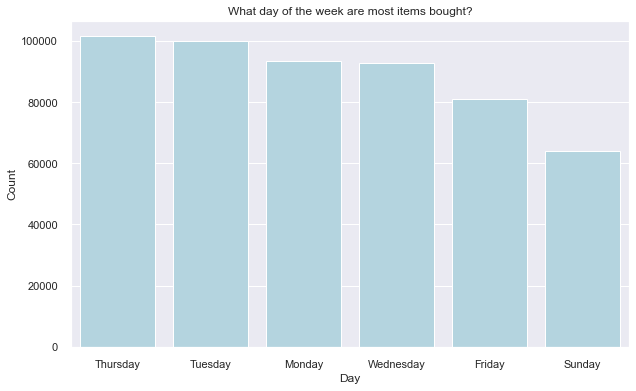

In [31]:
plt.figure(figsize = (10,6))
ax2 = sns.barplot(x = "index", y = "InvoiceDate", data = day.value_counts().reset_index(), color = "lightblue")
ax2.set(xlabel='Day', ylabel='Count')
ax2.set_title('What day of the week are most items bought?')
plt.show()

Most items are bought on Thursday


###### What day of the week and hour do people often online shop?

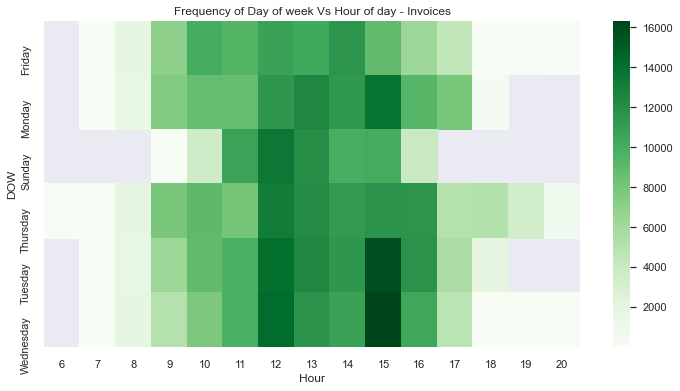

In [32]:
df_Aux = df[df['Canceled']==0].copy()
df_Aux.insert(2, 'Hour', df["InvoiceDate"].map(getHour))
df_Aux.insert(2, 'DOW',df["InvoiceDate"].map(get_dow))

DowAndHour = df_Aux[['DOW', 'Hour', 'InvoiceNo']]
grouped_df = DowAndHour.groupby(["DOW", "Hour"])["InvoiceNo"].aggregate("count").reset_index()
grouped_df = grouped_df.pivot('DOW', 'Hour', 'InvoiceNo')

plt.figure(figsize=(12,6))
sns.heatmap(grouped_df, cmap='Greens')
plt.title("Frequency of Day of week Vs Hour of day - Invoices")
plt.show()

###### What day of the week and hour do people often do cancellations?

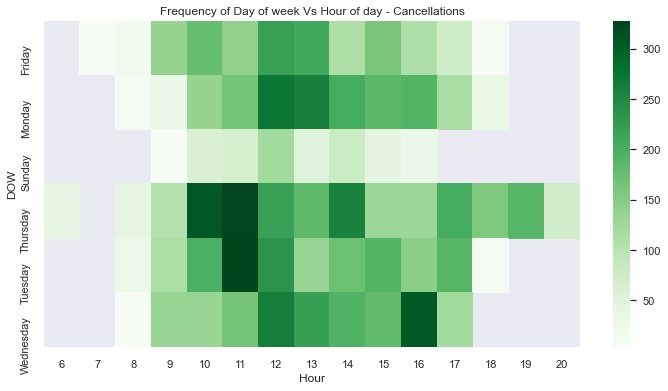

In [33]:
df_Canceled = df[df['Canceled']==1].copy()
df_Canceled.insert(2, 'Hour', df["InvoiceDate"].map(getHour))
df_Canceled.insert(2, 'DOW',df["InvoiceDate"].map(get_dow))

DowAndHour_Canceled = df_Canceled[['DOW', 'Hour', 'InvoiceNo']]
grouped_df = DowAndHour_Canceled.groupby(["DOW", "Hour"])["InvoiceNo"].aggregate("count").reset_index()
grouped_df = grouped_df.pivot('DOW', 'Hour', 'InvoiceNo')

plt.figure(figsize=(12,6))
sns.heatmap(grouped_df, cmap='Greens')
plt.title("Frequency of Day of week Vs Hour of day - Cancellations")
plt.show()

##### Showing the most popular Products in the dataset

In [34]:
products_grouped = df.groupby(['Description']).agg({'Quantity': 'count'}).reset_index()
grouped_sum = products_grouped['Quantity'].sum()
products_grouped['percentage']  = products_grouped['Quantity'].div(grouped_sum)*100
products_grouped.rename(columns = {'Description':'Product Name', 'Quantity':'count'}, inplace = True)
products_grouped = products_grouped.sort_values(['count', 'Product Name'], ascending = [0,1])
products_grouped

,Product Name,count,percentage
3918,WHITE HANGING HEART T-LIGHT HOLDER,2369,0.438334
2915,REGENCY CAKESTAND 3 TIER,2200,0.407064
1866,JUMBO BAG RED RETROSPOT,2159,0.399478
2471,PARTY BUNTING,1727,0.319546
2054,LUNCH BAG RED RETROSPOT,1638,0.303078
...,...,...,...
4218,wrongly marked carton 22804,1,0.000185
4219,wrongly marked. 23343 in box,1,0.000185
4220,wrongly sold (22719) barcode,1,0.000185
4221,wrongly sold as sets,1,0.000185


Text(0, 0.5, 'Count')

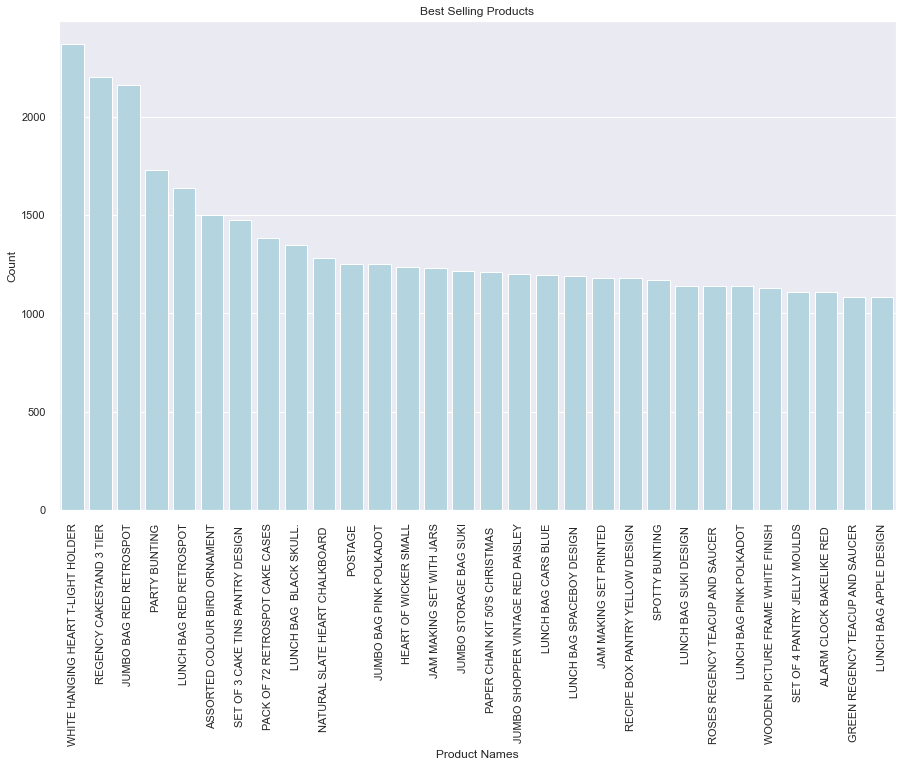

In [35]:
plt.figure(figsize=(15,9))
sns.barplot(data=products_grouped.head(30),x="Product Name",y="count",orient="v",color='lightblue')
plt.xticks(rotation=90)
plt.title("Best Selling Products")
plt.xlabel('Product Names')
plt.ylabel("Count")

In [36]:
df_aux = df.copy()
df_aux.insert(1, 'Monetary', df_aux['Quantity']*df_aux['UnitPrice'])
products_grouped = df_aux.groupby('Description')['Monetary'].sum().to_frame()
products_grouped = products_grouped.sort_values(by = 'Monetary', ascending = False)
products_grouped = products_grouped.reset_index()
products_grouped

,Description,Monetary
0,DOTCOM POSTAGE,206245.480
1,REGENCY CAKESTAND 3 TIER,164762.190
2,WHITE HANGING HEART T-LIGHT HOLDER,99668.470
3,PARTY BUNTING,98302.980
4,JUMBO BAG RED RETROSPOT,92356.030
...,...,...
4218,Bank Charges,-7175.639
4219,CRUK Commission,-7933.430
4220,Adjust bad debt,-11062.060
4221,Manual,-68671.640


Text(0, 0.5, 'Sum')

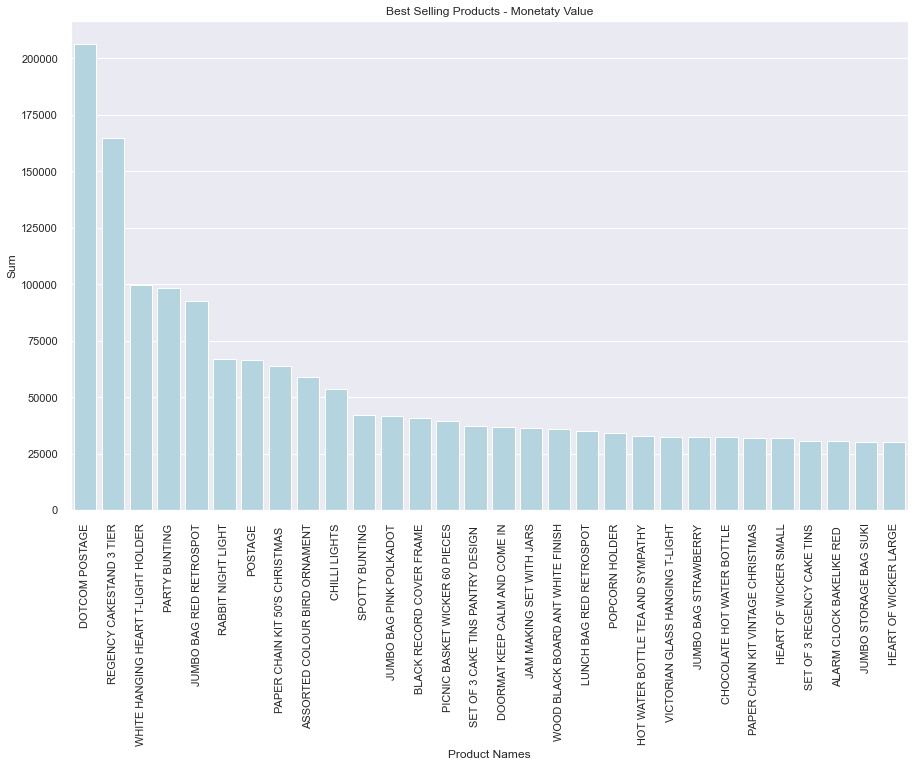

In [37]:
plt.figure(figsize=(15,9))
sns.barplot(data=products_grouped.head(30),x="Description",y="Monetary",orient="v",color='lightblue')
plt.xticks(rotation=90)
plt.title("Best Selling Products - Monetaty Value")
plt.xlabel('Product Names')
plt.ylabel("Sum")

##### Top 10 Countries where the purchases are made more often

In [38]:
top20 = df['Country'].value_counts().head(20)
top20 = top20.to_frame()
top20

,Country
United Kingdom,495478
Germany,9495
France,8557
EIRE,8196
Spain,2533
Netherlands,2371
Belgium,2069
Switzerland,2002
Portugal,1519
Australia,1259


C:\Users\Catarina Urbano\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Count')

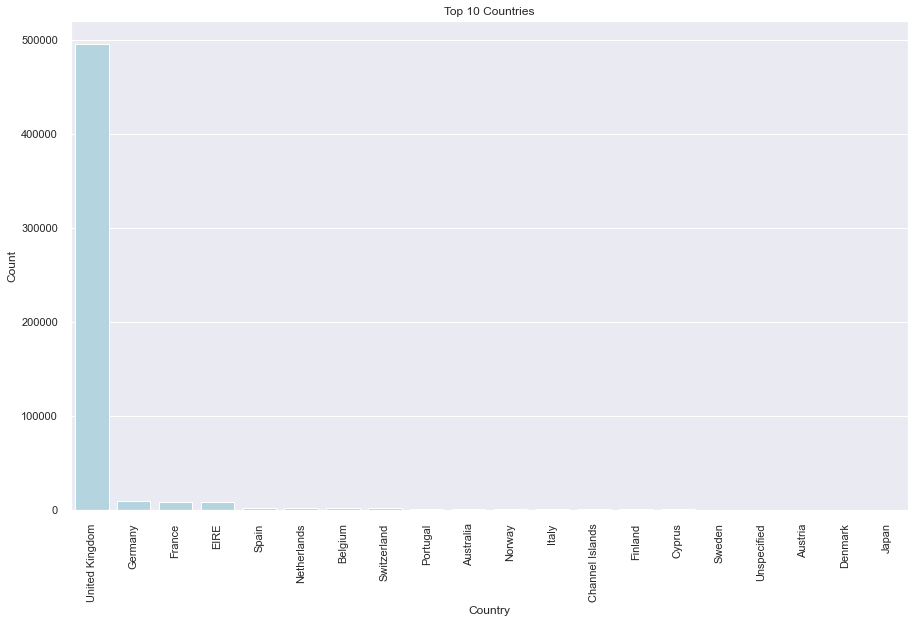

In [39]:
plt.figure(figsize=(15,9))
sns.barplot(top20.index, top20['Country'],orient="v",color='lightblue')
plt.xticks(rotation=90)
plt.title("Top 10 Countries")
plt.xlabel('Country')
plt.ylabel("Count")

As expected, most customers are from UK 

##### Bottom 20 Countries where the purchases are made less often

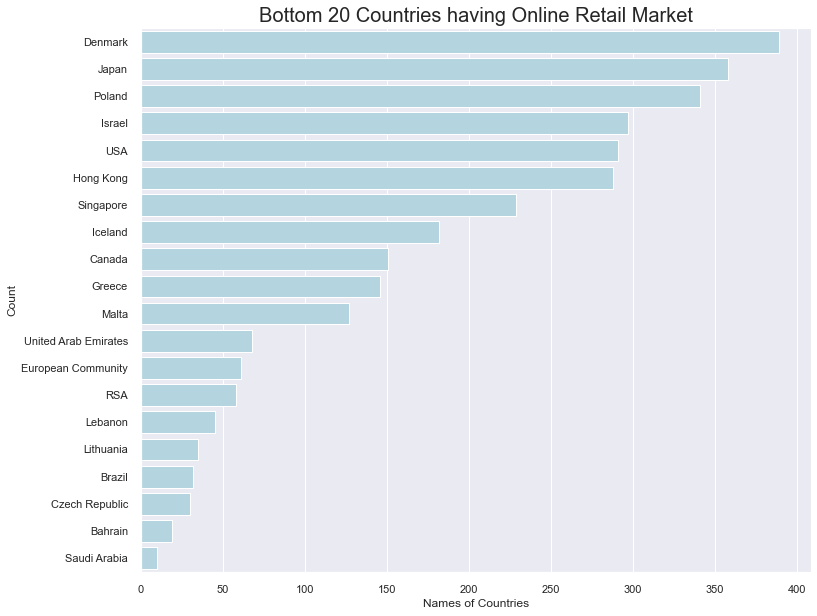

In [40]:
plt.rcParams['figure.figsize'] = (12, 10)
a = df['Country'].value_counts().tail(20)
sns.barplot(x = a.values, y = a.index, color = 'lightblue')
plt.title('Bottom 20 Countries having Online Retail Market', fontsize = 20)
plt.xlabel('Names of Countries')
plt.ylabel('Count')
plt.show()

C:\Users\Catarina Urbano\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


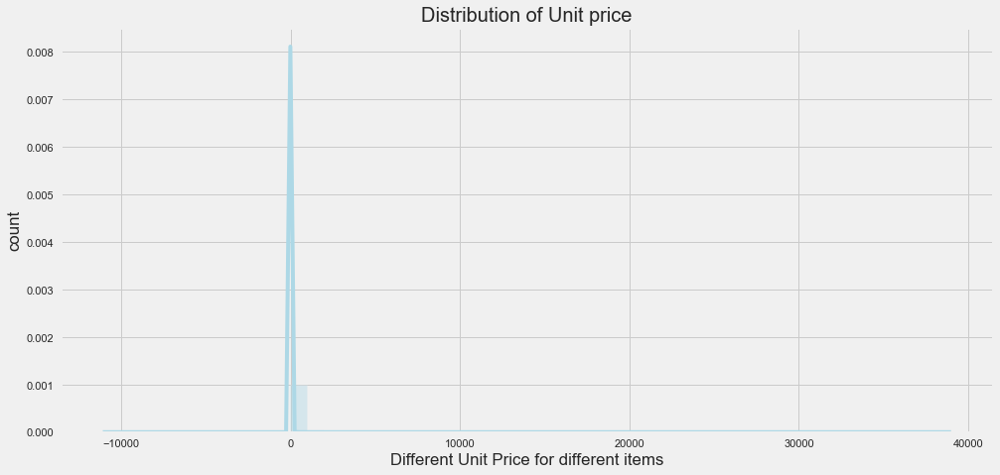

In [41]:
# visualizing the unitprice

plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')
sns.distplot(df['UnitPrice'], color = 'lightblue')
plt.title('Distribution of Unit price', fontsize = 20)
plt.xlabel('Different Unit Price for different items')
plt.ylabel('count')
plt.show()

##### Quantity of Products sold in all the countries except UK

Country
United Kingdom          4263829
Netherlands              200128
EIRE                     142637
Germany                  117448
France                   110480
Australia                 83653
Sweden                    35637
Switzerland               30325
Spain                     26824
Japan                     25218
Belgium                   23152
Norway                    19247
Portugal                  16180
Finland                   10666
Channel Islands            9479
Denmark                    8188
Italy                      7999
Cyprus                     6317
Singapore                  5234
Austria                    4827
Hong Kong                  4769
Israel                     4353
Poland                     3653
Unspecified                3300
Canada                     2763
Iceland                    2458
Greece                     1556
USA                        1034
United Arab Emirates        982
Malta                       944
Lithuania                   652


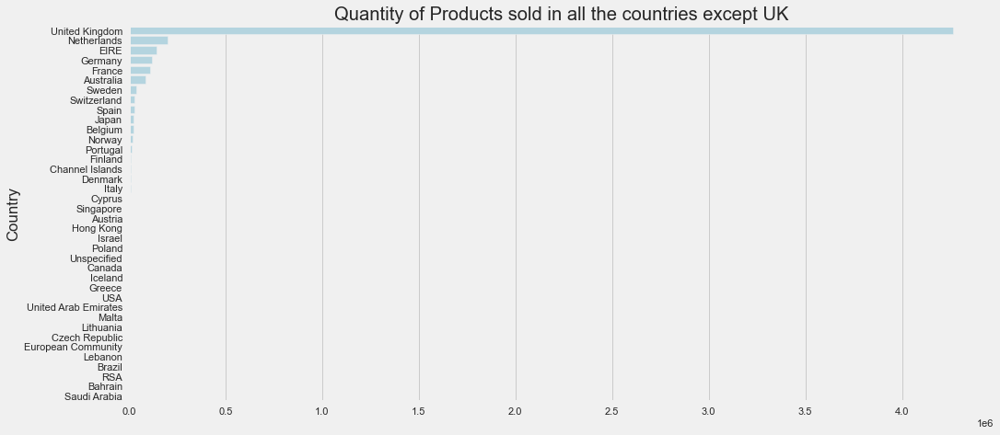

In [42]:
# checking how many quantity of products have been sold online from each country

r = df['Quantity'].groupby(df['Country']).agg('sum').sort_values(ascending = False)#[1:]
print(r)

sns.barplot(x = r.values, y = r.index, color ='lightblue')
plt.title('Quantity of Products sold in all the countries except UK')
plt.show()

##### Products with more cancelations

In [43]:
prod_canc = df.groupby('Description')['Canceled'].sum().sort_values(ascending = False).reset_index()

Text(0, 0.5, 'Total cancellations')

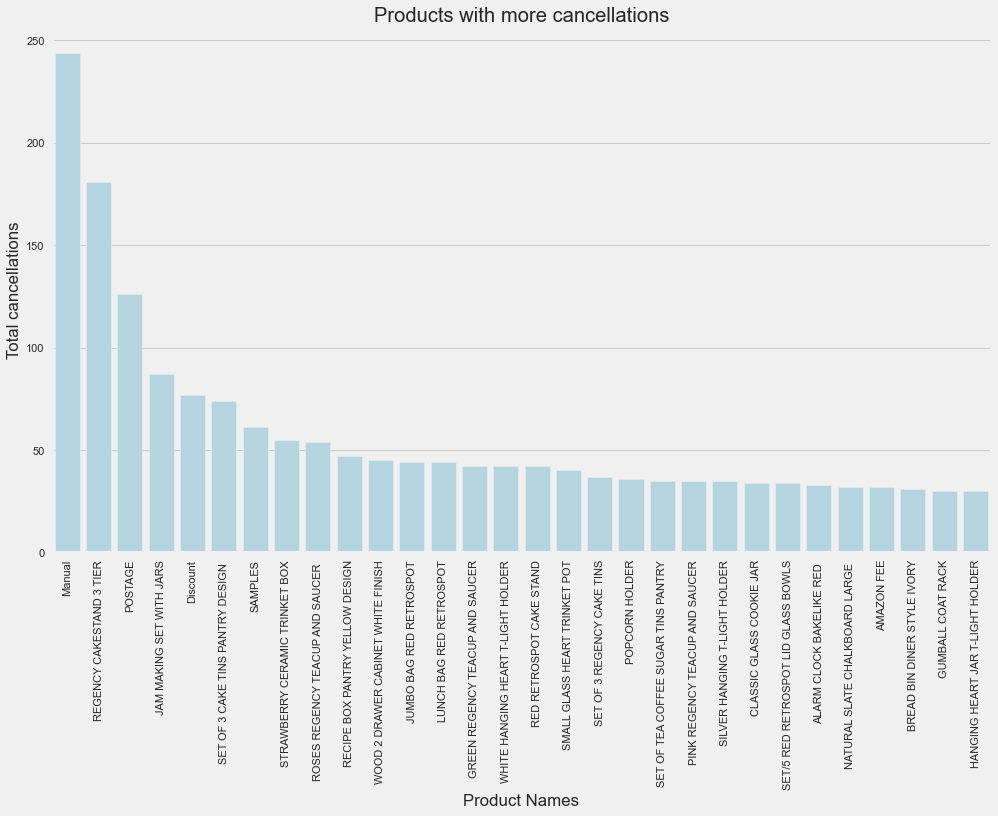

In [44]:
plt.figure(figsize=(15,9))
sns.barplot(data=prod_canc.head(30),x="Description",y="Canceled",orient="v",color='lightblue')
plt.xticks(rotation=90)
plt.title("Products with more cancellations")
plt.xlabel('Product Names')
plt.ylabel("Total cancellations")

##### Customers who cancelled more

In [45]:
cust_canc = df.groupby('CustomerID')['Canceled'].sum().sort_values(ascending = False).reset_index()

Text(0, 0.5, 'Total cancellations')

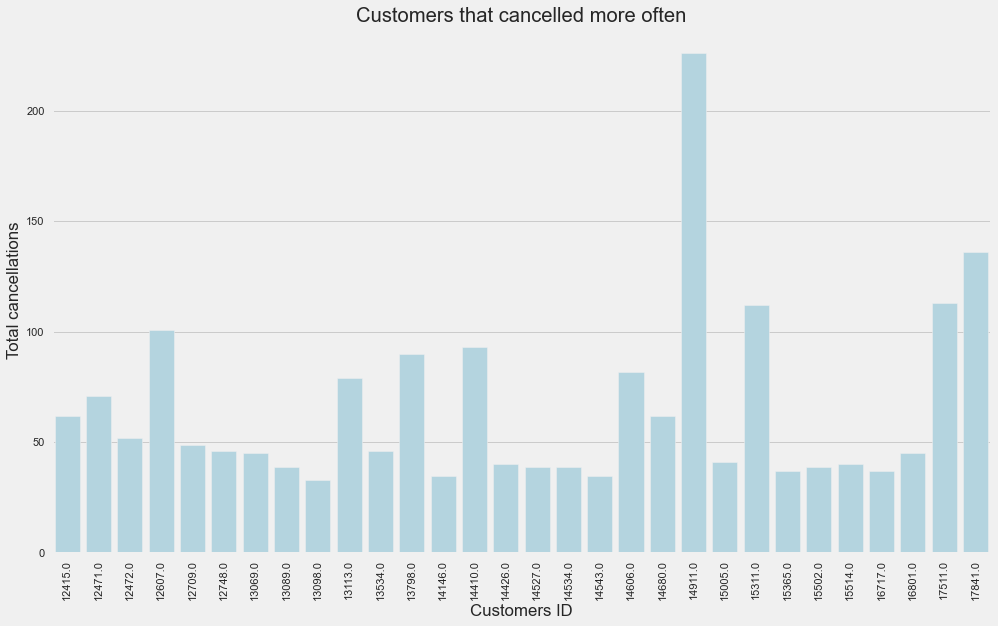

In [46]:
plt.figure(figsize=(15,9))
sns.barplot(data=cust_canc.head(30),x="CustomerID",y="Canceled",orient="v",color='lightblue')
plt.xticks(rotation=90)
plt.title("Customers that cancelled more often")
plt.xlabel('Customers ID')
plt.ylabel("Total cancellations")

##### Countries with more cancellations

In [47]:
country_canc = df.groupby('Country')['Canceled'].sum().sort_values(ascending = False).reset_index()

Text(0, 0.5, 'Total cancellations')

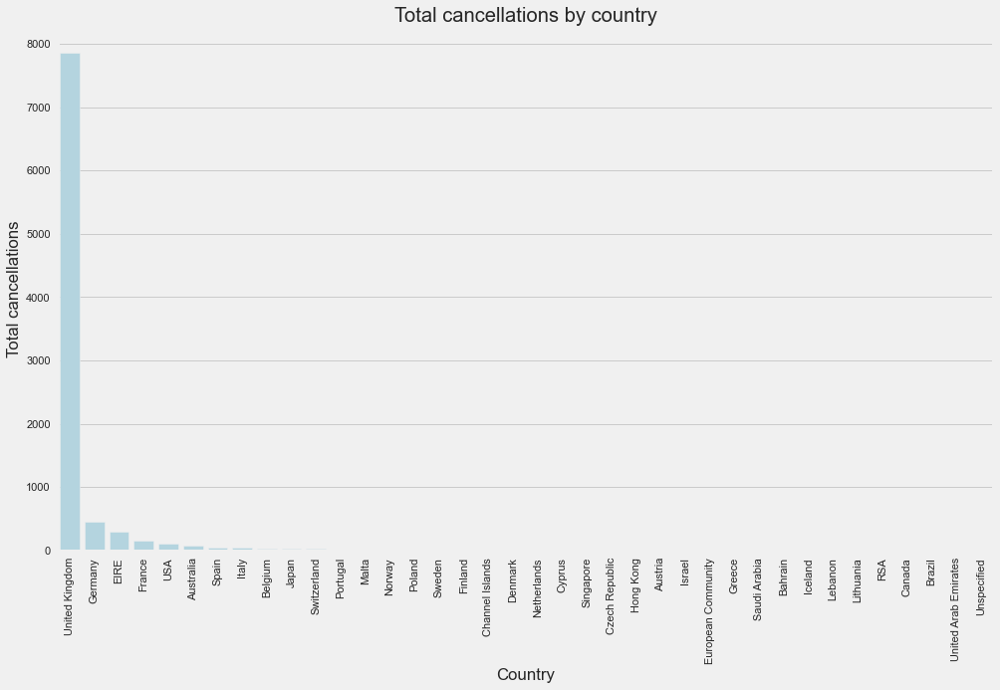

In [48]:
plt.figure(figsize=(15,9))
sns.barplot(data=country_canc,x="Country",y="Canceled",orient="v",color='lightblue')
plt.xticks(rotation=90)
plt.title("Total cancellations by country")
plt.xlabel('Country')
plt.ylabel("Total cancellations")

##### Months with more cancellations

In [49]:
month_list = []
def getMonth(x):
    return x.month
getMonth_canceled = df[df['Canceled']==1]["InvoiceDate"].map(getMonth)
getMonth_not_canceled = df[df['Canceled']==0]["InvoiceDate"].map(getMonth)

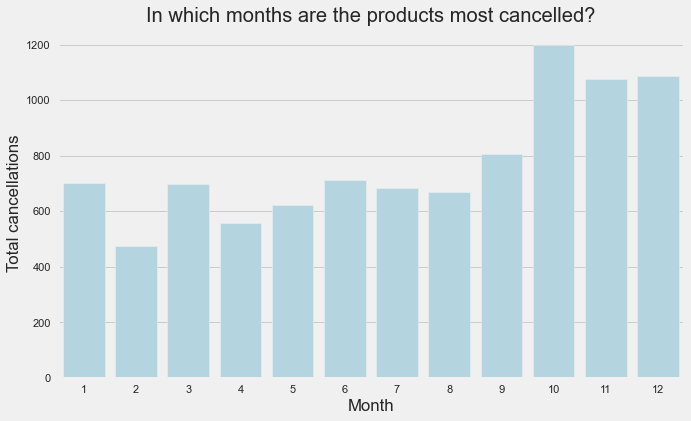

In [50]:
plt.figure(figsize = (10,6))
ax = sns.barplot(x = "index", y = "InvoiceDate", data = getMonth_canceled.value_counts().reset_index(), color = "lightblue")
ax.set(xlabel='Month', ylabel='Count')
ax.set_title('In which months are the products most cancelled?')
plt.ylabel("Total cancellations")


plt.show()

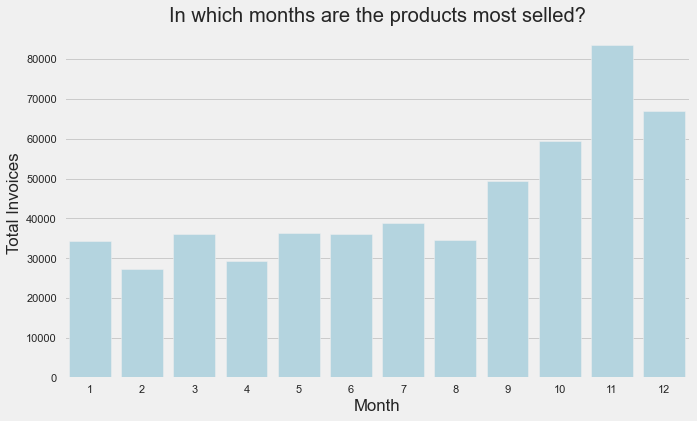

In [51]:
plt.figure(figsize = (10,6))
ax = sns.barplot(x = "index", y = "InvoiceDate", data = getMonth_not_canceled.value_counts().reset_index(), color = "lightblue")
ax.set(xlabel='Month', ylabel='Count')
ax.set_title('In which months are the products most selled?')
plt.ylabel("Total Invoices")


plt.show()

###### Trending Products

In [52]:
aux_df = df.copy()
aux_df['InvoiceDate']=pd.to_datetime(aux_df.InvoiceDate.astype(str).apply(lambda x: x[:10]))#I only want the day, not the time of the day

In [53]:
aux_df = aux_df.sort_values(by='InvoiceDate').groupby(by=['StockCode','InvoiceDate'])['Quantity'].sum().to_frame().reset_index()

In [54]:
from datetime import datetime
z=(datetime.now()-aux_df['InvoiceDate'])
z=z.apply(lambda x: str(x)[:4])
aux_df.InvoiceDate = z.copy()

Plotting the trend for a specific product

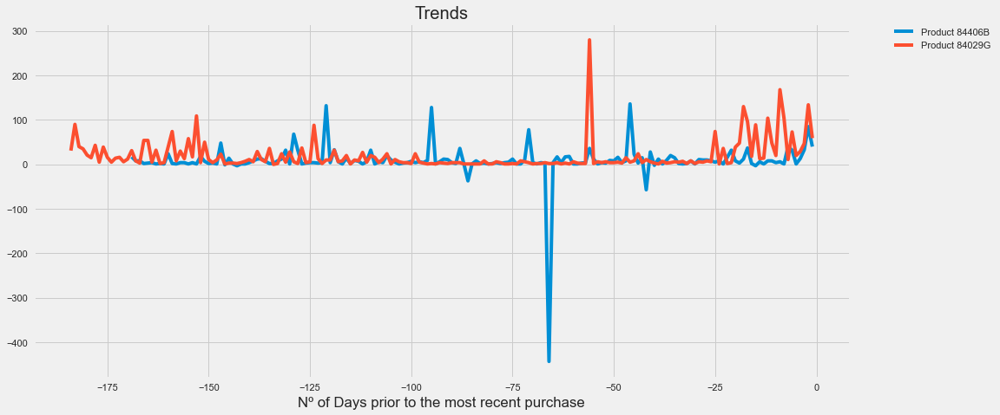

In [55]:
# Group by ID & Age
cart_adds = pd.pivot_table(aux_df, values='Quantity', index=['StockCode', 'InvoiceDate']).reset_index().set_index('StockCode')

ID = '84406B'
trend = np.array(cart_adds.loc[ID,:])
x = np.arange(-len(trend),0)
plt.plot(x, trend[:,1], label="Product "+ID)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Trends')


ID = '84029G'
trend = np.array(cart_adds.loc[ID,:])
x = np.arange(-len(trend),0)
plt.plot(x, trend[:,1], label="Product "+ID)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlabel('Nº of Days prior to the most recent purchase')
plt.show()

# 3. Data Preparation <a class="anchor" id="3"></a>


## 3.1. Clean Data

### Missing Values

###### Replacing most of the missing values on the variable description

This will be done by replacing the missing values using the name of the correspondent product (obtained from other records), assuming that the purchase in question was not a cancelation, that is, quantity>0

    |Obtaining the original names of the products
    
    (note that some of the descriptions in the several records don´t correspond to the actual name of the product but rather to details regarding the transaction (e.g.missing, damaged, etc.). However, one way to distinguish these descriptions is by knowing that the names of the products are mostly written in capital letters and the other types of descriptions are written only with lower cases)

In [56]:
aux = df.dropna(subset=['Description'])
aux.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,0


In [57]:
def filter_function(x):
    return not (x.islower() or ('?' in x ) or ((x[0].isupper()) & (x[1].islower())))

In [58]:
aux_dict = aux[aux['Description'].apply(filter_function)][['StockCode','Description']].drop_duplicates().set_index('StockCode').to_dict()
aux_dict = aux_dict['Description']
aux_dict

{'85123A': 'CREAM HANGING HEART T-LIGHT HOLDER',
 '71053': 'WHITE MOROCCAN METAL LANTERN',
 '84406B': 'CREAM CUPID HEARTS COAT HANGER',
 '84029G': 'KNITTED UNION FLAG HOT WATER BOTTLE',
 '84029E': 'RED WOOLLY HOTTIE WHITE HEART.',
 '22752': 'SET 7 BABUSHKA NESTING BOXES',
 '21730': 'GLASS STAR FROSTED T-LIGHT HOLDER',
 '22633': 'HAND WARMER UNION JACK',
 '22632': 'HAND WARMER RED RETROSPOT',
 '84879': 'ASSORTED COLOUR BIRD ORNAMENT',
 '22745': "POPPY'S PLAYHOUSE BEDROOM ",
 '22748': "POPPY'S PLAYHOUSE KITCHEN",
 '22749': 'FELTCRAFT PRINCESS CHARLOTTE DOLL',
 '22310': 'IVORY KNITTED MUG COSY ',
 '84969': 'BOX OF 6 ASSORTED COLOUR TEASPOONS',
 '22623': 'BOX OF VINTAGE JIGSAW BLOCKS ',
 '22622': 'BOX OF VINTAGE ALPHABET BLOCKS',
 '21754': 'HOME BUILDING BLOCK WORD',
 '21755': 'LOVE BUILDING BLOCK WORD',
 '21777': 'RECIPE BOX WITH METAL HEART',
 '48187': 'DOORMAT NEW ENGLAND',
 '22960': 'JAM MAKING SET WITH JARS',
 '22913': 'RED COAT RACK PARIS FASHION',
 '22912': 'YELLOW COAT RACK PARIS F

In [59]:
df.loc[df['Description'].isna(),'Description']=df[df['Description'].isna()]['StockCode'].map(aux_dict)

Descriptions other than the names of the products:

In [60]:
df[df['Description'].apply(lambda x: False if pd.isna(x)==True else (not filter_function(x)))]['Description'].unique()

array(['Discount', 'Manual', "Dr. Jam's Arouzer Stress Ball",
       'Bank Charges', 'amazon', '?', 'check', 'damages',
       "Dad's Cab Electronic Meter", 'faulty', 'Dotcom sales',
       'amazon sales', 'Dotcomgiftshop Gift Voucher £40.00', 'Found',
       'Dotcomgiftshop Gift Voucher £50.00', 'reverse 21/5/10 adjustment',
       'Dotcomgiftshop Gift Voucher £30.00',
       'Dotcomgiftshop Gift Voucher £20.00', 'mouldy, thrown away.',
       'found', 'counted', 'Given away', 'Dotcom', 'label mix up',
       'samples/damages', 'thrown away', 'incorrectly made-thrown away.',
       'showroom', 'Adjustment', 'Dotcomgiftshop Gift Voucher £10.00',
       'Dotcom set', 'wrongly sold as sets', 'Amazon sold sets',
       'dotcom sold sets', 'wrongly sold sets', '? sold as sets?',
       '?sold as sets?', 'Thrown away.', 'damages/display',
       'damaged stock', 'broken', 'throw away', 'wrong barcode (22467)',
       'wrongly sold (22719) barcode', 'wrong barcode', 'barcode problem',
      

In [61]:
df.isna().sum() #some products are left with missing values, because we don´t have info regarding the name

InvoiceNo           0
StockCode           0
Description       119
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
Canceled            0
dtype: int64

The Nan values that are left in the description variable correspond to products that are transactionated only once, so we can drop them as there isn´t any valuable information

In [62]:
df.loc[df['Description'].isna(),'StockCode'].value_counts().max()

1

In [63]:
df.dropna(subset=['Description'], inplace=True)

Replacing the variable description values that do not correspond to the actual name of the product

In [64]:
df_copy= df.copy()
df.loc[df['Description'].apply(lambda x: not filter_function(x)),'Description'] = df.loc[df['Description'].apply(lambda x: not filter_function(x)),'StockCode'].map(aux_dict)

In [65]:
df.loc[df['Description'].isna(),'Description']=df_copy.loc[df['Description'].isna(),'Description'].copy()

###### customerID

As we don´t have any information regarding the customerID of some records, we will interpret them as belonging to new clients

So, we will replace the NaN values with the category 'New Customer'

In [66]:
df['CustomerID'].fillna('New Customer',inplace=True)

In [67]:
df.isna().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
Canceled       0
dtype: int64

### 3.2. Construct data <a class="anchor" id="3.3"></a>

Canceled - created above for visualizations purposes

In [68]:
#df['Canceled'] = df['InvoiceNo'].str.contains('C')
#df['Canceled'].replace({False: 0, True: 1}, inplace=True)

Devolution

In [69]:
df.insert(2, 'Devolution', 0)

In [70]:
df.loc[(df['Quantity'] < 0)&(df['Canceled']==0), 'Devolution'] = True 
df['Devolution'].replace({True: 1}, inplace=True)

Offer

In [71]:
df.insert(3, 'Offer', 0)

In [72]:
df.loc[((df['Quantity'] > 0) & (df['UnitPrice']==0)), 'Offer'] = True 
df['Offer'].replace({True: 1}, inplace=True)
df

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled
0,536365,85123A,0,0,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,0
1,536365,71053,0,0,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0
2,536365,84406B,0,0,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,0
3,536365,84029G,0,0,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0
4,536365,84029E,0,0,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0
...,...,...,...,...,...,...,...,...,...,...,...
541904,581587,22613,0,0,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,0
541905,581587,22899,0,0,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,0
541906,581587,23254,0,0,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,0
541907,581587,23255,0,0,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,0


Text(0, 0.5, 'Percent')

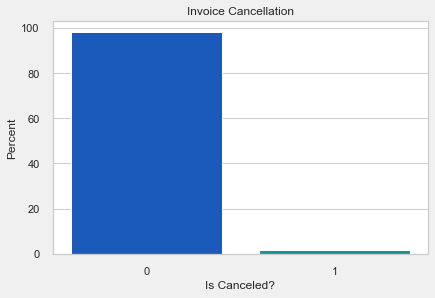

In [73]:
plt.figure(figsize=(6, 4))
sns.set(style="whitegrid")
ax = sns.barplot(x="Canceled", y="Canceled", palette = 'winter',  data=df, estimator=lambda x: len(x) / len(df) * 100)
plt.title('Invoice Cancellation')
plt.xlabel('Is Canceled?')
plt.ylabel('Percent')

In [74]:
len(df[df['Canceled']==1])/len(df)*100

1.7143173554329167

Text(0, 0.5, 'Percent')

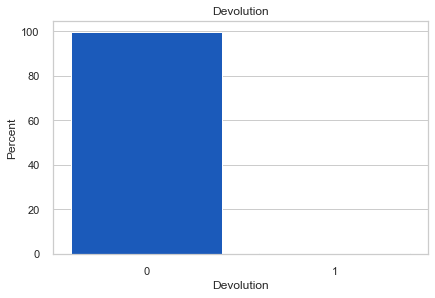

In [75]:
plt.figure(figsize=(6, 4))
sns.set(style="whitegrid")
ax = sns.barplot(x="Devolution", y="Devolution", palette = 'winter',  data=df, estimator=lambda x: len(x) / len(df) * 100)
plt.title('Devolution')
plt.xlabel('Devolution')
plt.ylabel('Percent')

Text(0, 0.5, 'Percent')

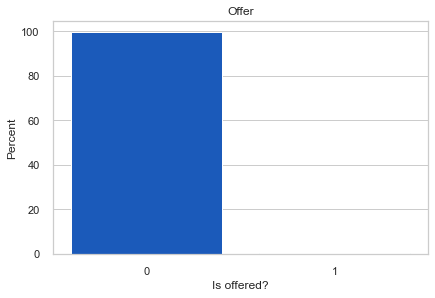

In [76]:
plt.figure(figsize=(6, 4))
sns.set(style="whitegrid")
ax = sns.barplot(x="Offer", y="Offer", palette = 'winter',  data=df, estimator=lambda x: len(x) / len(df) * 100)
plt.title('Offer')
plt.xlabel('Is offered?')
plt.ylabel('Percent')

In [77]:
df.groupby('Description')['Canceled'].mean().sort_values(ascending = False)

Description
FLAMINGO LIGHTS                       1.0
CREAM SWEETHEART TRAYS                1.0
PINK LARGE JEWELED PHOTOFRAME         1.0
ANTIQUE LILY FAIRY LIGHTS             1.0
TEA TIME CAKE STAND IN GIFT BOX       1.0
                                     ... 
ORIGAMI JASMINE INCENSE/CANDLE SET    0.0
ORIENTAL RED CUSHION COVER            0.0
ORANGE/WHT/FUSCHIA STONES NECKLACE    0.0
ORANGE/FUSCHIA STONES NECKLACE        0.0
 4 PURPLE FLOCK DINNER CANDLES        0.0
Name: Canceled, Length: 4068, dtype: float64

In [78]:
CancellationRate = df.groupby('Description')['Canceled'].mean().sort_values(ascending = False).to_frame()
CancellationRate[CancellationRate['Canceled']==1]

,Canceled
Description,
FLAMINGO LIGHTS,1.0
CREAM SWEETHEART TRAYS,1.0
PINK LARGE JEWELED PHOTOFRAME,1.0
ANTIQUE LILY FAIRY LIGHTS,1.0
TEA TIME CAKE STAND IN GIFT BOX,1.0
SWEETHEART KEY CABINET,1.0
Discount,1.0
WOOLLY HAT SOCK GLOVE ADVENT STRING,1.0
PORCELAIN HANGING BELL SMALL,1.0


In [79]:
df.groupby('Description')['Canceled'].sum().sort_values(ascending = False)

Description
Manual                                244
REGENCY CAKESTAND 3 TIER              181
POSTAGE                               126
JAM MAKING SET WITH JARS               87
Discount                               77
                                     ... 
ORIGAMI JASMINE INCENSE/CANDLE SET      0
ORIENTAL RED CUSHION COVER              0
ORANGE/WHT/FUSCHIA STONES NECKLACE      0
ORANGE/FUSCHIA STONES NECKLACE          0
 4 PURPLE FLOCK DINNER CANDLES          0
Name: Canceled, Length: 4068, dtype: int64

In [80]:
df.groupby('Description')['Devolution'].mean().sort_values(ascending = False)

Description
Unsaleable, destroyed.                 1.0
MERCHANT CHANDLER CREDIT ERROR, STO    1.0
thrown away-can't sell                 1.0
thrown away                            1.0
throw away                             1.0
                                      ... 
PICNIC BOXES SET OF 3 RETROSPOT        0.0
PICNIC BASKET WICKER SMALL             0.0
PHOTO FRAME LINEN AND LACE SMALL       0.0
PHOTO FRAME LINEN AND LACE LARGE       0.0
 4 PURPLE FLOCK DINNER CANDLES         0.0
Name: Devolution, Length: 4068, dtype: float64

In [81]:
df.groupby('Description')['Devolution'].sum().sort_values(ascending = False)

Description
Unsaleable, destroyed.               6
CACTI T-LIGHT CANDLES                5
AMAZON                               5
VANILLA SCENT CANDLE JEWELLED BOX    4
GUMBALL MONOCHROME COAT RACK         4
                                    ..
PICNIC BOXES SET OF 3 RETROSPOT      0
PICNIC BASKET WICKER SMALL           0
PHOTO FRAME LINEN AND LACE SMALL     0
PHOTO FRAME LINEN AND LACE LARGE     0
 4 PURPLE FLOCK DINNER CANDLES       0
Name: Devolution, Length: 4068, dtype: int64

In [82]:
df.groupby('Description')['Offer'].mean().sort_values(ascending = False)

Description
to push order througha s stock was     1.000000
TRAVEL CARD WALLET DOTCOMGIFTSHOP      1.000000
Found by jackie                        1.000000
adjustment                             1.000000
FOUND                                  0.857143
                                         ...   
PINK DRAWER KNOB ACRYLIC EDWARDIAN     0.000000
ZINC BOX SIGN HOME                     0.000000
PINK DOG CANNISTER                     0.000000
PINK DOG BOWL                          0.000000
 4 PURPLE FLOCK DINNER CANDLES         0.000000
Name: Offer, Length: 4068, dtype: float64

In [83]:
df.groupby('Description')['Offer'].sum().sort_values(ascending = False)

Description
RABBIT NIGHT LIGHT                     13
FOLKART HEART NAPKIN RINGS             11
FRENCH BLUE METAL DOOR SIGN 1           9
FRENCH BLUE METAL DOOR SIGN 8           8
MINT KITCHEN SCALES                     8
                                       ..
OVEN MITT APPLES DESIGN                 0
OVAL  MINI PORTRAIT FRAME               0
ORIGAMI VANILLA INCENSE/CANDLE SET      0
TUMBLER NEW ENGLAND                     0
 4 PURPLE FLOCK DINNER CANDLES          0
Name: Offer, Length: 4068, dtype: int64

In [84]:
df['Monetary'] = df.Quantity * df.UnitPrice
df.head()

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled,Monetary
0,536365,85123A,0,0,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,0,15.30
1,536365,71053,0,0,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0,20.34
2,536365,84406B,0,0,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,0,22.00
3,536365,84029G,0,0,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0,20.34
4,536365,84029E,0,0,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0,20.34


##### Monetary Value of each product

To find out if in fact, the cheapest products are the most purchased

In [85]:
product_price = df[['StockCode','Description',"Monetary"]].copy()
product_price = product_price.groupby(['StockCode','Description'])["Monetary"].sum()
product_price.sort_values(ascending=False).to_frame().head(10)

,,Monetary
StockCode,Description,
DOT,DOTCOM POSTAGE,206245.48
22423,REGENCY CAKESTAND 3 TIER,164762.19
47566,PARTY BUNTING,98302.98
85123A,WHITE HANGING HEART T-LIGHT HOLDER,97715.99
85099B,JUMBO BAG RED RETROSPOT,92356.03
23084,RABBIT NIGHT LIGHT,66756.59
POST,POSTAGE,66230.64
22086,PAPER CHAIN KIT 50'S CHRISTMAS,63791.94
84879,ASSORTED COLOUR BIRD ORNAMENT,58959.73


#### Top customers 

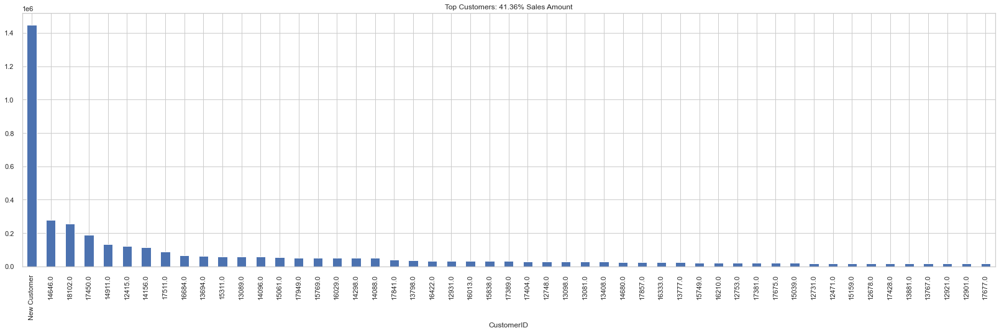

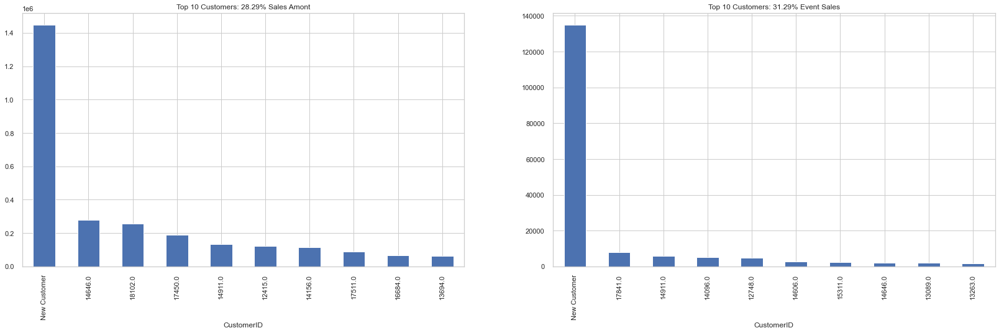

In [86]:
fig = plt.figure(figsize=(25, 7))
PercentSales =  np.round((df.groupby(["CustomerID"]).Monetary.sum().\
                          sort_values(ascending = False)[:51].sum()/df.groupby(["CustomerID"]).\
                          Monetary.sum().sort_values(ascending = False).sum()) * 100, 2)
g = df.groupby(["CustomerID"]).Monetary.sum().sort_values(ascending = False)[:51].\
    plot(kind='bar', title='Top Customers: {:3.2f}% Sales Amount'.format(PercentSales))

fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
PercentSales =  np.round((df.groupby(["CustomerID"]).Monetary.sum().\
                          sort_values(ascending = False)[:10].sum()/df.groupby(["CustomerID"]).\
                          Monetary.sum().sort_values(ascending = False).sum()) * 100, 2)
g = df.groupby(["CustomerID"]).Monetary.sum().sort_values(ascending = False)[:10]\
    .plot(kind='bar', title='Top 10 Customers: {:3.2f}% Sales Amont'.format(PercentSales))
f1 = fig.add_subplot(122)
PercentSales =  np.round((df.groupby(["CustomerID"]).Monetary.count().\
                          sort_values(ascending = False)[:10].sum()/df.groupby(["CustomerID"]).\
                          Monetary.count().sort_values(ascending = False).sum()) * 100, 2)
g = df.groupby(["CustomerID"]).Monetary.count().sort_values(ascending = False)[:10].\
    plot(kind='bar', title='Top 10 Customers: {:3.2f}% Event Sales'.format(PercentSales))

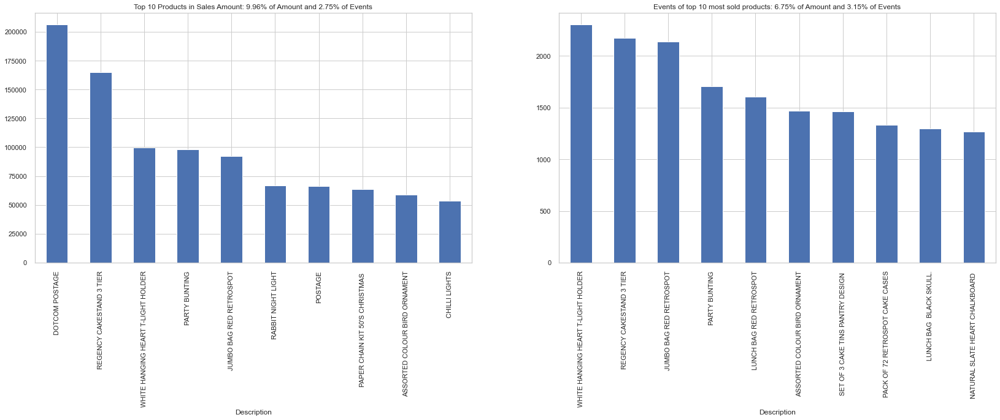

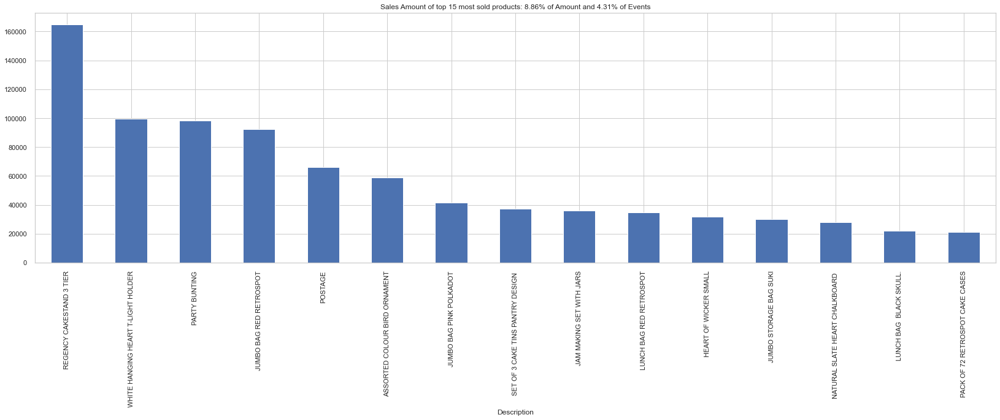

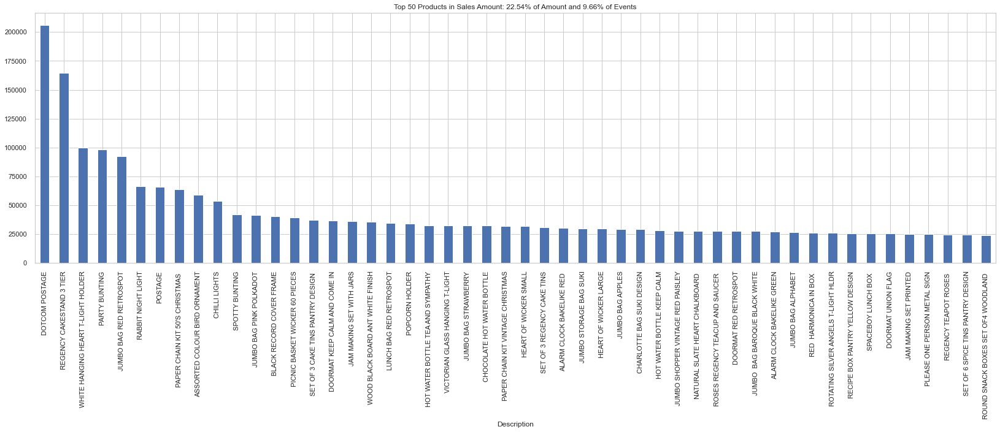

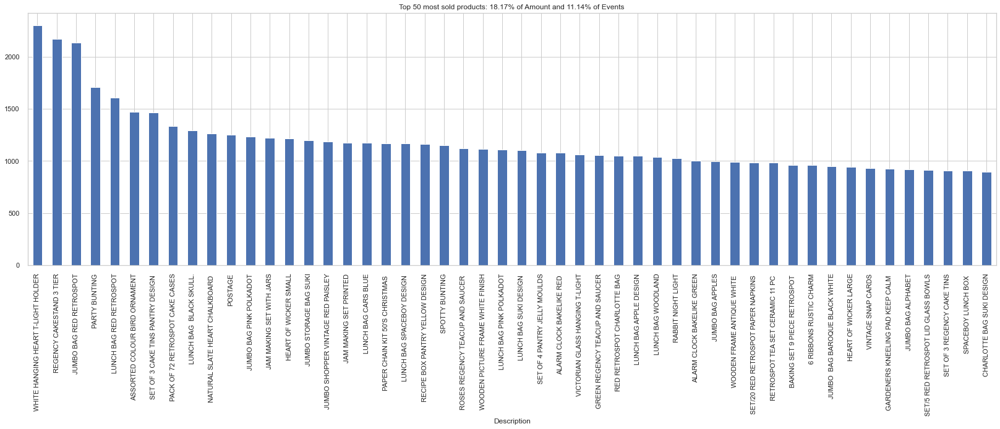

In [87]:
AmoutSum = df.groupby(["Description"]).Monetary.sum().sort_values(ascending = False)
inv = df[["Description", "InvoiceNo"]].groupby(["Description"]).InvoiceNo.unique().\
      agg(np.size).sort_values(ascending = False)

fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
Top10 = list(AmoutSum[:10].index)
PercentSales =  np.round((AmoutSum[Top10].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top10].sum()/inv.sum()) * 100, 2)
g = AmoutSum[Top10].\
    plot(kind='bar', title='Top 10 Products in Sales Amount: {:3.2f}% of Amount and {:3.2f}% of Events'.\
                       format(PercentSales, PercentEvents))

f1 = fig.add_subplot(122)
Top10Ev = list(inv[:10].index)
PercentSales =  np.round((AmoutSum[Top10Ev].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top10Ev].sum()/inv.sum()) * 100, 2)
g = inv[Top10Ev].\
    plot(kind='bar', title='Events of top 10 most sold products: {:3.2f}% of Amount and {:3.2f}% of Events'.\
                       format(PercentSales, PercentEvents))


fig = plt.figure(figsize=(25, 7))
Top15ev = list(inv[:15].index)
PercentSales =  np.round((AmoutSum[Top15ev].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top15ev].sum()/inv.sum()) * 100, 2)
g = AmoutSum[Top15ev].sort_values(ascending = False).\
    plot(kind='bar', 
         title='Sales Amount of top 15 most sold products: {:3.2f}% of Amount and {:3.2f}% of Events'.\
         format(PercentSales, PercentEvents))

fig = plt.figure(figsize=(25, 7))
Top50 = list(AmoutSum[:50].index)
PercentSales =  np.round((AmoutSum[Top50].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top50].sum()/inv.sum()) * 100, 2)
g = AmoutSum[Top50].\
    plot(kind='bar', 
         title='Top 50 Products in Sales Amount: {:3.2f}% of Amount and {:3.2f}% of Events'.\
         format(PercentSales, PercentEvents))

fig = plt.figure(figsize=(25, 7))
Top50Ev = list(inv[:50].index)
PercentSales =  np.round((AmoutSum[Top50Ev].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top50Ev].sum()/inv.sum()) * 100, 2)
g = inv[Top50Ev].\
    plot(kind='bar', title='Top 50 most sold products: {:3.2f}% of Amount and {:3.2f}% of Events'.\
                       format(PercentSales, PercentEvents))

###### Sales of all the Countries Except UK

Country
Netherlands             284661.54
EIRE                    263276.82
Germany                 221698.21
France                  197403.90
Australia               137077.27
Switzerland              56385.35
Spain                    54774.58
Belgium                  40910.96
Sweden                   36595.91
Japan                    35340.62
Norway                   35163.46
Portugal                 29367.02
Finland                  22326.74
Channel Islands          20086.29
Denmark                  18768.14
Italy                    16890.51
Cyprus                   12946.29
Austria                  10154.32
Hong Kong                10117.04
Singapore                 9120.39
Israel                    7907.82
Poland                    7213.14
Unspecified               4749.79
Greece                    4710.52
Iceland                   4310.00
Canada                    3666.38
Malta                     2505.47
United Arab Emirates      1902.28
USA                       1730.92
Lebano

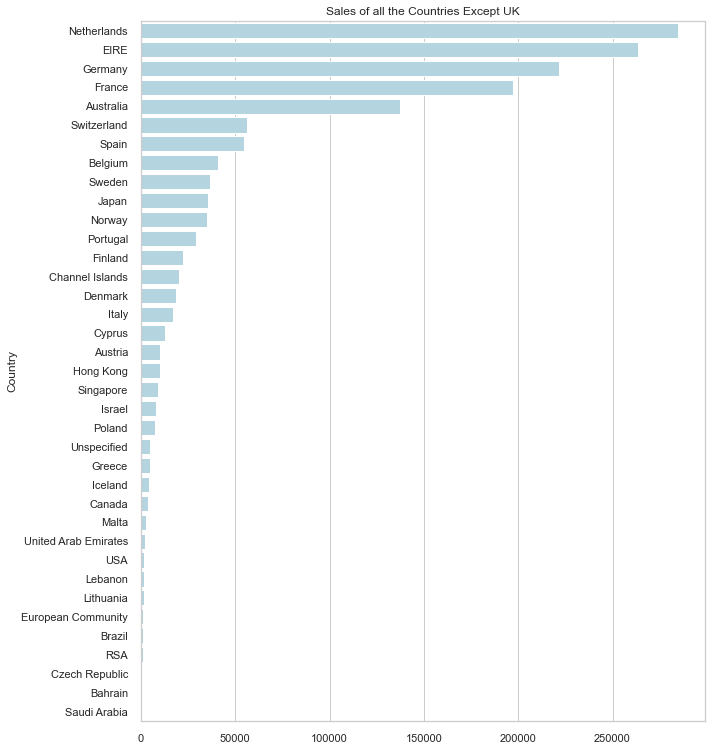

In [88]:
# looking at each country's sales

plt.rcParams['figure.figsize'] = (9, 12)
a = df['Monetary'].groupby(df['Country']).agg('sum').sort_values(ascending = False)[1:]
print(a)
sns.barplot(x = a.values, y = a.index, color = 'lightblue')
plt.title('Sales of all the Countries Except UK')
plt.show()

###### Time Series Analysis of Sales

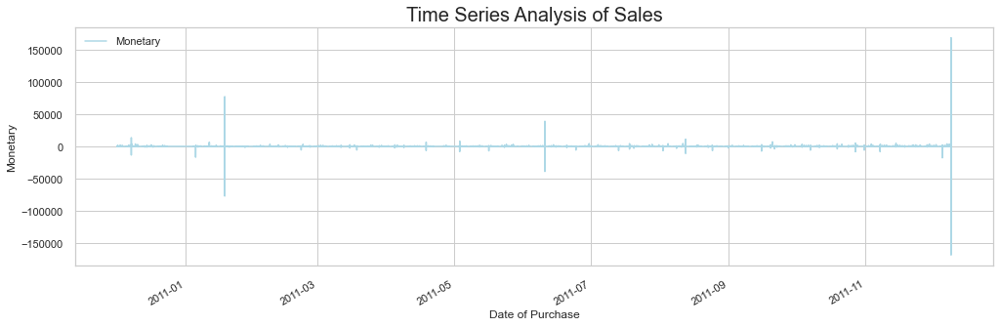

In [89]:
# Sales vs Invoicedate (Time series Analysis)

plt.rcParams['figure.figsize'] = (15, 5)
df.plot(x = 'InvoiceDate', y = 'Monetary',color='lightblue')
plt.title("Time Series Analysis of Sales", fontsize = 20)
plt.xlabel('Date of Purchase')
plt.ylabel('Monetary')
plt.show()

###### New DF by Customer

In [90]:
df_to_RFM = df[(df['Canceled']==0) & (df['CustomerID']!='New Customer')]
RFM = df_to_RFM.groupby('CustomerID')['InvoiceNo'].nunique().to_frame()
RFM.rename(columns={'InvoiceNo':'Frequency'}, inplace=True)

In [91]:
df_to_RFM.InvoiceDate = pd.to_datetime(df_to_RFM.InvoiceDate)
refrence_date = df_to_RFM.InvoiceDate.max()
print('Reference Date:', refrence_date)
df_to_RFM['days_since_last_purchase'] = (refrence_date - df_to_RFM.InvoiceDate).astype('timedelta64[D]')
Recency =  df_to_RFM[['CustomerID', 'days_since_last_purchase']].groupby("CustomerID").min()
Recency.rename(columns={'days_since_last_purchase':'Recency'}, inplace=True)
RFM = RFM.merge(Recency, how='inner', on='CustomerID')
RFM

C:\Users\Catarina Urbano\AppData\Roaming\Python\Python38\site-packages\pandas\core\generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
<ipython-input-91-945688c5e7dc>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_RFM['days_since_last_purchase'] = (refrence_date - df_to_RFM.InvoiceDate).astype('timedelta64[D]')


Reference Date: 2011-12-09 12:50:00


,Frequency,Recency
CustomerID,,
12346.0,1,325.0
12347.0,7,1.0
12348.0,4,74.0
12349.0,1,18.0
12350.0,1,309.0
...,...,...
18280.0,1,277.0
18281.0,1,180.0
18282.0,2,7.0


In [92]:
Monetary = df_to_RFM[['CustomerID', 'Monetary']].groupby("CustomerID")['Monetary'].sum().to_frame()
RFM = RFM.merge(Monetary, how='inner', on='CustomerID')
RFM

,Frequency,Recency,Monetary
CustomerID,,,
12346.0,1,325.0,77183.60
12347.0,7,1.0,4310.00
12348.0,4,74.0,1797.24
12349.0,1,18.0,1757.55
12350.0,1,309.0,334.40
...,...,...,...
18280.0,1,277.0,180.60
18281.0,1,180.0,80.82
18282.0,2,7.0,178.05


In [93]:
RFM.reset_index(level=0, inplace=True)
RFM

,CustomerID,Frequency,Recency,Monetary
0,12346.0,1,325.0,77183.60
1,12347.0,7,1.0,4310.00
2,12348.0,4,74.0,1797.24
3,12349.0,1,18.0,1757.55
4,12350.0,1,309.0,334.40
...,...,...,...,...
4334,18280.0,1,277.0,180.60
4335,18281.0,1,180.0,80.82
4336,18282.0,2,7.0,178.05
4337,18283.0,16,3.0,2094.88


# 4. Modelling <a class="anchor" id="4"></a>

### 4.1. RFM Analysis <a class="anchor" id="4.1"></a>

##### Scaling Data

In [94]:
MetricFeatures=['Frequency','Recency','Monetary']

RFM_not_standardized = RFM.copy()

# Scalling our data
df_standard = RFM.copy()
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(df_standard[MetricFeatures])
df_standard[MetricFeatures] = scaled_feat
RFM = df_standard.copy()
RFM.head()

,CustomerID,Frequency,Recency,Monetary
0,12346.0,-0.424675,2.334858,8.359634
1,12347.0,0.354080,-0.905199,0.251046
2,12348.0,-0.035297,-0.175186,-0.028546
3,12349.0,-0.424675,-0.735196,-0.032963
4,12350.0,-0.424675,2.174855,-0.191315


In [95]:
# To calculate the RFM score we used Quartiles — To make four equal parts based on the available values
quantiles = RFM.quantile(q=[0.25,0.5,0.75])
quantiles 

,CustomerID,Frequency,Recency,Monetary
0.25,13812.5,-0.424675,-0.745196,-0.194337
0.50,15299.0,-0.294882,-0.415191,-0.153478
0.75,16778.5,0.094495,0.494826,-0.043635


In [96]:
# Converting quantiles to a dictionary, easier to use.
#quantiles = quantiles.to_dict()

##  RFM Segmentation ----
RFM_Segment = RFM.copy()
# Arguments (x = value, p = recency, monetary_value, frequency, k = quartiles dict)
def R_Class(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1
    
# Arguments (x = value, p = recency, monetary_value, frequency, k = quartiles dict)
def FM_Class(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
    
RFM_Segment['R_Quartile'] = RFM_Segment['Recency'].apply(R_Class, args=('Recency',quantiles,))
RFM_Segment['F_Quartile'] = RFM_Segment['Frequency'].apply(FM_Class, args=('Frequency',quantiles,))
RFM_Segment['M_Quartile'] = RFM_Segment['Monetary'].apply(FM_Class, args=('Monetary',quantiles,))
RFMClass = RFM_Segment.R_Quartile.map(str) \
                            + RFM_Segment.F_Quartile.map(str) \
                            + RFM_Segment.M_Quartile.map(str)

RFM.insert(3,'R_Quartile',RFM_Segment['R_Quartile'])
RFM.insert(4,'F_Quartile',RFM_Segment['F_Quartile'])
RFM.insert(5,'M_Quartile',RFM_Segment['M_Quartile'])
RFM.insert(6,'RFMClass',RFMClass)

In [97]:
RFM.head()

,CustomerID,Frequency,Recency,R_Quartile,F_Quartile,M_Quartile,RFMClass,Monetary
0,12346.0,-0.424675,2.334858,1,1,4,114,8.359634
1,12347.0,0.354080,-0.905199,4,4,4,444,0.251046
2,12348.0,-0.035297,-0.175186,2,3,4,234,-0.028546
3,12349.0,-0.424675,-0.735196,3,1,4,314,-0.032963
4,12350.0,-0.424675,2.174855,1,1,2,112,-0.191315


In [98]:
aux=RFM.groupby('RFMClass')[['Monetary']].sum().sort_index(ascending=False)

# my best customers-> RFMClass = 444
print('The total monetary value of my best customers is:',aux.iloc[0])

aux.head(10)

The total monetary value of my best customers is: Monetary    380.579261
Name: 444, dtype: float64


,Monetary
RFMClass,
444,380.579261
443,-5.379876
442,-0.343271
441,-0.400541
434,8.405471
433,-18.805403
432,-8.785639
431,-1.832987
424,18.732660


In [99]:
RFM['RFM_Score'] = RFM_Segment[['R_Quartile','F_Quartile','M_Quartile']].sum(axis=1)
RFM['RFM_Score'].head()

0     6
1    12
2     9
3     8
4     4
Name: RFM_Score, dtype: int64

In [100]:
# Define rfm_level function
def rfm_level(df):
    if (df['RFMClass'] >= 434 or (df['RFM_Score'] >= 9)) :
        return 'VVIP - Can\'t Loose Them'
    elif ((df['RFM_Score'] >= 8) and (df['M_Quartile'] == 4)):
        return 'Champions Big Spenders'
    elif ((df['RFM_Score'] >= 6) and (df['F_Quartile'] >= 2)):
        return 'Loyal Customers'
    elif ((df['RFMClass'] >= 221) or (df['RFM_Score'] >= 6)):
        return 'Potential Loyalists'
    elif (((df['RFMClass'] >= 121) and (df['R_Quartile'] == 1)) or df['RFM_Score'] == 5):
        return 'Needs Attention'
    elif ((df['RFM_Score'] >= 4) and (df['R_Quartile'] == 1)):
        return 'Hibernating - Almost Lost'
    else:
        return 'Lost Customers'   #'Require Activation'
    
# Define rfm_level function
def rfm_action(df):
    if (df['RFMClass'] >= 434 or (df['RFM_Score'] >= 9)) :
        return 'No Price Incentives; Offer Limited edition and Loyality programs'
    elif ((df['RFM_Score'] >= 8) and (df['M_Quartile'] == 4)):
        return 'Upsell most expensive items'
    elif ((df['RFM_Score'] >= 6) and (df['F_Quartile'] >= 2)):
        return 'Loyality programs;Cross Sell'
    elif ((df['RFMClass'] >= 221) or (df['RFM_Score'] >= 6)):
        return 'Cross Sell Recommendations and Discount coupons'
    elif (((df['RFMClass'] >= 121) and (df['R_Quartile'] == 1)) or df['RFM_Score'] == 5):
        return 'Price incentives and Limited time offer'
    elif ((df['RFM_Score'] >= 4) and (df['R_Quartile'] == 1)):
        return 'Aggressive price incentives'
    else:
        return 'Don\'t spend too much trying to re-acquire'

In [101]:
RFM['RFMClass'] = RFM.RFMClass.apply(lambda x: int(x))
# Create a new variable RFM_Level
RFM['RFM_Level'] = RFM.apply(rfm_level, axis=1)

# Create a new variable Marketing Action
RFM['Marketing Action'] = RFM.apply(rfm_action, axis=1)
df.head()

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled,Monetary
0,536365,85123A,0,0,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,0,15.30
1,536365,71053,0,0,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0,20.34
2,536365,84406B,0,0,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,0,22.00
3,536365,84029G,0,0,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0,20.34
4,536365,84029E,0,0,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,0,20.34


In [102]:
aux = RFM_not_standardized.copy()
aux['RFM_Score']=RFM['RFM_Score'].copy()
aux['RFM_Level']=RFM['RFM_Level'].copy()
aux['Marketing Action']=RFM['Marketing Action'].copy()
# Calculate average values for each RFM_Level, and return a size of each segment 
rfm_level_agg = aux.groupby('RFM_Level').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': ['mean', 'count'],
    'Marketing Action': 'unique'
}).round(1)

rfm_level_ag = pd.DataFrame(rfm_level_agg)
rfm_level_ag = rfm_level_ag.reset_index()
rfm_level_ag

RFM_Level Recency Frequency Monetary        \
                                mean      mean     mean count   
0     Champions Big Spenders   137.0       2.7   5248.6    33   
1  Hibernating - Almost Lost   259.3       1.0    414.6   223   
2             Lost Customers   208.5       1.0    167.8   649   
3            Loyal Customers    82.4       2.7    729.0   987   
4            Needs Attention   167.8       1.5    460.2   348   
5        Potential Loyalists    44.3       1.1    645.8   480   
6    VVIP - Can't Loose Them    23.7       8.6   4538.1  1619   

                                    Marketing Action  
                                              unique  
0                      [Upsell most expensive items]  
1                      [Aggressive price incentives]  
2        [Don't spend too much trying to re-acquire]  
3                     [Loyality programs;Cross Sell]  
4          [Price incentives and Limited time offer]  
5  [Cross Sell Recommendations and Discount coupons]  
6  [No Price Incentives; Offer Limited edition an...

In [103]:
# mean of the metric features
aux.groupby('RFM_Level')[MetricFeatures].mean()

,Frequency,Recency,Monetary
RFM_Level,,,
Champions Big Spenders,2.696970,137.000000,5248.596970
Hibernating - Almost Lost,1.000000,259.336323,414.643767
Lost Customers,1.000000,208.540832,167.839569
Loyal Customers,2.675785,82.447822,729.013315
Needs Attention,1.545977,167.781609,460.215980
Potential Loyalists,1.079167,44.347917,645.796896
VVIP - Can't Loose Them,8.571958,23.688079,4538.071001


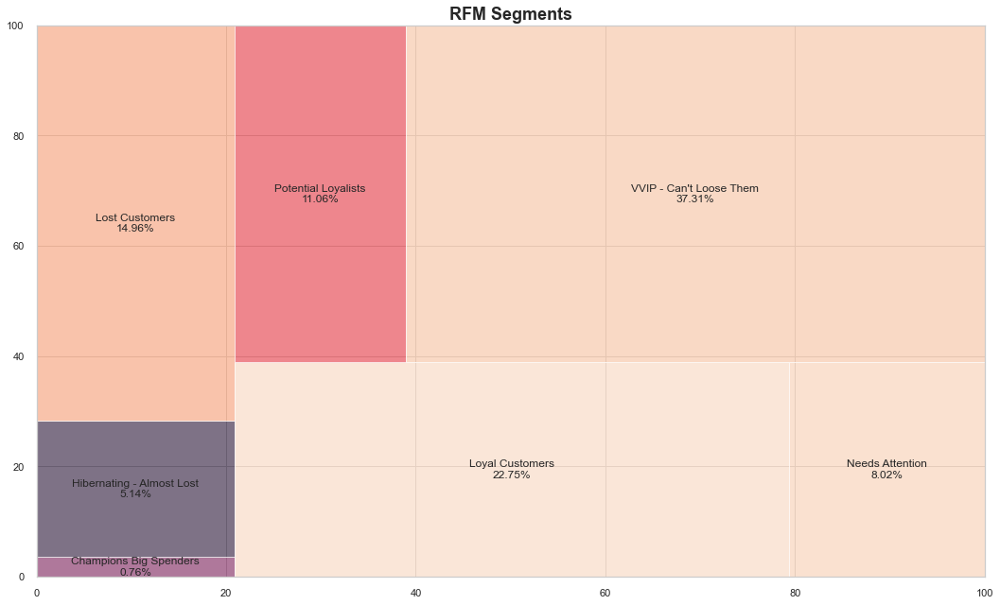

In [104]:
rfm_level_agg.columns = rfm_level_agg.columns.droplevel()
rfm_level_agg.columns = ['RecencyMean','FrequencyMean','MonetaryMean', 'Count', 'MarketingAction']
#Create our plot and resize it.

#function to also show %
def percent(var):
    return '\n'+str(round(rfm_level_agg['Count'][var]/sum(rfm_level_agg['Count'])*100,2))+'%'

fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(16, 10)
squarify.plot(sizes=rfm_level_agg['Count'], 
              label=['Champions Big Spenders'+percent('Champions Big Spenders'),
                     'Hibernating - Almost Lost'+percent('Hibernating - Almost Lost'),
                     'Lost Customers'+percent('Lost Customers'),
                     'Loyal Customers'+percent('Loyal Customers'),
                     'Needs Attention'+percent('Needs Attention'),
                     'Potential Loyalists'+percent('Potential Loyalists'),
                     'VVIP - Can\'t Loose Them'+percent('VVIP - Can\'t Loose Them')], alpha=.6 )
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('on')
plt.show()

<AxesSubplot:xlabel='count', ylabel='RFM_Level'>

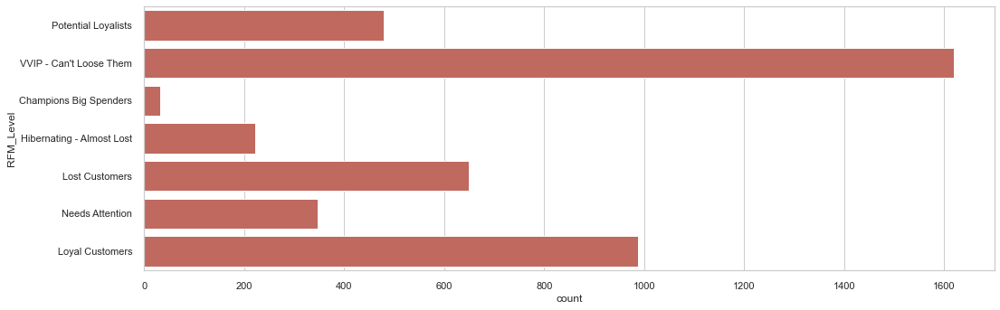

In [105]:
#### Plotting According To RFM_Label

sns.countplot(y='RFM_Level',data=RFM,palette = ['#d05c4e'])

### 4.2. Model 1 - Simple Recommender System <a class="anchor" id="4.2"></a>

#### Association Rules Mining

In [106]:
df_backup = df.copy()
df = df[(df['Canceled']==0) & (df['CustomerID']!='New Customer')]

In [107]:
#Get the frequency of different countries in the datasets
df['Country'].value_counts().head()

United Kingdom    354345
Germany             9042
France              8342
EIRE                7238
Spain               2485
Name: Country, dtype: int64

Function that return association rules for a given country

In [108]:
def generate_country_rules(country, min_support=0.07, df=df):
    
    basket = (df[df['Country'] ==country]
          .groupby(['InvoiceNo', 'Description'])['Quantity']
          .sum().unstack().reset_index().fillna(0)
          .set_index('InvoiceNo'))
    
    #Convert those >0 to 1 and 0s to 0
    basket = basket.apply(lambda x: x/x).fillna(0)
    frequent_itemsets = apriori(basket, min_support=min_support, use_colnames=True)
    rules = association_rules(frequent_itemsets, metric="lift", min_threshold=0).sort_values(by=['lift'], ascending=False)
    return rules

The function takes a product, the rules, and returns `n` recommendations for the product

In [109]:
def get_mba_recommendations(prod_selected, rules, n=2):

    recommendations = rules[rules['antecedents']==frozenset({prod_selected})]['consequents'].tolist()[:n]
    recommendations = [list(x)[0] for x in recommendations]
    return recommendations

In [110]:
# generate rules for products sold in France
rules = generate_country_rules('Germany')
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
35,(ROUND SNACK BOXES SET OF 4 FRUITS ),"(ROUND SNACK BOXES SET OF4 WOODLAND , POSTAGE)",0.157549,0.225383,0.124726,0.791667,3.512540,0.089218,3.718162
30,"(ROUND SNACK BOXES SET OF4 WOODLAND , POSTAGE)",(ROUND SNACK BOXES SET OF 4 FRUITS ),0.225383,0.157549,0.124726,0.553398,3.512540,0.089218,1.886357
27,(ROUND SNACK BOXES SET OF 4 FRUITS ),(ROUND SNACK BOXES SET OF4 WOODLAND ),0.157549,0.245077,0.131291,0.833333,3.400298,0.092679,4.529540
26,(ROUND SNACK BOXES SET OF4 WOODLAND ),(ROUND SNACK BOXES SET OF 4 FRUITS ),0.245077,0.157549,0.131291,0.535714,3.400298,0.092679,1.814509
33,(ROUND SNACK BOXES SET OF4 WOODLAND ),"(POSTAGE, ROUND SNACK BOXES SET OF 4 FRUITS )",0.245077,0.150985,0.124726,0.508929,3.370730,0.087724,1.728904
32,"(POSTAGE, ROUND SNACK BOXES SET OF 4 FRUITS )",(ROUND SNACK BOXES SET OF4 WOODLAND ),0.150985,0.245077,0.124726,0.826087,3.370730,0.087724,4.340810
28,(SPACEBOY LUNCH BOX ),(ROUND SNACK BOXES SET OF4 WOODLAND ),0.102845,0.245077,0.070022,0.680851,2.778116,0.044817,2.365427
29,(ROUND SNACK BOXES SET OF4 WOODLAND ),(SPACEBOY LUNCH BOX ),0.245077,0.102845,0.070022,0.285714,2.778116,0.044817,1.256018
12,(ROUND SNACK BOXES SET OF4 WOODLAND ),(PLASTERS IN TIN WOODLAND ANIMALS),0.245077,0.137856,0.074398,0.303571,2.202098,0.040613,1.237951
13,(PLASTERS IN TIN WOODLAND ANIMALS),(ROUND SNACK BOXES SET OF4 WOODLAND ),0.137856,0.245077,0.074398,0.539683,2.202098,0.040613,1.640006


In [111]:
# Select a product and get 2 recommendations for the product
get_mba_recommendations('POSTAGE', rules,2)

['ROUND SNACK BOXES SET OF 4 FRUITS ', 'ROUND SNACK BOXES SET OF4 WOODLAND ']

#### Rank Based Recommendations

Function that returns top n products used by most number of people

In [112]:
def get_top_products(n, df=df):
    
    # Most popular products
    # Products purchased by most number of customers
    top_products = df.groupby(['Description'])['CustomerID'].nunique().sort_values(ascending=False).iloc[:n].index.tolist()
    return top_products

In [113]:
#Print top 5 products 
get_top_products(5)

['REGENCY CAKESTAND 3 TIER',
 'WHITE HANGING HEART T-LIGHT HOLDER',
 'PARTY BUNTING',
 'ASSORTED COLOUR BIRD ORNAMENT',
 'SET OF 3 CAKE TINS PANTRY DESIGN ']

#### User-User based collaborative Filtering

Return a matrix with user ids as rows and description on the columns with 1 values where a user purchased a product 
and a 0 otherwise

In [114]:
def create_user_item_matrix(df_ui):

    user_item = df_ui.groupby(['CustomerID', 'Description'])['Description'].nunique().unstack()
    user_item.fillna(0, inplace=True)
    return user_item

user_item = create_user_item_matrix(df)
user_item.head()


Description,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,SPACEBOY BABY GIFT SET,...,ZINC STAR T-LIGHT HOLDER,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
CustomerID,,,,,,,,,,,,,,,,,,,,,
12346.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12347.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12348.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12349.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12350.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [115]:
# Get results for selected user
selected_user_id = 14307.0
selected_products = ['10 COLOUR SPACEBOY PEN', '12 COLOURED PARTY BALLOONS']
df[(df['CustomerID']==selected_user_id) & (df['Description'].isin(selected_products))]

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled,Monetary
448,536408,22418,0,0,10 COLOUR SPACEBOY PEN,24,2010-12-01 11:41:00,0.85,14307.0,United Kingdom,0,20.4
63665,541588,22418,0,0,10 COLOUR SPACEBOY PEN,24,2011-01-19 14:43:00,0.85,14307.0,United Kingdom,0,20.4
281534,561534,22436,0,0,12 COLOURED PARTY BALLOONS,20,2011-07-28 09:45:00,0.65,14307.0,United Kingdom,0,13.0


Function that computes the similarity of every pair of users based on the dot product and returns a list of strings containing user names ordered by similarity

In [116]:
def find_similar_users(user_id, user_item=user_item):

    # compute similarity of each user to the provided user
    similar_mat = user_item.dot(user_item.loc[user_id].T)
    # sort by similarity
    most_similar_users = similar_mat.sort_values(ascending=False).index.tolist()

    most_similar_users.remove(user_id)
       
    return most_similar_users # return a list of the users in order from most to least similar

In [117]:
user_sim_top10 = find_similar_users(selected_user_id)[:10]
print("The 10 most similar users to user {} are: {}".format(selected_user_id, user_sim_top10))

The 10 most similar users to user 14307.0 are: [14911.0, 12748.0, 14096.0, 17841.0, 14769.0, 13089.0, 14156.0, 14646.0, 13081.0, 14456.0]


In [118]:
#Print the matrix for the users similar to selected_user
user_item.loc[user_sim_top10]

Description,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,SPACEBOY BABY GIFT SET,...,ZINC STAR T-LIGHT HOLDER,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
CustomerID,,,,,,,,,,,,,,,,,,,,,
14911.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
12748.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
14096.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
17841.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
14769.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
13089.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
14156.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
14646.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
13081.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Function that provides a list of the products that have been purchased by a user

In [119]:
def get_user_products(user_id, user_item=user_item):

    s = pd.Series(user_item.loc[user_id])
    products = s[s == 1].index.tolist()
    
    return products

In [120]:
#Print products purchased by selected_user_id
get_user_products(selected_user_id)

[' SPACEBOY BABY GIFT SET',
 '10 COLOUR SPACEBOY PEN',
 '12 COLOURED PARTY BALLOONS',
 '12 PENCILS TALL TUBE SKULLS',
 '3 PIECE SPACEBOY COOKIE CUTTER SET',
 '3 TRADITIONAl BISCUIT CUTTERS  SET',
 '36 FOIL HEART CAKE CASES',
 '36 PENCILS TUBE SKULLS',
 '36 PENCILS TUBE WOODLAND',
 '3D HEARTS  HONEYCOMB PAPER GARLAND',
 '4 TRADITIONAL SPINNING TOPS',
 "6 GIFT TAGS 50'S CHRISTMAS ",
 '6 ROCKET BALLOONS ',
 '60 CAKE CASES VINTAGE CHRISTMAS',
 'AIRLINE BAG VINTAGE TOKYO 78',
 'ANTIQUE SILVER T-LIGHT GLASS',
 'ASSORTED COLOUR BIRD ORNAMENT',
 'BAG 500g SWIRLY MARBLES',
 'BAKING MOULD CHOCOLATE CUPCAKES',
 'BAKING MOULD HEART WHITE CHOCOLATE',
 'BAKING MOULD ROSE MILK CHOCOLATE',
 'BAKING SET 9 PIECE RETROSPOT ',
 'BAKING SET SPACEBOY DESIGN',
 'BALLOON PUMP WITH 10 BALLOONS',
 "BISCUIT TIN 50'S CHRISTMAS",
 'BISCUIT TIN VINTAGE CHRISTMAS',
 'BLACK/BLUE POLKADOT UMBRELLA',
 'BLUE COAT RACK PARIS FASHION',
 'BLUE HARMONICA IN BOX ',
 'BLUE POLKADOT WRAP',
 "BOX OF 6 MINI 50'S CRACKERS",
 'BOX

Function that returns a list of recommendations for the user.

To note that the users who are the same closeness are chosen arbitrarily as the 'next' user, and for the user where the number of recommended products starts below m and ends exceeding m, the last items are chosen arbitrarily.

In [121]:
def user_user_recs(user_id, m=10):

    #We dont want to recommend there
    products_purchased = get_user_products(user_id)
    closest_neighbors = find_similar_users(user_id)
        
    # Keep the recommended products here
    recs = np.array([])
    
    # Go through the neighbors and identify products they like the user hasn't seen
    for neighbor in closest_neighbors:
        neighbs_likes = get_user_products(neighbor)[0]
        
        #Obtain recommendations for each neighbor
        new_recs = np.setdiff1d(neighbs_likes, products_purchased, assume_unique=True)
        
        # Update recs with new recs
        recs = np.unique(np.concatenate([new_recs, recs], axis=0))
        
        # If we have enough recommendations exit the loop
        if len(recs) > m-1:
            break
    
    return recs

In [122]:
# Return 10 recommendations for selected user
user_user_recs(selected_user_id, 10)

array([' 4 PURPLE FLOCK DINNER CANDLES', " 50'S CHRISTMAS GIFT BAG LARGE",
       ' DOLLY GIRL BEAKER', ' I LOVE LONDON MINI BACKPACK',
       ' OVAL WALL MIRROR DIAMANTE ', ' SET 2 TEA TOWELS I LOVE LONDON ',
       ' TRELLIS COAT RACK', '12 IVORY ROSE PEG PLACE SETTINGS',
       '3 GARDENIA MORRIS BOXED CANDLES', '3 STRIPEY MICE FELTCRAFT'],
      dtype='<U32')

###### Matrix Factorization

In [123]:
user_item_matrix = user_item.copy()
user_item_matrix.head()

Description,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,SPACEBOY BABY GIFT SET,...,ZINC STAR T-LIGHT HOLDER,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
CustomerID,,,,,,,,,,,,,,,,,,,,,
12346.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12347.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12348.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12349.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12350.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [124]:
u, s, vt = np.linalg.svd(user_item_matrix, full_matrices=False)# use the built in to get the three matrices
u.shape, s.shape, vt.shape

((4339, 3877), (3877,), (3877, 3877))

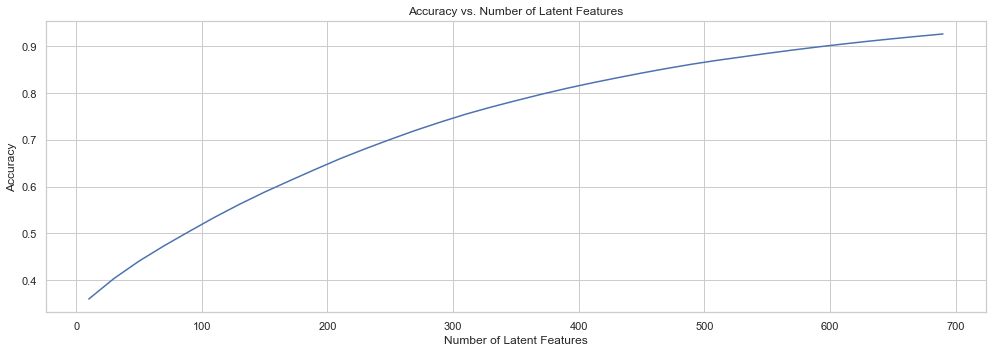

In [125]:

num_latent_feats = np.arange(10,700+10,20)
sum_errs = []

for k in num_latent_feats:
    # restructure with k latent features
    s_new, u_new, vt_new = np.diag(s[:k]), u[:, :k], vt[:k, :]
    
    # take dot product
    user_item_est = np.around(np.dot(np.dot(u_new, s_new), vt_new))
    
    # compute error for each prediction to actual value
    diffs = np.subtract(user_item_matrix, user_item_est)
    
    # total errors and keep track of them
    err = np.sum(np.sum(np.abs(diffs)))
    sum_errs.append(err)
    
    
plt.plot(num_latent_feats, 1 - np.array(sum_errs)/df.shape[0]);
plt.xlabel('Number of Latent Features');
plt.ylabel('Accuracy');
plt.title('Accuracy vs. Number of Latent Features');

###### Make Recommendations now

In [126]:
num_recommendations = 5

In [127]:
## New User
get_top_products(n = num_recommendations)

['REGENCY CAKESTAND 3 TIER',
 'WHITE HANGING HEART T-LIGHT HOLDER',
 'PARTY BUNTING',
 'ASSORTED COLOUR BIRD ORNAMENT',
 'SET OF 3 CAKE TINS PANTRY DESIGN ']

In [128]:
## New user with one product
prod_selected = 'POSTAGE'
s = get_mba_recommendations(prod_selected,rules, num_recommendations)
s

['ROUND SNACK BOXES SET OF 4 FRUITS ',
 'ROUND SNACK BOXES SET OF4 WOODLAND ',
 'PLASTERS IN TIN SPACEBOY',
 'ROUND SNACK BOXES SET OF4 WOODLAND ',
 'WOODLAND CHARLOTTE BAG']

In [129]:
## Old User
user_selected = 13299.0
sel_user_products = get_user_products(user_selected)
sel_user_recs = user_user_recs(user_selected)
print("Products used by user %s "%str(user_selected))
print(sel_user_products)
print("Products recommended")
print(sel_user_recs)

Products used by user 13299.0 
['NATURAL SLATE CHALKBOARD LARGE ', 'NATURAL SLATE HEART CHALKBOARD ', 'PICNIC BASKET WICKER LARGE', 'ROSES REGENCY TEACUP AND SAUCER ', 'ROUND SNACK BOXES SET OF4 WOODLAND ']
Products recommended
[' 4 PURPLE FLOCK DINNER CANDLES' " 50'S CHRISTMAS GIFT BAG LARGE"
 ' DOLLY GIRL BEAKER' ' SET 2 TEA TOWELS I LOVE LONDON '
 ' TRELLIS COAT RACK' '12 COLOURED PARTY BALLOONS'
 '12 IVORY ROSE PEG PLACE SETTINGS' '15CM CHRISTMAS GLASS BALL 20 LIGHTS'
 '3 HEARTS HANGING DECORATION RUSTIC' '3 HOOK PHOTO SHELF ANTIQUE WHITE']


In [130]:
#To test, we can see what the users similar to our selected users have purchased.
most_similar_user = find_similar_users(user_selected)[0]
sim_user_products = get_user_products(most_similar_user)
products_purchased_by_both_users = np.intersect1d(sel_user_products, sim_user_products)
print("Most similar user: %s"%str(most_similar_user))
print("Products purchased by most similar user:")
print(products_purchased_by_both_users)

Most similar user: 14156.0
Products purchased by most similar user:
['NATURAL SLATE CHALKBOARD LARGE ' 'NATURAL SLATE HEART CHALKBOARD '
 'PICNIC BASKET WICKER LARGE' 'ROSES REGENCY TEACUP AND SAUCER '
 'ROUND SNACK BOXES SET OF4 WOODLAND ']


### 4.3. Model 2 - ALS Model <a class="anchor" id="4.3"></a>

In [131]:
RecommendationSystem1 = df_backup[(df_backup['CustomerID']!='New Customer') & (df_backup['Canceled']==0)]

Function that removes users and items with less than uid_min and iid_min event occurrences, respectively

In [132]:
def threshold_ratings(df, uid_min, iid_min, max_iter=None):
    
    n_users = df['CustomerID'].nunique()
    n_items = df['StockCode'].nunique()
    sparsity = float(df.shape[0]) / float(n_users * n_items) * 100
    print('Raw dataset info \n-----------------')
    print('Number of users: {}'.format(n_users))
    print('Number of items: {}'.format(n_items))
    print('Sparsity: {:4.3f}%'.format(sparsity))
    
    done, i = False, 0
    while not done:
        # When we exclude users with freq less than uid_min we might end up with new 
        # items with freq less than iid_min, so we will have to alternate back and forth
        starting_shape = df.shape[0]  # number of existing events

        uid_counts = df.groupby('CustomerID').size()  # user id frequencies
        df = df[~df['StockCode'].isin(uid_counts[uid_counts < uid_min].index.tolist())]  # keep events with users with frequency >= uid_min

        iid_counts = df.groupby('StockCode').size()  # item id frequencies
        df = df[~df['StockCode'].isin(iid_counts[iid_counts < iid_min].index.tolist())]  # keep events with items with frequency >= iid_min

        ending_shape = df.shape[0]  # number of existing events after filters
        i += 1
        if starting_shape == ending_shape or i == max_iter:  # convergence happens
            done = True
    
    #if not max_iter:
    #    assert(df.groupby('CustomerID').size().min() >= uid_min)
    #    assert(df.groupby('StockCode').size().min() >= iid_min)
        
        
    n_users = df['CustomerID'].nunique()
    n_items = df['StockCode'].nunique()
    sparsity = float(df.shape[0]) / float(n_users * n_items) * 100
    print('Limited dataset info \n-----------------')
    print('Number of iterations until convergence: {}'.format(i))
    print('Number of users: {}'.format(n_users))
    print('Number of items: {}'.format(n_items))
    print('Sparsity: {:4.3f}%'.format(sparsity))
    return df    

In [133]:
# get limited dataset
df_limited = threshold_ratings(RecommendationSystem1, 7, 7)

Raw dataset info 
-----------------
Number of users: 4339
Number of items: 3665
Sparsity: 2.502%
Limited dataset info 
-----------------
Number of iterations until convergence: 2
Number of users: 4338
Number of items: 3049
Sparsity: 2.995%


##### Split in train and test

In [134]:
# Train-test split
start_train = df_limited['InvoiceDate'].min()
start_test = start_train + pd.to_timedelta(15, unit='w')
end_test = start_test + pd.to_timedelta(5, unit='w')

# Create new limited df
df_limited = df_limited.loc[(df_limited['InvoiceDate'] > start_train) & (df_limited['InvoiceDate'] <= end_test)]

# Create train_split flag
df_limited['train_split'] = (df_limited['InvoiceDate'] <= start_test).astype(int)
print("Proportion of train events: {:.2f}".format(df_limited['train_split'].mean()))

Proportion of train events: 0.71


In [135]:
# the Categoricals data structure consists of a categories array and an integer array of codes which point to 
#    the real value in the categories array
user_cat = df_limited['CustomerID'].astype('category')
item_cat = df_limited['StockCode'].astype("category")

# create a sparse matrix of all the item/user/counts triples for the train set and test set
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.coo_matrix.html#scipy.sparse.coo_matrix
item_user_train = coo_matrix((df_limited['train_split'],
                              (item_cat.cat.codes,
                               user_cat.cat.codes))).tocsr()
item_user_train.eliminate_zeros()  # remove zero entries
# produce transpose of item_user_train
user_item_train = item_user_train.T

item_user_test = coo_matrix(((~df_limited['train_split'].astype(bool)).astype(int),
                             (item_cat.cat.codes,
                              user_cat.cat.codes))).tocsr()
item_user_test.eliminate_zeros()  # remove zero entries
# produce transpose of item_user_test
user_item_test = item_user_test.T

# map each item and user category to a unique numeric code
user_map = dict(zip(user_cat, user_cat.cat.codes))
item_map = dict(zip(item_cat, item_cat.cat.codes))

def get_keys(value, dictionary):
    """Function to get dictionary keys with specifiec value"""
    return list(dictionary.keys())[list(dictionary.values()).index(value)]

# confirm shapes
print(f"train set shape: {item_user_train.shape} and test set shape: {item_user_test.shape}")

# check sparsity
pzeros_train = 100 * (1 - item_user_train.count_nonzero() / (item_user_train.shape[0] * item_user_train.shape[1]))
pzeros_test = 100 * (1 - item_user_test.count_nonzero() / (item_user_test.shape[0] * item_user_test.shape[1]))
print(f"train set percentage of zeros: {pzeros_train} and test set percentage of zeros: {pzeros_test}")

train set shape: (2525, 2365) and test set shape: (2525, 2365)
train set percentage of zeros: 98.9003998074226 and test set percentage of zeros: 99.49832750716932


In [136]:
df_limited[df_limited['train_split'] == 1]

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled,Monetary,train_split
7,536366,22633,0,0,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom,0,11.10,1
8,536366,22632,0,0,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom,0,11.10,1
9,536367,84879,0,0,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom,0,54.08,1
10,536367,22745,0,0,POPPY'S PLAYHOUSE BEDROOM,6,2010-12-01 08:34:00,2.10,13047.0,United Kingdom,0,12.60,1
11,536367,22748,0,0,POPPY'S PLAYHOUSE KITCHEN,6,2010-12-01 08:34:00,2.10,13047.0,United Kingdom,0,12.60,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
120841,546679,21224,0,0,SET/4 SKULL BADGES,3,2011-03-15 16:47:00,1.25,13121.0,United Kingdom,0,3.75,1
120842,546679,21987,0,0,PACK OF 6 SKULL PAPER CUPS,8,2011-03-15 16:47:00,0.65,13121.0,United Kingdom,0,5.20,1
120843,546679,21967,0,0,PACK OF 12 SKULL TISSUES,12,2011-03-15 16:47:00,0.29,13121.0,United Kingdom,0,3.48,1
120844,546679,21207,0,0,SKULL AND CROSSBONES GARLAND,6,2011-03-15 16:47:00,1.65,13121.0,United Kingdom,0,9.90,1


In [137]:
# users with no items on the train set and not items on the test set
zero_users_test = (np.squeeze(np.asarray(user_item_test.sum(axis=1))) == 0).nonzero()[0]
zero_users_train = (np.squeeze(np.asarray(user_item_train.sum(axis=1))) == 0).nonzero()[0]
set(zero_users_test).intersection(zero_users_train)

set()

In [138]:
# most frequent user, item pair in train set
item_id, user_id = np.unravel_index(item_user_train.argmax(), item_user_train.shape)
item_id, user_id = get_keys(item_id, item_map), get_keys(user_id, user_map)
df_limited.loc[(df_limited['CustomerID'] == user_id) & (df_limited['StockCode'] == item_id) & (df_limited['train_split'] == 1)]

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled,Monetary,train_split
2095,536557,79321,0,0,CHILLI LIGHTS,24,2010-12-01 14:41:00,4.25,17841.0,United Kingdom,0,102.00,1
6995,536984,79321,0,0,CHILLI LIGHTS,24,2010-12-03 14:35:00,4.25,17841.0,United Kingdom,0,102.00,1
12963,537405,79321,0,0,CHILLI LIGHTS,30,2010-12-06 14:51:00,4.25,17841.0,United Kingdom,0,127.50,1
30437,538866,79321,0,0,CHILLI LIGHTS,24,2010-12-14 14:40:00,4.25,17841.0,United Kingdom,0,102.00,1
37526,539469,79321,0,0,CHILLI LIGHTS,24,2010-12-19 13:59:00,4.25,17841.0,United Kingdom,0,102.00,1
42796,540021,79321,0,0,CHILLI LIGHTS,48,2011-01-04 12:51:00,4.25,17841.0,United Kingdom,0,204.00,1
49899,540538,79321,0,0,CHILLI LIGHTS,34,2011-01-09 14:36:00,4.25,17841.0,United Kingdom,0,144.50,1
54377,540943,79321,0,0,CHILLI LIGHTS,3,2011-01-12 12:31:00,4.95,17841.0,United Kingdom,0,14.85,1
58579,541253,79321,0,0,CHILLI LIGHTS,30,2011-01-16 13:51:00,4.25,17841.0,United Kingdom,0,127.50,1
63631,541587,79321,0,0,CHILLI LIGHTS,24,2011-01-19 14:39:00,4.25,17841.0,United Kingdom,0,102.00,1


In [139]:
# initialize a model
alpha = 40  # as we observe more evidence for positive preference, our confidence in pui = 1 increases according to alpha (rate of increase)
als_model = AlternatingLeastSquares(factors=200, regularization=0.01, iterations=30, random_state=0)

# train the model on a sparse matrix of item/user/confidence weights
# about the alpha hyperparameter: https://github.com/benfred/implicit/issues/199#issuecomment-490350326
als_model.fit((item_user_train * alpha).astype('double'))

  0%|          | 0/30 [00:00<?, ?it/s]

In [140]:
# recommend items for a user. 
# the recommended items have the largest inner product with the user vector
user_id = list(user_map.keys())[0]
recommendations = als_model.recommend(user_map[user_id], user_item_train)
list(map(lambda x: (get_keys(x[0], item_map), x[1]), recommendations))

[('84029E', 1.0028708),
 ('22411', 1.0026293),
 ('22633', 1.0011414),
 ('71053', 1.0007061),
 ('15056BL', 1.0005265),
 ('82482', 1.0003834),
 ('85123A', 1.0002384),
 ('84029G', 1.0001209),
 ('22632', 0.9997663),
 ('22752', 0.9994468)]

In [141]:
# find related items
# the related items have the largest inner product with the item vector
item_id = list(item_map.keys())[0]
related = als_model.similar_items(item_map[item_id])
list(map(lambda x: (get_keys(x[0], item_map), x[1]), related))

[('22633', 1.0),
 ('22866', 0.728067),
 ('22632', 0.67828435),
 ('22867', 0.61870784),
 ('22865', 0.59873736),
 ('82616B', 0.51987946),
 ('20748', 0.5172534),
 ('15058B', 0.5025137),
 ('21293', 0.49957877),
 ('85106', 0.49881187)]

In [142]:
# show the top 10 items that explain the recommended item to the user
# It is possible to write the LVM as a linear function between preferences and past actions.
# We can then see what are the actions associated with the highest contributions to the given recommendation.
score, contributions, user_weights = als_model.explain(user_map[user_id], 
                                                       user_item_train,
                                                       item_map[item_id])
print("The score of the user/item pair is: ", score)
print("The top N (itemid, score) contributions for this user/item pair are:\n", list(map(lambda x: (get_keys(x[0], item_map), x[1]), contributions)))

The score of the user/item pair is:  0.8605848710982934
The top N (itemid, score) contributions for this user/item pair are:
 [('22633', 0.6472644128047508), ('22632', 0.16249756160265477), ('21730', 0.021715400342071405), ('85123A', 0.018840016372998467), ('84029G', 0.017778246592666823), ('22752', 0.016679625760381976), ('84406B', 0.01565145533079738), ('82494L', 0.012940027724893197), ('20679', 0.005761948089024975), ('21071', 0.005527806626098904)]


In [143]:
# Baseline: Recommend the most popular items to every user
class PopularRecommender():
    """Baseline Recommender that always suggests the most popular items to every user.
    """
    def fit(self, item_users):
        self.item_id_sort = np.argsort(np.squeeze(np.asarray(item_users.sum(axis=1).reshape(-1))))[::-1]
    
    def recommend(self, userid, user_items, N=10, filter_already_liked_items=None, filter_items=None, recalculate_user=None):
        if filter_already_liked_items != None or filter_items != None or recalculate_user != None:
            raise NotImplementedError("filter_already_liked_items, filter_items and recalculate_user aren't support yet")
        
        return list(zip(self.item_id_sort[:N], range(1, N + 1)))

In [144]:
# Fitting PopularRecommender model
pop_model = PopularRecommender()
pop_model.fit(item_user_train)

In [145]:
# Evaluate models. 
# Precision at K, Mean Average Precision at K, Normalized Discounted Cumulative Gain at K, AUC at K
eval_models = {'pop_model': pop_model, 'als_model': als_model}
eval_table = {}
for k, v in eval_models.items():
    eval_table[k] = ranking_metrics_at_k(v, user_item_train, user_item_test, K=10, show_progress=True, num_threads=0)
eval_table = pd.DataFrame(eval_table)
eval_table

  0%|          | 0/2365 [00:00<?, ?it/s]

  0%|          | 0/2365 [00:00<?, ?it/s]

,pop_model,als_model
precision,0.098408,0.046667
map,0.048907,0.018135
ndcg,0.109868,0.045662
auc,0.522855,0.507764


### 4.4. Model 3 - ALS Model with restrictions <a class="anchor" id="4.4"></a>

#### Drop the entries with Customers with less than 10 invoices and products purchased 1 time

In [146]:
RS = df_backup[(df_backup['CustomerID']!='New Customer') & (df_backup['Canceled']==0)] 

#remove users who only bought once
Ident = RS.groupby('CustomerID')['InvoiceNo'].nunique().to_frame()
Ident.columns=['Frequency']
RS = pd.merge(RS, Ident, how='left', on='CustomerID')
RS = RS[RS['Frequency']>10] 

In [147]:
#remove products sold only once
Ident = RS.groupby('StockCode')['InvoiceNo'].nunique().to_frame()
Ident.columns=['Prod_Frequency']
RS = pd.merge(RS, Ident, how='left', on='StockCode')
RS = RS[RS['Prod_Frequency']>1]

In [148]:
# get limited dataset
df_limited = threshold_ratings(RS, 7, 7)

Raw dataset info 
-----------------
Number of users: 337
Number of items: 3079
Sparsity: 13.568%
Limited dataset info 
-----------------
Number of iterations until convergence: 2
Number of users: 337
Number of items: 2475
Sparsity: 16.615%


##### Split in train and test

In [149]:
# Train-test split
start_train = df_limited['InvoiceDate'].min()
start_test = start_train + pd.to_timedelta(15, unit='w')
end_test = start_test + pd.to_timedelta(5, unit='w')

# Create new limited df
df_limited = df_limited.loc[(df_limited['InvoiceDate'] > start_train) & (df_limited['InvoiceDate'] <= end_test)]

# Create train_split flag
df_limited['train_split'] = (df_limited['InvoiceDate'] <= start_test).astype(int)
print("Proportion of train events: {:.2f}".format(df_limited['train_split'].mean()))

Proportion of train events: 0.73


In [150]:
# the Categoricals data structure consists of a categories array and an integer array of codes which point to 
#    the real value in the categories array
user_cat = df_limited['CustomerID'].astype('category')
item_cat = df_limited['StockCode'].astype("category")

# create a sparse matrix of all the item/user/counts triples for the train set and test set
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.coo_matrix.html#scipy.sparse.coo_matrix
item_user_train = coo_matrix((df_limited['train_split'],
                              (item_cat.cat.codes,
                               user_cat.cat.codes))).tocsr()
item_user_train.eliminate_zeros()  # remove zero entries
# produce transpose of item_user_train
user_item_train = item_user_train.T

item_user_test = coo_matrix(((~df_limited['train_split'].astype(bool)).astype(int),
                             (item_cat.cat.codes,
                              user_cat.cat.codes))).tocsr()
item_user_test.eliminate_zeros()  # remove zero entries
# produce transpose of item_user_test
user_item_test = item_user_test.T

# map each item and user category to a unique numeric code
user_map = dict(zip(user_cat, user_cat.cat.codes))
item_map = dict(zip(item_cat, item_cat.cat.codes))

def get_keys(value, dictionary):
    """Function to get dictionary keys with specifiec value"""
    return list(dictionary.keys())[list(dictionary.values()).index(value)]

# confirm shapes
print(f"train set shape: {item_user_train.shape} and test set shape: {item_user_test.shape}")

# check sparsity
pzeros_train = 100 * (1 - item_user_train.count_nonzero() / (item_user_train.shape[0] * item_user_train.shape[1]))
pzeros_test = 100 * (1 - item_user_test.count_nonzero() / (item_user_test.shape[0] * item_user_test.shape[1]))
print(f"train set percentage of zeros: {pzeros_train} and test set percentage of zeros: {pzeros_test}")

train set shape: (1986, 324) and test set shape: (1986, 324)
train set percentage of zeros: 96.76842838138575 and test set percentage of zeros: 98.53449454825756


In [151]:
df_limited[df_limited['train_split'] == 1]

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled,Monetary,Frequency,Prod_Frequency,train_split
7,536366,22633,0,0,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom,0,11.1,34,111,1
8,536366,22632,0,0,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom,0,11.1,34,102,1
9,536370,22728,0,0,ALARM CLOCK BAKELIKE PINK,24,2010-12-01 08:45:00,3.75,12583.0,France,0,90.0,15,250,1
10,536370,22727,0,0,ALARM CLOCK BAKELIKE RED,24,2010-12-01 08:45:00,3.75,12583.0,France,0,90.0,15,378,1
11,536370,22726,0,0,ALARM CLOCK BAKELIKE GREEN,12,2010-12-01 08:45:00,3.75,12583.0,France,0,45.0,15,359,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30183,546678,22652,0,0,TRAVEL SEWING KIT,10,2011-03-15 16:39:00,1.65,12681.0,France,0,16.5,22,146,1
30184,546678,22895,0,0,SET OF 2 TEA TOWELS APPLE AND PEARS,6,2011-03-15 16:39:00,2.95,12681.0,France,0,17.7,22,77,1
30185,546678,21731,0,0,RED TOADSTOOL LED NIGHT LIGHT,24,2011-03-15 16:39:00,1.65,12681.0,France,0,39.6,22,213,1
30186,546678,POST,0,0,POSTAGE,3,2011-03-15 16:39:00,18.00,12681.0,France,0,54.0,22,327,1


In [152]:
# users with no items on the train set and not items on the test set
zero_users_test = (np.squeeze(np.asarray(user_item_test.sum(axis=1))) == 0).nonzero()[0]
zero_users_train = (np.squeeze(np.asarray(user_item_train.sum(axis=1))) == 0).nonzero()[0]
set(zero_users_test).intersection(zero_users_train)

set()

In [153]:
# most frequent user, item pair in train set
item_id, user_id = np.unravel_index(item_user_train.argmax(), item_user_train.shape)
item_id, user_id = get_keys(item_id, item_map), get_keys(user_id, user_map)
df_limited.loc[(df_limited['CustomerID'] == user_id) & (df_limited['StockCode'] == item_id) & (df_limited['train_split'] == 1)]

,InvoiceNo,StockCode,Devolution,Offer,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Canceled,Monetary,Frequency,Prod_Frequency,train_split
501,536557,79321,0,0,CHILLI LIGHTS,24,2010-12-01 14:41:00,4.25,17841.0,United Kingdom,0,102.00,124,296,1
1657,536984,79321,0,0,CHILLI LIGHTS,24,2010-12-03 14:35:00,4.25,17841.0,United Kingdom,0,102.00,124,296,1
3279,537405,79321,0,0,CHILLI LIGHTS,30,2010-12-06 14:51:00,4.25,17841.0,United Kingdom,0,127.50,124,296,1
7564,538866,79321,0,0,CHILLI LIGHTS,24,2010-12-14 14:40:00,4.25,17841.0,United Kingdom,0,102.00,124,296,1
9159,539469,79321,0,0,CHILLI LIGHTS,24,2010-12-19 13:59:00,4.25,17841.0,United Kingdom,0,102.00,124,296,1
10263,540021,79321,0,0,CHILLI LIGHTS,48,2011-01-04 12:51:00,4.25,17841.0,United Kingdom,0,204.00,124,296,1
12255,540538,79321,0,0,CHILLI LIGHTS,34,2011-01-09 14:36:00,4.25,17841.0,United Kingdom,0,144.50,124,296,1
13104,540943,79321,0,0,CHILLI LIGHTS,3,2011-01-12 12:31:00,4.95,17841.0,United Kingdom,0,14.85,124,296,1
13978,541253,79321,0,0,CHILLI LIGHTS,30,2011-01-16 13:51:00,4.25,17841.0,United Kingdom,0,127.50,124,296,1
15034,541587,79321,0,0,CHILLI LIGHTS,24,2011-01-19 14:39:00,4.25,17841.0,United Kingdom,0,102.00,124,296,1


In [154]:
# initialize a model
alpha = 40  # as we observe more evidence for positive preference, our confidence in pui = 1 increases according to alpha (rate of increase)
als_model = AlternatingLeastSquares(factors=200, regularization=0.01, iterations=30, random_state=0)

# train the model on a sparse matrix of item/user/confidence weights
# about the alpha hyperparameter: https://github.com/benfred/implicit/issues/199#issuecomment-490350326
als_model.fit((item_user_train * alpha).astype('double'))

  0%|          | 0/30 [00:00<?, ?it/s]

In [155]:
# recommend items for a user
# the recommended items have the largest inner product with the user vector
user_id = list(user_map.keys())[0]
recommendations = als_model.recommend(user_map[user_id], user_item_train)
list(map(lambda x: (get_keys(x[0], item_map), x[1]), recommendations))

[('82486', 1.0033815),
 ('85123A', 1.0030838),
 ('82494L', 1.0013596),
 ('84029G', 1.0008378),
 ('82482', 1.0005891),
 ('37370', 1.0004699),
 ('71053', 1.0004344),
 ('84029E', 1.0004283),
 ('22633', 1.0000836),
 ('22752', 1.0000362)]

In [156]:
# find related items
# the related items have the largest inner product with the item vector
item_id = list(item_map.keys())[0]
related = als_model.similar_items(item_map[item_id])
list(map(lambda x: (get_keys(x[0], item_map), x[1]), related))

[('22633', 0.9999998),
 ('21125', 0.62129927),
 ('84985A', 0.62032926),
 ('22094', 0.61397356),
 ('15058B', 0.6024893),
 ('47471', 0.58919454),
 ('22032', 0.5875629),
 ('21973', 0.5863679),
 ('21382', 0.5855243),
 ('79030G', 0.584409)]

In [157]:
# show the top 10 items that explain the recommended item to the user
# It is possible to write the LVM as a linear function between preferences and past actions.
# We can then see what are the actions associated with the highest contributions to the given recommendation
score, contributions, user_weights = als_model.explain(user_map[user_id], 
                                                       user_item_train,
                                                       item_map[item_id])
print("The score of the user/item pair is: ", score)
print("The top N (itemid, score) contributions for this user/item pair are:\n", list(map(lambda x: (get_keys(x[0], item_map), x[1]), contributions)))

The score of the user/item pair is:  0.8997643569049237
The top N (itemid, score) contributions for this user/item pair are:
 [('22633', 0.673353139995003), ('22632', 0.08672747848904203), ('82494L', 0.036199565447242954), ('22411', 0.03033419586692149), ('21068', 0.02708247848326943), ('82486', 0.022540083030402586), ('84029G', 0.018112268644802167), ('37370', 0.013714325272898554), ('20679', 0.012738401859545664), ('22803', 0.012728333463490022)]


In [158]:
# Baseline: Recommend the most popular items to every user
class PopularRecommender():
    """Baseline Recommender that always suggests the most popular items to every user.
    """
    def fit(self, item_users):
        self.item_id_sort = np.argsort(np.squeeze(np.asarray(item_users.sum(axis=1).reshape(-1))))[::-1]
    
    def recommend(self, userid, user_items, N=10, filter_already_liked_items=None, filter_items=None, recalculate_user=None):
        if filter_already_liked_items != None or filter_items != None or recalculate_user != None:
            raise NotImplementedError("filter_already_liked_items, filter_items and recalculate_user aren't support yet")
        
        return list(zip(self.item_id_sort[:N], range(1, N + 1)))

In [159]:
# Fitting PopularRecommender model
pop_model = PopularRecommender()
pop_model.fit(item_user_train)

In [160]:
# Evaluate models. 
# Precision at K, Mean Average Precision at K, Normalized Discounted Cumulative Gain at K, AUC at K
eval_models = {'pop_model': pop_model, 'als_model': als_model}
eval_table = {}
for k, v in eval_models.items():
    eval_table[k] = ranking_metrics_at_k(v, user_item_train, user_item_test, K=10, show_progress=True, num_threads=0)
eval_table = pd.DataFrame(eval_table)
eval_table

  0%|          | 0/324 [00:00<?, ?it/s]

  0%|          | 0/324 [00:00<?, ?it/s]

,pop_model,als_model
precision,0.132188,0.051518
map,0.070613,0.022593
ndcg,0.148151,0.054188
auc,0.522947,0.506366


### 4.4.1. Hyper-parameter Tuning ALS <a class="anchor" id="4.4.1"></a>
1º step -> some manual tunning of the parameters:alpha, factors, regularization and iterations to understand the best range of values, enabling in a further step to draw a grid of parameters to test and search from

2º step-> evaluating the model for different values of k (1,5,10,15) for the several quality measures(AUC,Precision,MAP)


3º step -> Even though in the previous steps we only had minor improvements in the results, it was a sign that there is place for better results, so we proceeded by implementing a grid search on the als model hyperparameters using as metric the AUC

4º step-> the same as before, but using the precision metric instead

    1º step: Manual tuning

In [161]:
alpha = 50  
als_model = AlternatingLeastSquares(factors=150, regularization=0.02, iterations=10, random_state=0)
als_model.fit((item_user_train * alpha).astype('double'))

  0%|          | 0/10 [00:00<?, ?it/s]

In [162]:
eval_models = {'pop_model': pop_model, 'als_model': als_model}
eval_table = {}
for k, v in eval_models.items():
    eval_table[k] = ranking_metrics_at_k(v, user_item_train, user_item_test, K=10, show_progress=True, num_threads=0)
eval_table = pd.DataFrame(eval_table)
eval_table

  0%|          | 0/324 [00:00<?, ?it/s]

  0%|          | 0/324 [00:00<?, ?it/s]

,pop_model,als_model
precision,0.132188,0.062700
map,0.070613,0.024956
ndcg,0.148151,0.061997
auc,0.522947,0.506978


    2º step

In [163]:
import implicit
metric_at_k_params = {'model': als_model,
                      'train_user_items': user_item_train,
                      'test_user_items': user_item_test,
                     'show_progress': False}
    
auc_at_1 = implicit.evaluation.AUC_at_k(**metric_at_k_params, K=1)
auc_at_5 = implicit.evaluation.AUC_at_k(**metric_at_k_params, K=5)
auc_at_10 = implicit.evaluation.AUC_at_k(**metric_at_k_params, K=10)
auc_at_15 = implicit.evaluation.AUC_at_k(**metric_at_k_params, K=15)

precision_at_1 = implicit.evaluation.precision_at_k(**metric_at_k_params, K=1)
precision_at_5 = implicit.evaluation.precision_at_k(**metric_at_k_params, K=5)
precision_at_10 = implicit.evaluation.precision_at_k(**metric_at_k_params, K=10)
precision_at_15 = implicit.evaluation.precision_at_k(**metric_at_k_params, K=15)

mapak_at_1 = implicit.evaluation.mean_average_precision_at_k(**metric_at_k_params, K=1)
mapak_at_5 = implicit.evaluation.mean_average_precision_at_k(**metric_at_k_params, K=5)
mapak_at_10 = implicit.evaluation.mean_average_precision_at_k(**metric_at_k_params, K=10)
mapak_at_15 = implicit.evaluation.mean_average_precision_at_k(**metric_at_k_params, K=15)

print('AUC@1: ', auc_at_1)
print('AUC@5: ', auc_at_5)
print('AUC@10: ', auc_at_10)
print('AUC@15: ', auc_at_15)

print('Precision@1: ', precision_at_1)
print('Precision@5: ', precision_at_5)
print('Precision@10: ', precision_at_10)
print('Precision@15: ', precision_at_15)

print('MAP@1: ', mapak_at_1)
print('MAP@5: ', mapak_at_5)
print('MAP@10: ', mapak_at_10)
print('MAP@15: ', mapak_at_15)

AUC@1:  0.5012834922006655
AUC@5:  0.504922187838405
AUC@10:  0.5069779664500745
AUC@15:  0.5105914016661321
Precision@1:  0.08058608058608059
Precision@5:  0.0715372907153729
Precision@10:  0.0626996805111821
Precision@15:  0.059467040673211784
MAP@1:  0.08058608058608059
MAP@5:  0.037818477818477796
MAP@10:  0.024956392813535656
MAP@15:  0.02047150958911817


    3º step: Grid search measuring AUC

In [164]:
latent_factors = [100,150,200,300,400,500]
regularizations = [0.03,0.02, 0.01,0.1,1,10,15,20,30,40,50]
regularizations.sort()
iter_array = [1, 5, 10,15,20,25,30,35,40,45]
alphas = [30, 35, 40, 45, 50, 55,60,65]

best_params = {}

best_params['n_factors'] = latent_factors[0]
best_params['Regularization'] = regularizations[0]
best_params['n_iterations'] = 0
best_params['alpha'] = 0
best_params['auc_score'] = 0
best_params['model'] = None

for fact in latent_factors:
    print ('Factors: {}'.format(fact))
    for reg in regularizations:
        print ('Regularization: {}'.format(reg))
        for n_iter in iter_array:
            print ('Number of iterations: {}'.format(n_iter))
            for alpha in alphas:
                print ('Alpha: {}'.format(alpha))
                    
                als_model = AlternatingLeastSquares(factors=fact, regularization=reg, iterations=n_iter, random_state=0)
                als_model.fit((item_user_train * alpha).astype('double'))

                metric_at_k_params = {'model': als_model,'train_user_items': user_item_train,'test_user_items': user_item_test,
                         'show_progress': False}
                auc_score = implicit.evaluation.AUC_at_k(**metric_at_k_params, K=10) 

                print('Auc_score with the previous parameters: ',auc_score,'\n\n')

                if auc_score > best_params['auc_score']:
                    best_params['n_factors'] = fact
                    best_params['Regularization'] = reg
                    best_params['n_iterations'] = n_iter
                    best_params['alpha'] = alpha
                    best_params['auc_score'] = auc_score

                    best_params['model'] = als_model
                    print ('**New optimal hyperparameters were found**')
print ('\nBEST PARAMETERS:\n',pd.Series(best_params))

Factors: 100
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5042164430804504 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040741464683708 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040857014030469 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039553350375697 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.503885913760988 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5036375870726555 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.501695363233206 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5016177878919508 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083183128395864 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086699835368887 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085537538888778 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084392381391897 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084061314297437 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078581715181192 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077605719115666 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074916673137557 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083862884202953 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080914572366513 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075327254262293 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076281655219398 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080206850229985 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086830812704207 


**New optimal hyperparameters were found**
Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090049144755063 


**New optimal hyperparameters were found**
Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087939764937349 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084923673574849 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084050575304898 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084181312816779 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083386137159431 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508372489706981 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082643293207673 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085767218897987 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086457510369636 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084281790495849 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086483916875112 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085909559282853 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087839312887729 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086129191217869 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085647001520686 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082262811835617 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086485607592068 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081191182035135 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079963419333158 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082138176960774 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084688527503571 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508397739116969 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085275671968704 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083868915952134 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087066563621023 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081085959555675 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081930937980719 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084154013982728 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084042450276117 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085791607784858 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083892351321566 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082746234574248 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082041745108911 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084082088592102 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081448705148418 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081636691006923 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085703545882108 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081987784463823 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080900366249443 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083334257337626 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083603842533626 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508437330654234 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083945681646095 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082858396519199 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083867747694384 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083544852203002 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080268848578162 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508266146934516 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081562031395668 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081463828889914 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083996023324305 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081702273629983 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083304340600165 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083441713750273 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083741254318804 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081127720281571 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508091165328642 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045962940490385 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5046890540066813 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043749157931617 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5024522140184936 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502471807458743 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5020926199177751 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017578100826148 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017098809719978 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087365680173418 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091803304180677 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509102707832988 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091282427460977 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50917117661347 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086679383735863 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085753509960264 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508322399879385 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508591207530158 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081037907338795 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077947208961493 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078591056292284 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084471549101257 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088154299962684 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509291330866495 


**New optimal hyperparameters were found**
Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094758854800356 


**New optimal hyperparameters were found**
Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084121260981583 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083035456894142 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083207992359183 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083914919459863 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083868965497892 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081099968028168 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091201777343791 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092070791535798 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086886683898113 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087946944632871 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088695859749205 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084339051500566 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084513524904118 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086484536015916 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508370255501609 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090216611472461 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084238138902891 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081271029376601 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084377273383504 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084492815676149 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086003627919254 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084463850437254 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084376110186551 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508618447456125 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086104955321431 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508065346989493 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081477646661096 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079626377237619 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078780652562251 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508228962286388 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083905614043854 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086357618791665 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084242229812378 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508329545508197 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081732351762551 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080325131072976 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078261997250404 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076786055860956 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082894354616099 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085866149503231 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086382435487594 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083220634844663 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082730121038194 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079458206808629 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079254890275454 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075177256615803 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077521445240627 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082373692338846 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083332323100002 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081828036115533 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081058040262668 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080424378486369 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078811280712794 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507389444461069 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076309720053922 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080698843822078 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045914104742115 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048212484559225 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028172608331536 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026097425310552 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026477007860978 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026893579661116 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025090019303872 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5021478834397405 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082725250642359 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083783385304137 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083793733478705 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087682911431359 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088225523541056 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087196339065616 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086412828796149 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083799671128056 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086837233756665 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086581774757708 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079905912334062 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079001172040148 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084909638838814 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085897453139879 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089141690756258 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091612933315957 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085335084168623 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081118128050844 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508529268788115 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083435762246354 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084699853838032 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087316049070175 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085526444433422 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087271794646951 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084316782905165 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089544602585749 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082169285172045 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082774156685401 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084734292257614 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084000388238521 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084033459201769 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084496312585366 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084169377369924 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082473333476237 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080195123938728 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087891821625484 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085559369942512 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082814697492897 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081457595785195 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084459177040178 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086303208047256 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084153865142768 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082974300585819 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084597881835736 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082595836637785 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084097582304484 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081721853921732 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507970103333367 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082337362195709 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084357347366314 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086765542011733 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083642643219163 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080242666427478 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081139459990036 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080239463522362 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081908978850801 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081547020354515 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081556166927186 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081769130114707 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083439807396126 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079189891646329 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078390054211472 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080808747307722 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078168883251756 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073688293705746 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079883815222247 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078311180763508 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083833639867567 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079148282641078 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079702780733181 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079836087509553 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077596998376397 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5031050811992963 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028318403284755 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028919413929589 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502676126095383 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025037449218608 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023564481981483 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502378248358524 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022470894859994 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083909318670236 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084629343023339 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082768763814441 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086691497067585 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087513238630538 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508380461546583 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086298698958068 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090061844071966 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085347151250376 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081411700754638 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081030477209963 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083431026107433 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085176563809458 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079437576098489 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085198813477858 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088192632654028 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081787083668757 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084809152057262 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080642108372183 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083018539243243 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084912688989998 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082874869706071 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084865295354325 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084612324136496 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083734728143487 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083135648485317 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079603625430812 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079996678726588 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084117987098955 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083057502809502 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082273565056954 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083239994742429 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086400045191792 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084232708399946 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082203783590028 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508334592013977 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081641097652292 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086676152312217 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507943961500277 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080337004363132 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089140042633585 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085054966545712 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085064982259124 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080554488566287 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086680273918812 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088242894487469 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087151278418565 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083741547051591 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086873252312759 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088250419741577 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087017426031236 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085208434358578 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082000376698925 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083125407958542 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085991293568259 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086425896536159 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092177359519348 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089308952811643 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508927386851794 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084151406626066 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085307842249163 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084765664992174 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084934143684081 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082822507147443 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083796744138407 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080373534745227 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50846875815228 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089691498420403 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089200758589973 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083218372684696 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081359404402199 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081689540114851 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028509770123865 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026765797326935 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502733318500207 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028276097077509 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028275145453008 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026525338337314 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502898845454409 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5029671260547889 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094839556170031 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085396284851464 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080714418086918 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085703465433002 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082147162296898 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080525609649693 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080911130008379 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081440075616932 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090162985783706 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096022976045398 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096264846784722 


**New optimal hyperparameters were found**
Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509220104703725 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083303971782727 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078711109271489 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079068570900974 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508033254509655 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092190771779197 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094429407710297 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092670199368075 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092579967835305 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090519924607565 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084702032804225 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085272549026001 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083962181540685 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092337873756168 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092298334024875 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090612864707372 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090886392821646 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090590682488922 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092869185446041 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090511065765191 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089087027565713 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094118487001497 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092442021555957 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092914682120591 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509518172283734 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095282357165541 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090202860367399 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092191523103355 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090724754791258 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093627698909887 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092075174825761 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509396132272245 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096078841946592 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098950944854433 


**New optimal hyperparameters were found**
Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088367696763579 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091492240521773 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091961113929608 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097095551407359 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094052891028514 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095081671291799 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509966155809492 


**New optimal hyperparameters were found**
Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099972623211926 


**New optimal hyperparameters were found**
Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089587340386731 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089456902584815 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086094181139311 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096621296030328 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096797935386445 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096193716203247 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097059241798323 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095005608703136 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089777362542738 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091894749784359 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088168866546404 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509495850251075 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097481979385584 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094842373232347 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097853517793638 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098978262079318 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098056848544256 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090475222124112 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091459042554428 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051627536094574 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5030667175227432 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5034780429004861 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.503333916885443 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5033377795037097 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502779306828018 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50307212013942 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5037684571267828 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071569075111051 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076233696326858 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507640613913937 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081029219889982 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50863797435969 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080128008150292 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077818120367771 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072297450761674 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508953557365926 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088105789803088 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091414057409587 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082826674795244 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087825795603592 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087966755910835 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088054446574695 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083720945609168 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510335089710751 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094336107367503 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088989375634304 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087885719013274 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088323466879937 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093415347932035 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509348098381411 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084009777230086 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101104674649433 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099086913177305 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103808641683435 


**New optimal hyperparameters were found**
Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509281171993473 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088750993395195 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087038262696209 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509006027379642 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508722302951406 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104421190955076 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106741717612996 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107348689602416 


**New optimal hyperparameters were found**
Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098699244272447 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100003707286065 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097894955965703 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091627639958992 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090672529045223 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103902739721538 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100644101707783 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51075776757138 


**New optimal hyperparameters were found**
Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101479928878372 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098720772789226 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100283682853631 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510176533033209 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096039926856392 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117756303203065 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102407961175099 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510746711147913 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097239499192465 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100767974825916 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099872872272101 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097547269778877 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510146657556868 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110421962357586 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104848935156913 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101227759444009 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101579343490813 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100888756367794 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096782949779838 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096773649754387 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096163982405977 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108301953747505 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106010425772979 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109772883447806 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099095009409679 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095479382733332 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100974568063616 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095138357324166 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098097935057998 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506502848973202 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058023193122019 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059844518133897 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.503890197153159 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5034265922417538 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5030757567249028 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5033627984062843 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5031007786723964 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078971723639712 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071317451277769 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079443218842211 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079148845902581 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054995533493086 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071584612276471 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076540403107811 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065537275346005 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108331468144736 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098080335241142 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094868378544684 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085767370030762 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068043466479976 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097894839156231 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085783037336996 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078396370903274 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109749914569736 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102408865915282 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510665277307194 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101445122669636 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096352561015687 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096401188833548 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096389169419472 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094166853561852 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116003242125003 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111150683172877 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102029475281342 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106753986876975 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100672075122219 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106969019871879 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104410059427805 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101514895489093 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118021056962757 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117447048079877 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110309804330684 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111178549992476 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510526979335633 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101421597058493 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103687870053932 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098492420742735 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108905676688019 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116864127654688 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108023787563086 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108058098412743 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105053656179188 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102902611154295 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105291985912724 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101747438637826 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106835488743012 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111206448741492 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114623855342276 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511148575728736 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112441335729226 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104366749162267 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108313102933049 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100224384172454 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511027587508829 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112159560945183 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113686556410362 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114740761298466 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111289898487446 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105228234609246 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112368064780987 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109414783439151 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106432068403565 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114709444284001 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511000701613136 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108883992179138 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511384945247522 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510262032095149 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107811743231836 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106516122521614 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069475988606917 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072478544143708 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064871578834833 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045572491955224 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058282330618242 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5033068452244842 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505510049519923 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054946289527849 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089199289316041 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084441838565203 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076092527035451 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077892113632221 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063139906097793 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050946554251646 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051493701004374 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060244341836854 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510456770261666 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100515879627899 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110330305534644 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100256297765352 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100089045597902 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096922811847265 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098329613481066 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077037453804476 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115979068800739 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107082760449845 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51110235744383 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109103922029892 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106153442940429 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106391362325599 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104657785544952 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102556118631348 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512025779130327 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114142259755856 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114882701323755 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111859726900092 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115653459785758 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116359538499367 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102178086710012 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107678583789381 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116979147980915 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511275989656776 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115733225513102 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120190766288166 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511267679594289 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107978323700734 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104619783102218 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105898701481457 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120656054554582 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112823584481241 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119188367570585 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111337325655202 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112651181251946 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115721259610467 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105018770036966 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108498814939955 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116479039717592 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111802285065495 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112426214063032 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511852709742724 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108994965706354 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111379441264121 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110741570231453 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109319925791364 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115101870828634 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108410670691618 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117094370501755 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118938255392201 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510937059480183 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111594788604932 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109540230168556 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108711062827065 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118252950153726 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112050369618535 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112722619728659 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119246383562926 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110365125175829 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511465916796887 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113908338786256 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114846684998384 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087162626926488 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081250761413243 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057418890133738 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065556153967473 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067156919823074 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064450650189513 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060193192184793 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063033744340123 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101125195726376 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094475449191641 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096257180227394 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087957257489077 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081470757498541 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077901992154803 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073920000065123 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069437723277536 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116346042467967 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114306853658309 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108731960246798 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103731151626231 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106777705571491 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509913278760459 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090566330239229 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095741357435952 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120324268272287 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115551101571189 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119830398154388 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114250518878153 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104996180261765 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110875672923618 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099370161783562 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100341065827058 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119820332100181 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117947777593738 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115162409564705 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120125050963903 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118594035195831 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110310567905081 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103569867406196 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510689924903885 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123321705606908 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116483248284115 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114595446379155 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124334131017437 


**New optimal hyperparameters were found**
Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511606660406586 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117824493515409 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114762217632853 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114593064746764 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119944988814342 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123000013864225 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112724207454686 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114041526128074 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117910587944211 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119284492437268 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116579291973162 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112417722121456 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122836423708332 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118694409800533 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115895529941952 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117904966376519 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116081284530607 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118399750741621 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117863416589321 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115739542326856 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123113256219762 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118927226277564 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116306572475218 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118867979209475 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116163756591982 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116514726294897 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120393449276588 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118578628713163 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123064779599981 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119285319790535 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118100682985646 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118171644304722 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116543982686652 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111794466994811 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111682412481197 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116327623323833 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070287234992823 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074311310460398 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074255282656586 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080174791941194 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079860133818112 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054550774198456 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505627631776269 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057853997476512 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106723084945577 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104696493155433 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101556960727268 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095354977874026 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086263492031304 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091056352970972 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087965959948131 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508245633626279 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123865120629897 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125461051770339 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119781480220783 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112900973217495 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112016189740632 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109747368336517 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104135388560634 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51065116063351 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125857690903226 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119857948229467 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121107514360547 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117474928338991 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118184316771985 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116771165280314 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110831593240123 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109104813455708 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119702249531767 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119449829742717 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121211273218168 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117378436604864 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511877478793952 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115149863334038 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115013795246023 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114472291407363 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118247536612666 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117796013315167 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117365621302219 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113964491834951 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115829496192659 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511520236974082 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511417803848541 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511190176643108 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121996344854634 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120543817106101 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51188886078312 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511430982548757 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114366368484858 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108159725427153 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114841768923635 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112470687140221 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121336253882622 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123187605458492 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121860270599193 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115781668207321 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511464005458117 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115451653734797 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114521330387415 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511734013086417 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123998933626857 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121595628522407 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121607535964521 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120296160543526 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122218592809535 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117172631347979 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118456209858321 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107716100617973 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125382124498659 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124179229826931 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122673552575079 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512063926006777 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511568634353169 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119558539419857 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119675138374267 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111631803425435 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053983532689695 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060866942889609 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068175673928325 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064939854679082 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069943170489344 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069743714929265 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071404562329002 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054215702481593 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111127471051468 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107096573106122 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102981156881728 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099600851272887 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100912773131799 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096447162865996 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095384851602631 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090779784356423 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512482306232052 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5126921009460719 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122354693955926 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123280546592235 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122044085995489 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511512442510086 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112740609294044 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511456151920457 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118536479133654 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120503351590547 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118694225056726 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124639388239489 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122555381785376 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120798785252886 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114847505768262 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112018373251789 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114895998336431 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114469316419668 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511291497007427 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113780999374694 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117346054922217 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116834753576208 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117424717548503 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113541134250631 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115048359867919 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115461019350827 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119948817881572 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114033331005119 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113691950261375 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117353300176237 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110554487983737 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112237051984467 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512234453557324 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114933738292969 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113340011244121 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116582328035629 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113838323200768 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114913125956724 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112315727599019 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111796364385212 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118935242255416 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511669845657355 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119251742158735 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116609601119653 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116941540690708 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111142293290402 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113613148473167 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511584609664618 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125525930273988 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111110884156107 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117437322199421 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118318812449754 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119968017372717 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113253197215215 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107187555267166 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511141772733585 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512642510631861 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511890371828157 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118600820602828 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120348692953389 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117652143086611 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113260408775337 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113729374758956 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113298887461518 


Factors: 150
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019878579246456 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019812589638359 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017274120389179 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5015991187582916 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5015248643090717 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5014480981061527 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5014190765864789 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5013037937521305 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060473107057687 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059845819158865 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060947775934482 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056438267063542 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057617523184749 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060385309038495 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061189246400885 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054835386934651 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086971957513301 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084276814779816 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085913768924583 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065391996838677 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065276055783405 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063459826720059 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062183758510492 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060881243506927 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080398226294562 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081784795784838 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080991640388146 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079939174668862 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084779590555357 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085628908347837 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085368105227474 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084237709864902 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078250428348071 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077299749561623 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080498139894015 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078890167297426 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081982167962009 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080835902827586 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089234939242242 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092833964093156 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508053942321796 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076638236439336 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507683162003166 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079935029894344 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507883624856807 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079177020654301 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081175282149079 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084883369376011 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077599680989259 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078060812721911 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074692735735156 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076930974155034 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082903007415966 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081267732409914 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084074598706906 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508300121588859 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073951583204954 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074520476877543 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080144478119809 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077811535490158 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079323742088149 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079469160446752 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081269255392444 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082075896035348 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070002954215215 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073136770030573 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076274228245041 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076926369138518 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079843158950209 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508005164892131 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081472851876709 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079167280074562 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073234593176459 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507294319645555 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074941933114007 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079545924114894 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078056332230295 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080598566572787 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078014754256032 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077488232499032 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022175777362503 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502209269068778 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019296983098555 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019561460643641 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017187807826153 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.501470356617151 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017219952751082 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5014920943136838 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062141257347939 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065206864479893 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064093823908573 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506723009347452 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506084282779611 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061553288711619 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506135898123543 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062434971473649 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091097360640805 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089151683234464 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090970836915886 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088114081984088 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072152294911112 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068728546257983 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067353010579241 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069057308463607 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086271401148792 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508343672743032 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088505890706359 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090793571523018 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508940493941922 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088241887812021 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088810174792847 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085864859719269 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082511255114085 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082618574291735 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082421336986764 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082504433424045 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082911317354981 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084765651460916 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508744556877194 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086117312030682 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077124443630004 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081326593049056 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083422378003374 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080625916738833 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080052162140704 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084470142194412 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085145127607007 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082937673733096 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078996761230693 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081025222352021 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083415986837618 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079584095144561 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080343443421405 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082457880242862 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084192997161471 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083380989270014 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077653636224827 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078696322712657 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079056415743207 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081769222483877 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081596202944505 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080552499090958 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081790055088272 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508229533399175 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076214728803053 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075076540508313 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080195298134883 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078382566078575 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083328256868763 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086640999427916 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082647955822899 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081514149614822 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074355362923945 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075551130974203 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077304408883289 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077847657007988 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076267302437212 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081209453168368 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508631163127031 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079824695817549 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022212118181345 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5020675516282535 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5021296534657568 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5020310530042784 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017013765067341 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5018648762790947 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019268822595635 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5018895753577786 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069620946309905 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506833005611697 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067549772926374 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062058752541992 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064131080164513 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064391861745557 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062785222001167 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063881252556259 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089297422396293 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090225382834807 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089196307461918 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090719122428534 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074521645255218 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072177970695319 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069825227801104 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084753503512495 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086369384179299 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089075880091852 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088433417381073 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089304663215901 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087971802166029 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085356685924468 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086755268705478 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088612744279694 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508035741849384 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082139167237679 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083974531111883 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082233199875478 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086685922254435 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088520482694104 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090136797253813 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086291914020427 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081529500840714 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084220690296949 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084097248730659 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083113708916495 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084496641567935 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508662246375333 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086397577288483 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085964279900596 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078973215110598 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079248675642406 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082753358967876 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508150861420717 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082429561455745 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082136446302281 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084641511337825 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084026966692837 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077199126211264 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507713775088804 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076601500621817 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084750336741869 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084893095194686 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079426020035365 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080306895805223 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508302272480106 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077403639884032 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079557433467392 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076351276204836 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076372545273584 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079942921515447 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085129857171521 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080084194562998 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080601212373288 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076503119633828 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078514605166978 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074346127882959 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077339939997214 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079984033052649 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079286181658673 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080474196367174 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508037499181652 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5032079948959796 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5032891923720597 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5029328946095535 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5027401646007067 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5024100138012387 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025398989179272 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025518701960402 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025927972464082 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076859903136867 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075964569059518 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075607704969515 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076301454998541 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507476225640675 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073913596186633 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075033486770097 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069016500836224 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090719563733923 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090163146510205 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096627089698771 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509317444978829 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092891390596073 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509728680895762 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097338431863286 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098673469843568 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085271736388712 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089075262374051 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093475937688062 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509355525270423 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094223638773064 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091446727751135 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092312545218093 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509203416817627 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084498143273792 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087698959505843 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508877522597682 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087511062244713 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091360272294853 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092577638158893 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093257358968307 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095618567956792 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079398060503015 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083883457460132 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508536710869931 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508479364113683 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091234164810616 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087474994898769 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509184308638892 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090694920218417 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077184406230689 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081068960503694 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081567634865729 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508320151101423 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084383469905515 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082274822504461 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086610764104423 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087819741002405 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076636012713667 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078113116618196 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079753979400873 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081390650303185 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082164800480484 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507938861653767 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082097318079193 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083893370305234 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507707943972773 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079652548454142 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080052982241479 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074841825239269 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078208288349542 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084638762789508 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083201403880174 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079568004340252 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080868968055667 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507731078916209 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078337570549594 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078165319429077 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075945926523795 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508127409111437 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083503194135113 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083208392423669 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038515771257281 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5035010307848323 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5036782620329161 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038140053394549 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.503777970673115 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038818479808752 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038833452733157 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038943575548953 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102726223844953 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101037322021 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095634702094513 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098352687331381 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095864399770745 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092831672940467 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073639547834691 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507102606003794 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095125448059409 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099126321093306 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510261164192125 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104377228194323 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105563924816563 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510286019338006 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104890417247222 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105901025975269 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086882562731889 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092709435726206 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509751805516929 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100141909719561 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100732256811246 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101099487813733 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101252379142152 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105135989883768 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084108861478368 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089902486306915 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088884017215709 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094576450069297 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096949361963483 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093017048963675 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095700764351048 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094845832832872 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085607404891755 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083410463524125 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084428274006719 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083393171535826 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088026645221196 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094254043416557 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093283562145864 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094154314514872 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084435155320322 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083933826177927 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079971566591698 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079138064517117 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083289338086339 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083482952122561 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087854253238115 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090277376132041 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085089455654348 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085646188531174 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077974361286649 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074529234508628 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077788574069925 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081826096514616 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084100128609376 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085542004204906 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508297423213107 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083249468832818 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078263907337304 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079097452759805 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076371032303139 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085119696712936 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084992223088913 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085834724864471 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508347371744205 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082478174766388 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078133402511401 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076222724650449 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078552591527404 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083803684118309 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085283363031138 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085809045334571 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049384055961623 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50494602754541 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048097602013872 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043519025603842 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038316603482589 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504047195659843 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5034043713395628 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5035895777742582 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102104350136177 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100389818882296 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102690164322841 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510271144653341 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104866161200652 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103337801068125 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082138201811479 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099279994430888 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109252351302279 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115692675443599 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104578019061807 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100193702391697 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510538180897085 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101917965145609 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106836221554545 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103763949273142 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110895725375881 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113383540539601 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106523535418357 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112383322767242 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511308746949679 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105447077753344 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104961202926473 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098209770300676 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511494898558262 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113509139317068 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116652558144653 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51223590349368 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111339331247361 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108041735147291 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110239347417069 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51074516038861 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110796547291531 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110834219256565 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108007867947502 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114559523706717 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104387725797257 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110645608714411 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110266088387954 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107651633504098 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111633554413493 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106106973060895 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107689552598442 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108305259629516 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107303900856809 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119573759517907 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111544465712311 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112299000086218 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113155081867082 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108818966503667 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109822896270073 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511263091046559 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109136685994095 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116301845355149 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109444206294328 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511204095547716 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113448758994987 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115959187672727 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106760192818426 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510651171505003 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108704346057283 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115101572896197 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111381405428105 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110412309249681 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116204234113093 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113943347602674 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110784200616243 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113099443004274 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106954235567862 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511458475418407 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510978232200954 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114572007816159 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055042670084626 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506279495075217 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045693689814663 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055942337640056 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048928500651432 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5036694973551236 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043633723379406 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.503678166879818 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108209469462313 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114657418963211 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106217997352954 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106895009614325 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103029505980298 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099930371576654 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097908105620913 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092942587184079 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119513623190092 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110054828334604 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110776276572034 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107579929833764 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104861106177166 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510130164030486 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114275372267246 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104370910267072 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511825445858594 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117776873380725 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117813449507717 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117033247542979 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114651255584014 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116367204315425 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111159982776492 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106640427667662 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109856159778766 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117178228823825 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116163344218523 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119157165651823 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116402173860656 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117997377480532 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118224024729056 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115560766420046 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110852574848631 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114091022200611 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110413109387754 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511407636190452 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118163991399126 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117608474886043 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120457046882554 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118803303087635 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118672370810774 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115188003032834 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112695222189763 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113053332433737 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115460160975988 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118308394977615 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120240647767823 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117971323851104 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115967474617508 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117452287231806 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117765112632149 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113286817423933 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116467291940933 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511914270993971 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114113651120272 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115357804214117 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116102461564399 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117682848147769 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115170758003676 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114617222440082 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114483205458168 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110358817200144 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113508599541038 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511361768432445 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118210261108538 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115043595195101 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115455119472485 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114780382835904 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113737438455976 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114774739222694 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117815424914767 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511508992525508 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062926060212419 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507337004308853 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067125094641739 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054395158114269 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048828306753458 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5047606489818296 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505182650532126 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048137595289407 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101528695912577 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102428472584765 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511077132747527 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107663501806364 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109256064813164 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102869708394554 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102142406892486 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096976581401557 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119085025076081 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118961735848849 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114698840734154 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108385055880044 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510721411557016 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108027733540201 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106002133751748 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104422994669909 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122415716350122 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118227608971737 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117017897191831 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118918862789341 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120512440796244 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118796990049844 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116904141874181 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110419383254237 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116967969124321 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123033872416928 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123239781081815 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123310874744144 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5126213513086721 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5126903612297229 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122180698967772 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113702943447257 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118918663224863 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118831673983102 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121715774483199 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512431631069731 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119545875068029 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512289165690489 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118801212489418 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120243852330854 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117351241437438 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511817592621119 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114626487262405 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115333085575432 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117217109304653 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119793840408496 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115016806634942 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511710352778153 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117813692955672 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116902380418037 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511843031655069 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118648445811442 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114533835379269 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511793245137621 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125185239559914 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119267808458152 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118420462713066 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118658519970497 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511860261994636 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118457093817742 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118619532522684 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120214585222733 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122130561354449 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118933144823327 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118217398457697 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120678886000886 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115907233398068 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116715854770655 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116500711451216 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118389354955115 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121467011103534 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120758755625012 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077405252550256 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081046850736618 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078539100743502 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506039295599235 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060659408583043 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049109714580654 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507010665509306 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5042133608210254 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102301964608051 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108341041544638 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094841961294965 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108725352732572 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102684152348089 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51164231073561 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105412681142022 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106303730075901 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118066822341756 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117504678160241 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110770209891331 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115822006543669 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110334102663981 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111697319870776 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105934286937629 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106256861292563 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119164331147353 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511997695141918 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122301195466116 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117624475621174 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115184858010012 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116789607905259 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109842689807937 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113587235867717 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122081900130939 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119167049252994 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512661818606172 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121869644669 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122271546916561 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120874658043224 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117375162959398 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120790740762882 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512242569074141 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120009772069718 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120733740396092 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120229469002903 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124388168964111 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125519191557109 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119934901375589 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120923907565551 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117516357484216 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115695207960539 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511686612481539 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117946235693392 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118255677448751 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119269847525226 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125683015814334 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512092686073305 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116890228302935 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114418317742946 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115657582418474 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116451328291041 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114578465504888 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117260293361752 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117407707091776 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121118152402918 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116396782694156 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115746050901707 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115808224295979 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114321981311407 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114661367426223 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115618988800005 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116513776992088 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118940685352634 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115423600385235 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511365985052037 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116014528099007 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115337975549307 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113608104399436 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117026375868199 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115406829446217 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119750152881173 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505988346359221 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055202963410289 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063936679205293 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063840345829859 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069170400486038 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067743417086078 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049953834708368 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5047107300113363 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108665404984299 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111566530965916 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103535739438791 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108315696257901 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097193152295912 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510207751128531 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100215044356702 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104888906256326 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5126390844060508 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122138272640833 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120039170180691 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117009236661089 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111796938736691 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511522664169327 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113851635236644 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117590631083683 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120701573091091 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120170720052905 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118554521877065 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122281378355072 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119459119239211 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115879267609529 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113934637392472 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116565148614614 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512129050948097 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511954859899504 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121583792778888 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512039174605754 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119270326366975 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119170572578288 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115897334737208 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118229894239406 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122309810099708 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120639527542044 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123671019289169 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120247858989122 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119012202649886 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118108972670241 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116807551584676 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120074285568613 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122055230129464 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512068393061244 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123190168161923 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512145599930187 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118465553386471 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119745342985494 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118752618408738 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51170706824923 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122052203331501 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120146615821562 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119846902856167 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121642225929606 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118269882755259 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118815642862293 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511949439572058 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116732877976929 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122053888975744 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511999529417383 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119095915900935 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121353765479622 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119718007934229 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116457357501552 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119064295207104 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115082627045288 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122053298339029 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511897049818327 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119042352665671 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117495987612112 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117613149448301 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117098655462382 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117192322402165 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113273582350584 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051343035006661 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051390648947938 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052690560736188 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059041043886991 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056927370643562 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505690612804804 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065159763345853 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056228746770484 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117878111309268 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108876964447703 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107942463777462 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105643797851563 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105008718025904 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107493039458484 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104092337922382 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104225520497215 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118722688408809 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121724141808521 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121309895841057 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118547330971897 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119075062527676 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119296577568113 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122110611820858 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118024321316686 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512359865056324 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121063664882407 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121369549692093 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120358078158153 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121960995392371 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511939213312189 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123054778495727 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119756113430829 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125312563919394 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121297593552918 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122210908270282 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122486189079632 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123791284265493 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120875333862609 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120193997877848 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117761403875565 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123214489177931 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124407008769919 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122619682559321 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121433967957607 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512153749741931 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122646788449896 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118924234185788 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118892047666861 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123217189012534 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124311184519397 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512100657997833 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121094657143178 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120383615627593 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121355219958238 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119209898814966 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119973656890018 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123057455495428 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124308205421196 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121366129381426 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120642427638641 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120700478065018 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121042126473014 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121057258132953 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120212340796793 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122718848347072 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123872760825986 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124607067752803 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120404684678738 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121757672696688 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121433780384776 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121060411781263 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120163468038995 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123222229154285 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123356180288446 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121091932085876 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120800899702982 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512187386410832 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121556334029657 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120144845696886 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120139230839618 


Factors: 200
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019251227293481 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5016057072517655 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5013730440304643 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.501234120400303 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5012913517149142 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5011966800254886 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5011231311567922 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5012682886280703 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058040267619746 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057325916275589 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060548091978608 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055965401668633 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055635078427722 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055348547389084 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052821520225792 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049788806697124 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507966079878384 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078477803315351 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067831490980436 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060074042433913 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061062712596254 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061479050539972 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061325544594043 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060855447676118 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071519325304591 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074568078960348 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077143351783429 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075485653094484 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078898369942378 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079003211196123 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079225819208203 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081456555236721 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506644444050499 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067239314153331 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069039046992915 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073227758160652 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074237494254914 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077426655413951 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072942751757317 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076134003940672 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062914124618921 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064144959934797 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065136288199931 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066292211298195 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070570676978102 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074935133194621 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072778069684827 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070805012912123 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059336473801979 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060286419936043 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064095734934541 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069569221952295 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067368131664037 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068919595930833 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070100058748063 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069265285986351 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056403251678243 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061964339889665 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062718835940234 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062873927047798 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066556004200732 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065433929891493 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066463520940621 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067068331567107 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053427032412946 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056854334114893 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054111355591734 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060566991509828 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062761928852789 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506387030143955 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065299893562727 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066133752084786 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050141871791133 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055063555592745 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055248828808886 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058817558152372 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061143120970267 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062357291704792 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063411489144641 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063654058292348 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025069403556587 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023244728501501 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5016710041191852 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5016757977226981 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5015572608833101 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.501403318986425 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5012361895476857 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5012535347116536 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071878924699582 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074135493615489 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062497522114987 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062425296157096 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060964311825272 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056605576230742 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056613055100792 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055495854898737 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082004918053344 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081113979405582 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083539722046061 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508742416626826 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085149308921135 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070617788423115 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064298508412345 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067804589448589 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070855031874202 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074123918613348 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073178744491931 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081341772010748 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082802628117582 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084353271457264 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087771935291865 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088380717045362 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068773946543293 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069274821961655 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070471675693016 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075904273863588 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077761214007477 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079271039669179 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081080821113965 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083246662986826 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066393139651957 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065868394018632 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065980608623482 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073095636819164 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071012806388567 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072926305744314 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073227956926859 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507839186458235 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506094735637221 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506413613551243 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062830453208237 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067673952040709 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50696780727817 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072110875379688 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070518180308834 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074896817422823 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054032202800753 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058015117345751 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061116669193597 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063786244892641 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066531538970063 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065424558116568 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067733363724212 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070326069156792 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052154257948447 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056170567504364 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057287837910652 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061463435437781 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065107910193195 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064522003944558 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065744648937077 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506781119649014 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052932580519843 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053220132959404 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055527605193291 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505818639185536 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059558934209898 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50632718903726 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066433798426424 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063266359663171 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5027568547736392 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025326068914953 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5024351609264762 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019641801093111 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5016264115071047 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.501650811778698 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5014294423953738 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5013508339632403 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074672907132416 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073150360379203 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507061244524166 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073012898862753 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062734058153766 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066423051758717 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058234725820527 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063822452810686 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084290571821265 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088159681992721 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508541876565468 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096181790202422 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086254667223454 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097930764330688 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094407780204835 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076423760585215 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074384994532454 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079239310939644 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080508306804039 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080634619652796 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088832207845857 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088325630709484 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089544054471348 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092279171921362 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506794999961243 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070307494545844 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074513220930028 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080182514760965 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082122088461993 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084569848205213 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085750200964028 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086436488329946 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067913544659984 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069378724962922 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068168408100058 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506928008982247 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074734571631617 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076682965430586 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078205263320072 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080751023083978 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060448235693225 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067187386677751 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066309266852559 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068431928650273 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507236282742208 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072473792233274 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075205735340057 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077789142244207 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053909108932468 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058321035145998 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061354745361429 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065239079037472 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070407007212456 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068473929949316 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070865244268296 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072914997629224 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057715257971824 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054150736731232 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058028463654601 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059744203247327 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065814186912965 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063712076454885 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068237955166318 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071876378476795 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057133220197576 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056074953611258 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055043903726304 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054675098425846 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506149350727592 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506164915900809 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066922515534937 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063733612423842 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5037158001148754 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5032671773012055 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5030822374174253 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028337200572759 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5031331689683793 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5030185550381451 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502992615683821 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5029836855731236 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100497376716495 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079179255813476 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081089268751295 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085597203618799 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085521361344558 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078770414380267 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507568535438075 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077042680845726 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090561271523616 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090821928489642 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095845972356187 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097404792271427 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098801908840013 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099036331693081 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099280154022858 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102771638545157 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083157692547741 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50848796605118 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087967010024335 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088631884696273 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095045908283091 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092793847328928 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096008980005949 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095403881794572 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073717195547499 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507764788243558 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085922171599929 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087093955722375 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089422243418875 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090512420269687 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098584981532688 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096830486329026 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068263321592045 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071421726158404 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074117451014638 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080331724191361 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086688682636817 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083818829251067 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091041643734088 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087729950681104 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060207383828972 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506468316175445 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068235216318364 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070144796804928 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077081815966584 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076484500452157 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083889170571623 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081836780697858 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057643186836934 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061915958170229 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061964497863752 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506475185748365 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069700280391418 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073704472685766 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072917057488523 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080117513510034 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055180310559106 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059623499187554 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061746004756372 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063939287120308 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506294400671812 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506711268474495 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068323162460578 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071919139893902 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50540759739866 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055373950062254 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057849176546954 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061815017102327 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063736952053136 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067903288832513 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065856545839386 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064859146748182 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039941254040716 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040111828332905 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043229963476509 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.503982071490721 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039572637396749 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038257644538506 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5037064138353712 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5036012646318857 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105665750623458 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102463761194436 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102207124416557 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102660633719183 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510326823035808 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510072269975818 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082607397498924 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078950600242425 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088860650419706 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099924440307197 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101948768068019 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101442282080799 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098630594396534 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509830501408705 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098966530327136 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100286616753433 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073036658455604 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081057929207486 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084369277506969 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087561695389095 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093303289419536 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101728236303718 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099112185286648 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099772046410372 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066616554432991 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075605524630534 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077432118837297 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082472808874908 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083130132314571 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083109432829385 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093571598169642 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098494407163596 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068226011067848 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072535333575652 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076029843835134 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080160744493493 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081372268366461 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078772398876804 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084458278376578 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087151371885755 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063637540371313 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066496434468232 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070887452530175 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076191783272017 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074735958162675 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507823399857363 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084358504447849 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083674521853264 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063665785867959 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062598595082506 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069666807033762 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072763180446827 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079550888457599 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075317391268441 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508216838713674 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083075420006724 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063100210229524 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064810991308142 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506848883320592 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070934181399598 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076450740710591 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075021352740604 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078092011952781 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075708804143427 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062719548968291 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066303808734389 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065864138761835 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067814587615298 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071417314228509 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075968083074867 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076665684760864 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076009400259405 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5044788894412027 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045425533148294 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504676371508259 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038582998589863 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5044564853279084 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5042855379148495 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038973587277776 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5035627737656174 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096477999690131 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510019731384848 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072485451945312 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076597892329705 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510009886797185 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075754284469698 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093217232805145 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506914069697475 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098593324920435 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099704278121194 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109356540695279 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104786766993763 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110001171370914 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097868983724589 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097805675461043 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101974524331689 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105954701155926 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103541551555167 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101451906691327 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100955294889026 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099393125874812 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102400358454685 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095418926927257 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096742200465469 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109356058124471 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103719604741592 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110610877389918 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101626331889276 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100624955286613 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099250353139718 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095639906884109 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102145478233254 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51151040999445 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113960628659099 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110902783488773 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108397471763101 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107539127587929 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510943392224281 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50958398819326 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509980258895133 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112011835369071 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111581429472148 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510862729429929 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111530176208386 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110299048632554 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109969637128983 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105546265464899 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510233075000829 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108885811528974 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109389288991313 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108720571678818 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112541455018237 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113086577680498 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112214718766289 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51068851873741 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103050700687387 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107346533682575 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108670512431922 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111763411192205 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109138912910617 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109039171113741 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510909763169892 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109899548065449 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510648655968533 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510601600372128 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108041424336031 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510992587584706 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111829280938798 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108157899092372 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105971656370722 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109941764422781 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108935283055772 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053348610367032 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054574466645297 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050722710794264 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504281246631116 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039035334244648 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045088272290119 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039936652228522 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048165662517181 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508653274270791 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084580398542101 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083439861168626 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086662565562831 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081386275435261 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072544696801072 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071703080908885 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068320085692045 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116285359216899 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511308425782542 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105585429359574 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109205151950426 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100747828426208 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510619163742067 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509901880105495 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099972023478534 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117058191256628 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120816355816215 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118815543283439 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112776322069948 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115885677395917 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116357527996247 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102593306664814 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107928929434863 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124774522135497 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123545768480705 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512071428439662 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118138141247706 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116539024611977 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113683375807166 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110520613507167 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103942723015887 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122123564693613 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122541302165321 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120868141389041 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121855509540058 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119544178996577 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115617882366728 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114677071934811 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112503691391579 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121373426930682 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122056798816549 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117624922393854 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117515514492399 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122046241310568 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114771375838852 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511545317052259 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113939170414662 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119306170059382 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119614333580084 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118640009599913 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120292994618614 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119218331977278 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115307149439566 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121423959464024 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113746589322667 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118158523485906 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511978380928334 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118014182712405 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116025263404604 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511928078064671 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119070543066323 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117607107836267 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117222725686645 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119902688425325 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117472537633967 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511692245091479 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118790476003691 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117832351097106 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117449076964916 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116587420803244 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118740289275835 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049766482175644 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043363569497272 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5046467218308153 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040951902419528 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039015769666269 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5042474830222491 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504977485540062 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5042282124438799 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112015664769829 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091419149208753 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089616120496719 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077007919906343 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077967293546911 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509136017078979 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082015020072951 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088316254086714 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124867033369142 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125614705592823 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119861132270649 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120407434943535 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108184087343905 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107658097156715 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108285381899464 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096387492556416 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51237198887463 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125524550019099 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122953684175311 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121453989053443 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124556402280436 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125431628352025 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123385046178202 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113879795521936 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125406148422945 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124941845947402 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125854875819676 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121654588349939 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120738089674244 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124813412231632 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119662312543868 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125144095501781 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123625308224493 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122114082442768 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124221110748355 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124898807299644 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124261076593964 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512217707018491 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120448627050368 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120231968164756 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123796756847318 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125430398383547 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125483782682455 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125555394994646 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512456940200417 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123461224335113 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122945539115629 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122978766689142 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512395056626665 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123771239610172 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121558177131581 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124336699659453 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122960164957707 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121429443965102 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123831317928484 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125267418747813 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123847257503902 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121393047632502 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120387496180714 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120281833267816 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512091458049603 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118942005100956 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123450441494625 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121551358699737 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122964220750341 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122131519493658 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121139277267287 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119292087928904 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120293487158321 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118988043384131 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122141537624739 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120399369127301 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5047606565616807 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050816899464364 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048489599593281 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5047175659639381 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050739913689488 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5041982701253883 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049160933311603 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5044285242211823 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114946049918714 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115822901565513 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112541936346863 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510901003935732 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089041198603929 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083316952950555 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082891166463209 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078031155311662 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123918208223087 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124536316982322 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125171836692188 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5126139499982968 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119711075080476 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119013583021641 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119565595874775 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111324038454971 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511841299045263 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116389343470754 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120408288358461 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121253558097469 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119585063526115 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120516487501925 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119535212640396 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117615276592784 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118641690995924 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118877904630129 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118524817938128 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117218310296027 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511756179660696 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116048666830799 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117794292031952 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117428659636697 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118288710287536 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117599026663854 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121402780933533 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119597904073532 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117914187102773 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116053239103812 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114928741450256 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117297380792128 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511723508183243 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120303699258986 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118591182540424 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119915433118902 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121206814655007 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119113663235547 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118531904441577 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114669807578535 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511717431020087 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118596811736268 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119524567495063 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119427852751747 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512131132113397 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121933946089001 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120666283658726 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120014082473147 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116968803000225 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118454607344616 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118777632335121 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120174410433601 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119850061784773 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121996188639238 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122364932905045 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122080212463904 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117846131797262 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117433381729772 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119182229059709 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118785148328845 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119845284796682 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121218566123341 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122327434388683 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122441966326624 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056927207983333 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5037033708013848 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506084193992929 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5041783938528114 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043924395826737 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039984276861149 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051604499036783 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049108040580043 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511462073738246 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114078227266564 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113427179752464 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112396572243793 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107014788635611 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089460756022468 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093953741320685 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087516974143641 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120010944362391 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120009369755499 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125031095808108 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124818271486303 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125599907440861 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114244018434685 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119781416917077 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113465401282199 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118822364200356 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118359215502568 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120089686722373 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117983452293965 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117402515103061 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117778790279754 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120615334370052 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119013930928163 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119768885299527 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122001704658893 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119267860940001 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119657007129602 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117412357927087 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115717218291689 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114738966404173 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114766713661958 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51184720673763 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119516205465391 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118696256160736 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119048182626792 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118609454384809 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511662011998347 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115853674471509 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115780254975035 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119891412557372 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119350195438437 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118833054802127 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118113917777007 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118400762513359 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117494363388502 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116450410607306 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115192259295122 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119583927592525 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119384610462445 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118861778976869 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117417051057217 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116358902552266 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116663970088549 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116223090592115 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116124137609226 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119864352587419 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119736908363364 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117892541121932 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117419571340314 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117021100089729 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116352290320331 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115264018065995 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115006020652202 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120381403574188 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119736418440375 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117893418361744 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117419206653576 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117016750286523 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116351459857815 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114958861494237 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51141539108983 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062717183629878 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051780158067791 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050788043963655 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5034200577747073 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5033870289894118 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5034940289177385 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5035430525447808 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040666427202299 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115306696064117 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111762535499288 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114773010924779 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112122737476889 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108371164355163 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511196803591789 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113690165629998 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511042913203449 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119189715081858 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118649837669786 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118759771715419 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119363272048076 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118671672452129 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120778784942648 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112577726772178 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112477916200858 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123330820117951 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123627743519014 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123294006282464 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120501363626312 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118520554135988 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122065148789832 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122350928839411 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121817971109662 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123000381403552 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123516846302429 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122657628455184 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120725768899734 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122966869367219 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121008433197808 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119320474092061 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115986486780087 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122225156454514 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512391546483929 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122851327387173 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122048160042451 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121725919135798 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120840956393948 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117419746191608 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117729043263086 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122730940712313 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124360765115031 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122038068455437 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120807385631436 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122126891029083 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119050250585963 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119933880536095 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117743257359627 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123766177706316 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124358806974678 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121851881008976 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120807320088726 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121410099799152 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119962806877112 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120098538400898 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120055705006566 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123222974360996 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512341156899156 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122203617788251 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121658952990963 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121408348242021 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119689278497389 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119530013039549 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118520108021635 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123225502747862 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123414222748053 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512232425800741 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512200496524366 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121974239848307 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119465734050362 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119047639220049 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118522953114519 


Factors: 300
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025369658064561 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023546881858914 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023369076660351 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022326471068872 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019295412482186 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017693506606709 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019592715595543 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5015893704267145 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068959729532608 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068465178644431 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065599589086794 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062672110787915 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062661140850443 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062718501909221 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064428598586662 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061394284393126 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077014008219424 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080432163941857 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080728509017117 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078324014207243 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078291774479402 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075077977514686 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072775807080974 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074022055430598 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077487121491087 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079000955009184 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080847197546127 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083921295492085 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080684843810213 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081235765682407 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078926920007584 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080192018599642 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075411693462524 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074805481214019 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080370095653944 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50819515490382 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086167618328395 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083912234652246 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085140188149107 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086132041054023 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065887772760479 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066527954537305 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073456325513371 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076464996735034 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507363149459402 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079810784833086 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080887854105113 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081273421252982 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069211251477124 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067517345874849 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070494322513486 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076276493622678 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507510068266085 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076899333884851 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508002806119799 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079219723136639 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068079301952914 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066788426915548 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069238418172597 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071143765648571 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072470714047643 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072246731774603 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077460741176668 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076381087148125 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066719045035574 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071304280752726 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071817865476216 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071297095963401 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507235265567977 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070455591239055 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070352837847871 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072743626483227 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506870264069275 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073427523387345 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070483256887355 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071401409060945 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066406145116341 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069299953839843 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069603750804946 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071282919014312 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5029192418837309 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028559121723308 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026921135061967 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026255766661751 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022486051114418 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5021890739598392 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022281999281691 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022665371962307 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507975506916436 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080545743333997 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074994942677963 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071933612357198 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507068679253528 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506694521526182 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068095708283311 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067742141725707 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091693325809793 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091459382550004 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087631758983102 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090103695935372 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090303960514904 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087111079531124 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079883667671335 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084205697835111 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083716769455309 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090191228879279 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090397059338632 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093550383697063 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092480934290929 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090693398990217 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091357449201344 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087495758980275 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078330576442474 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079081398823652 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080305706155909 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085502931719831 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509050507963795 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089496277430555 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091972390186609 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088761182892702 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078499099127852 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076652797670927 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507450758001273 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078640774235607 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082050951197934 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084235355880334 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087434802094116 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089392022328644 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075921565088016 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070802106402443 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074311258441282 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077339374378839 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073905682362603 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080237312843309 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081856479921727 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082300517336488 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076775754602273 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072336292630557 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073798104581292 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077182510622327 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073517298814448 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077018918544727 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076594749153228 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079884461464579 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076724636545986 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072482702533233 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076193111348947 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076052021847814 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071738957626623 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078045771309911 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076016483942123 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078062313835827 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077854748349393 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075481250521593 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076099871902084 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075030002439049 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073975281936846 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074908550460834 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075642728893256 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079913306855094 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5027724364986284 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5027893768638222 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026915782905077 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502666677416452 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025598009036577 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023231758387594 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023799419008521 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023164628204749 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090797888814189 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090704401913304 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082994274605397 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079058862360162 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079511406673305 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075339386133143 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507507467706918 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070951524986501 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090948207235027 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094997947577429 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096351841050515 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098396637717894 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101916277013951 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095496495425949 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086274618749576 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090759972565785 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086383630240259 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087577937078991 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091575510504756 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093409585649522 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093538756313494 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093428733589177 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095239234288875 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509727366267789 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081398792198758 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082854448810614 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086442844578523 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091215410128812 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094370574963208 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089918132473775 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094591721133478 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094813919969401 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507611918122829 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078287992341023 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080547436365837 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083440024931971 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088989723585453 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087113411108232 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090693654920073 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093085058788273 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077240870823196 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081714505450426 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079605381612625 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079610563888586 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083911262212558 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082836542512185 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508875631735694 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083677290453953 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077598889524285 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507907163675744 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080000130812973 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080626937164356 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507940534416851 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080036398534908 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083286632443378 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082484099703649 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077899009456338 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077549364725444 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079185055179686 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508158039359055 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508038745449818 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079471814357488 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083186527135034 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081079408316206 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077303985334207 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079315807482698 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078092035171303 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079559675161954 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079484801126085 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50773757462498 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078665272956493 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080217159036835 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040568199175539 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5037680757772225 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5037103357374725 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5036011683343461 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5034940424650842 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5033397782628934 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5030527337852048 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.502820717014506 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102675227487551 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103573689589587 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105902588888601 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099677356554141 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098138840713938 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098022424213123 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509951960574983 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094322298795748 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093276913798029 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090354742424167 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092439502500373 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098425476189093 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100557936339671 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104746654194661 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104696546646399 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105727373136808 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508938749724364 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091574122138539 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092339499112525 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090891173543154 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092152284572949 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093508580599182 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099400171525068 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098410791404886 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088467337287862 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084975455489968 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086614930118193 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083931017169536 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089502691473069 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091299249101746 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090790398376566 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509623155714357 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086350249240005 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087934348496832 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091265319417224 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087633366560432 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088050984045641 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086781689693547 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091962221850513 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090242481992174 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089903629226161 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086847821894194 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089451604882368 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085831259716189 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089538471559214 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085927948284393 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090224897974499 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083657904658834 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087618623422803 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087873983167073 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088880408965054 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086208565742827 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087373283351183 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088385085749284 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509092182164447 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086680263986487 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087394308278603 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087938759632301 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088515402338757 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087044967563905 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088734506053487 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087075974096661 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092176609155503 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087490110597614 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089886998037478 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086365930197444 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091140590536413 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088686097681403 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092014806855796 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089567874102177 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090786689084681 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088300742118997 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5046153872616035 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5047357209066912 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5046941142903173 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045563675951812 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043123739454319 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038617977602229 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040217541253568 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.503934258157562 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102326319416348 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103517961616765 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099381764791707 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094808427498796 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095553579870683 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093632399467929 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078060721596066 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077405674870334 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104619928050002 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105746977558683 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102622515977477 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095048085580252 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098321972538353 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100648368038126 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099503805741183 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099450872274348 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509744086852394 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104192822038011 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104481792483359 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100985749486965 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095928916718099 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098805408511641 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096240533579443 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095902369893405 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098020361069828 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096099467649421 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098404066576554 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095373686781557 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100018409825506 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510151597879765 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100538902239897 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099559075846593 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096033130948198 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093744786314527 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098896799938698 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097858618998873 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096145621173614 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098187680072203 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098243201472911 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098604855643576 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097660519436181 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509409675757889 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094797677786267 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098802726152176 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099186463081304 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098780528938133 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101379430269813 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100691743076041 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097030021134997 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094737062453429 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095446719018718 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098259741055935 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509938582468641 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100995536096214 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097448596280834 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100472322997196 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099777008767862 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509702932606942 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509403386326823 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509829447755607 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509660617988214 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097343835497995 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097187245010908 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509646183261911 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100823529945765 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101873596429707 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100402689465625 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097722793011626 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098866022444358 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098300215062075 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100377032014274 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096255662473974 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048348366690905 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054597648117678 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048920390914278 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048352691409056 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504411918119192 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5046335909089936 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040635828225114 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5042167644929264 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099402112150566 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095225782217896 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509047474847258 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078160662629226 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072585878298519 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069436440528134 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087593371791038 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071126655036762 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106616443379458 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510668716541494 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103715491094472 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510486712314206 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102501154545096 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098802155347449 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104637270730604 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111272797227344 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118967548997668 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117060898221072 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115913482594143 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112375145042988 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111131069436274 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112203390153901 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112947439102138 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111380784715336 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118317789847366 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115922121470149 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118652306708471 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116246388578866 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115509338614492 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116702335377011 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113882438434816 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112106964320334 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116911097656512 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119160858973555 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117512531107785 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114185644460002 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115511004516654 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115951011197761 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117973779686792 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117077674157159 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116532182203182 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116709940546693 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119810142118446 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511485681320727 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116838279811128 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116461572412196 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114074948510073 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120648633761823 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511606063567225 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511596094679115 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117349376143258 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117844031789208 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511705663319088 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113713376827325 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112598947048648 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114398749174569 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113181522438849 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115769684678586 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511542673672628 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116836662853834 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117899014678842 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117460736795346 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113630107391045 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115271916845664 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113580330655951 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113580437285933 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113508203942433 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113295448526141 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116073992698684 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51177359599776 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113545402555085 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112946579617036 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054781978809372 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057292720147228 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059671004073399 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056437589071129 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053188953761573 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051972723628164 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052713813008601 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5044189319095652 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104602927175573 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103098959194949 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096686833636558 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088403990756052 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085399774927067 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088728917273891 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081355116063713 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095979812818915 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110390263289267 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109334951612747 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109064507245513 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107866500086803 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106485101589573 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107140948684858 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099063885839611 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098235105718234 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120710753546421 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121011153820311 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511645333892748 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116550805381744 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112292318358915 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113003969969171 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112016889445343 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113208203879537 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120518852967484 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119378389189861 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117871478226834 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121072196767674 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115945235331208 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115009435684633 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118298600581046 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115392432300709 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117468985186318 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119309748391692 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119283171066347 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119303696623918 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121271637996634 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116754481499397 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116945166556676 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116397811496506 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118752244144166 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117216239513923 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117885907786034 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117570805718893 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119005102421567 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118872038051946 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118435820417894 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117126434224835 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119248853241886 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118218800448309 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115453162107871 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116268442305482 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116964928526947 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116412436347777 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119243211952766 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117974363563783 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119765373124464 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117128981067595 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511646917212914 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116369034317648 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511534747216046 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114943696367632 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114733262425639 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113936240168502 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119214632810999 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117709119969204 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116462119417226 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51145832483824 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115923180219866 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113681379984072 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113848657565284 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113364283111548 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064601162003985 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055028251017021 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055507896797333 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053627854120493 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059869734062664 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052977264546641 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051991599028917 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5041784882907715 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109265766302001 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105057085656444 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099634733001513 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105433037981012 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099563507863563 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095288185361757 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091006088825423 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096284062149713 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123388287956216 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110538533165395 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511241981743588 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114260050419608 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511123123899335 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111722486778536 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111140412769078 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114590013497143 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124445489599977 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511947029868543 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123526705657087 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121137609409993 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115683707765752 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116962092651961 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114867662050361 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111075404923869 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125245205322277 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121984151648388 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512474861326866 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5126878073853053 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120501137429512 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122121179817489 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122705633248655 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511974291673467 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122630749014081 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122399373111054 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123031044570517 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512653333615526 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121948676580659 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121606502078554 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124279047455725 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122250573536976 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123029988180025 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120365302874744 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121089463127197 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121884472455182 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512211577451114 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121605080557836 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122392360833732 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120392822742436 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122706968130435 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121798217259877 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120231621182191 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119352158918082 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120630950281099 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121034017597667 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512263011276652 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122093372241778 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122708243531662 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123431689724925 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120633005361824 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120228826015737 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120069027969247 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118704838047673 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122617653484562 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121157480670194 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122253641731885 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122979322352723 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120081295226969 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118649942774931 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118789988391937 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119336872722011 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120849169532603 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122621579625765 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053579030502392 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056230756849224 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054056478047497 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055681233022098 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504157295993633 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049365502326707 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043231561699758 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5045414506210139 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110337490465294 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107103144584 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108584812468381 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510358700227047 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107521297270915 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107421775757419 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102721221530803 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095052983000737 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118874932362529 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117847567744854 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122025688494949 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113600341752675 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111664233792704 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113390086876606 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109654828961668 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111200558325112 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117697424048242 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116561632158333 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122407474811965 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122243251103142 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511783856431117 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511915055646157 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122505633995319 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125045843199264 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119266150369518 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119710217552398 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120778711106487 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121966378902595 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120436593960871 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120430553565388 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121263631783892 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120452360713341 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118500259118709 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119640029862415 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121172963433894 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119768101333946 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122534418388736 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119390663673299 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120545241219517 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118949635002933 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117857457258337 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118338636800189 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118597796062929 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119162267737907 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119750760684781 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121675729032836 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120867505219117 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121893450254061 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117562280755031 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511899780576225 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117764054163715 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117334978380897 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511706684154591 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120189229588147 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121727234370286 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121912103514895 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117844191097678 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118195349739623 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117915957969459 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117036330751641 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116690152694444 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119524746051936 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121865115985565 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120411341995369 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117844412483039 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118703935747635 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119031591700934 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116494161547407 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117464699202334 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119292578061135 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120401423443723 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119829242148848 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065406024955963 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063410097631295 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068479942628561 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505279816248344 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052392580047278 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5046984240782553 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050263082444102 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5037534363841858 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114963605967727 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110814756575606 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103559564247655 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107511494915681 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111822321013144 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106778428970687 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102441113428199 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102065309072304 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113103163499159 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119948652250556 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121821878931602 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121615005411368 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117315152103923 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116204512888137 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120186930955489 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112579731070475 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117304167536604 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119375998436021 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119194544056137 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119727551224136 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118449533004962 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511790263263468 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120047292166561 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116972015885533 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118934812068535 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118170341358224 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118485053610756 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115715436961762 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116079792892618 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116692512442439 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511862058238573 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118185215793252 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119241714633463 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120610559480404 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119992477396571 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118443835411154 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511804118637548 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117004087042673 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116452411864446 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511552941899337 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512009937978134 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119040555075072 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119186263303136 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118378633523099 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118777785870224 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118379551101708 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511717784031805 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511683678343501 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120101091798536 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120352560544053 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118036167354587 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118381118971876 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118863947944821 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118865426347018 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117574833782297 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117230113354244 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120730412881366 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120352420653596 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117594263946983 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511838216329338 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118377156699561 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511846569977979 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117663006218857 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116577478804848 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120729813230104 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120352317121959 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117595461971766 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117762524957606 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117361596094309 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117849132692471 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118463249809904 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116580146120299 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048522519416385 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050536639436441 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053717801971318 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059025651398344 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038808393247968 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067587000741569 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043234756109981 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504785588929883 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511518255015394 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113016821286258 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109225265144861 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112272202093178 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104902434623023 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107488062825931 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102296492213022 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100504586981575 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119206075374505 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119797604630805 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117397011600825 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118554197344978 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120342166673623 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111085885510726 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112186593074798 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115917339591706 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118879844414315 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120171700518673 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122236456658551 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121473075260415 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120078296800344 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119504017062215 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117272870587664 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109561454816868 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123682738930928 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119467594321087 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51239039863345 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123395143737187 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121325434851811 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121634274778376 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120583023794624 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113490052963889 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123524170382461 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124358028983358 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121790861379699 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120377413131803 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120058750971423 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118328896576658 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117357213036487 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116067791907957 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124012296694346 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124580699204931 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121777448870922 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512077349301917 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121212789412025 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119731233141808 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119859417224849 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117931849509566 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124014850077196 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512418097777956 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121777582613343 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121119295623147 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120495923630838 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120526440773351 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120146867732219 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119010461952342 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123769789005604 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124182187831453 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122221569827898 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121233518109055 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121973079789346 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120358359531676 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119695152566939 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118708054227726 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123471128812458 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123638621602176 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121498395881948 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121799484463005 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121550942512941 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120495284434101 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119846441245428 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119909552524085 


Factors: 400
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025748017766511 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5024679470896685 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022157574322845 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5018417927569295 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5017352530490159 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5016544577193853 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5018922826130658 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019766559867309 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508696718259698 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508411241631322 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082957782699129 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081187951304592 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078532066439625 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081525972011725 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073967370155339 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076198975178275 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100816686102734 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098401956994406 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090073876454844 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101029916663298 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089697557722054 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090587753045261 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093850096960271 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088697251054276 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087153308369211 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090876355655591 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102934726528751 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098483681413516 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100328758488628 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509697005548718 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094338540771135 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088326897320424 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081693117276109 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090963519986911 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087771313756202 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088642555819025 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093796170651375 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095719271941369 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098903815610454 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093713575425532 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085871387981413 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088722625702685 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089349988119669 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085707958650272 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084304530416657 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087891327880134 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092470550019887 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087557857399573 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086946391801235 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088015191162729 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088625396525818 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089857083708237 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089506502726376 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50916226466133 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089023150895372 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509038182367774 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508746766046217 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088403017340702 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090605110964641 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089473008625267 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087072865580713 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085704035277674 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089460084429359 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088796290670494 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090912633937564 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089953962418354 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089687407381328 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090140306846453 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086924953694608 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085698862299812 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087352889447698 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088433583612195 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092396960228878 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094590519187089 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094083655445112 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090800204689009 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088884612504099 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508856947802534 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085480704410746 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084604825726393 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026984960099156 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026668230054558 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022893534068582 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5021468148404321 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5020986884292814 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5020884072028802 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5021338182024202 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5019120083831379 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097744803091602 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094829212478216 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086085975725971 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086272466458032 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083167134708565 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084590149515378 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081239422377096 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083900310035433 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105616777381884 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108750325190928 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103026276034004 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102181918084638 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102238156613884 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098029627332965 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094356463826116 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094272408372452 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509818549319736 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097609988967575 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104410706697747 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104267652160054 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106165376954046 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101776012053677 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510489110236179 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102529362505237 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094599909924009 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096290984470194 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096006407399336 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510123705489057 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100475128473637 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100804716139486 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103446738617718 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102061891124225 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086520126514243 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093439875674973 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093197373562488 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099181117167608 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510073109640597 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096776887863115 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510405274851959 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510160246867208 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085808461863944 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088563783145839 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090770743759827 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098714420729535 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103240172663519 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101024295088873 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510184347583954 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095340008584222 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090166384205228 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095725580508021 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090480909759253 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094589075431201 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103053871480087 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097367197671306 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098803821306728 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509937190614303 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093834892291016 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094684168045929 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094188953460345 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093185642977068 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105076636634754 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091104076410126 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510012368630396 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103439395185676 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096689145378739 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095820435775531 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096712955372165 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092388141646884 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095704313726157 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090902801466024 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095303968839284 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510108017770746 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5026141412217595 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023979838235555 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5025737755813312 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023867827109575 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5024471425847796 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5024048952709192 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5023636108085131 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5022216558967506 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100480198783944 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101134304965174 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100076560502661 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509910900935962 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094728625559245 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092033013612538 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082245420745021 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085288128930043 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106823007803436 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106631058684661 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107437406444273 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110865220507992 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106564925249267 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099015508441677 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101612312481338 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099210916505333 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099985315231811 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105416770482689 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109411785841532 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112772159576195 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511220445263161 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105420128962059 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107484334177884 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107092401160329 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094646690919435 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099831031909673 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106181952976647 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104565718385455 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106760791190912 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106738888387652 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106478688603057 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105649948513973 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094049508068974 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095974789713554 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098497342819053 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100087351783217 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103408737792906 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103218498595494 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108727818376374 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108081681463978 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089815998960588 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509015180554347 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096615644592789 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095966501567976 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096482753822952 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509978950315758 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101769137599866 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100226474123146 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095986853281294 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095088784500453 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098507684892958 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097322374637742 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098690903735152 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509675235166565 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100319215352995 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509929706331332 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509450648649013 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098580668202628 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095483381585946 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50919585328486 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509806358015162 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098001360705646 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099885974699625 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099856242728729 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093361382944509 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098339269940555 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097522558105053 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098057492363005 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095826060424186 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100807916167625 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102525371960047 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103479416544867 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040194988686754 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504236756246424 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5031779798380122 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028080133776921 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5028200795982812 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5030214310460582 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5032505184415612 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5033643243194689 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101279007669056 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104989938616041 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108229920120789 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510643316143789 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102645628812787 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510288993987434 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101899461312207 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101727188831614 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104766874529184 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510732840032269 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110832435105951 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108788036121987 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104027913642267 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104113451365818 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102648226800436 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101237590526467 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098383852361218 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107333945367807 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114649801668937 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108243359193843 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110413882344798 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110862319960732 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109952362235543 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510790742980707 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509676052188476 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103142211458152 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106249346621221 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103826896506156 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106051946108505 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111837971053481 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108630183479385 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109948682488066 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097273354787947 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509867671825774 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101122865427392 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104526279606738 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107245878479696 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108398680482504 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107588907392017 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104825476291412 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089951639857128 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092243154567655 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099942989036588 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101797160945387 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102665947731742 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105314179993188 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106485338821938 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103155808421738 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089790525083632 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093035531806969 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092511512645593 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510286234590211 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108166980029565 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105716734545963 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106849053403844 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104166252659953 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092068953727755 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091612589251727 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091272431933701 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510296110146017 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509858785379061 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510468999509506 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100366275545195 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100158326900578 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095312862480819 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096540301998976 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088889787442152 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094747495340665 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510096071304872 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100199857959657 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100712084260862 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098203323175872 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059741323749017 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062078655158405 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058388912312222 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057944839087293 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064295672594097 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059610403417356 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505873728633659 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060984989267102 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107825356132311 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106443479376173 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102886522320238 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106275874286461 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510444568786027 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108408985390606 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106525672426471 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103894618118262 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104362236970647 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105193525973907 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105664048905857 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108268659817584 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104159300946695 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102334317732445 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510518279179204 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108096931772577 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103454918526017 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107647442684098 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106460111783319 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104472958016975 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102781484275447 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101811578911358 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102886278150152 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104961194462685 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099797787111463 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098296354703651 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510682147901354 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104311258406463 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100234814795946 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101043529564897 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101221340606227 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101992601645242 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101606764973652 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102902029475568 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510139965980765 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103806350965729 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105156750653252 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102788983572246 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510139668465176 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099756658389372 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510315866445103 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104106392944912 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102105417416729 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105251353788691 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104788654799433 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103677057602645 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104720352933124 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101456890604278 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101894640838567 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100255711750951 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100732679696668 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103255198635869 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104229831051027 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102300726493709 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101388525519736 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103028422120788 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099889011189582 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099978026999484 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100427806647566 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103092350671341 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103239238820324 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101410913829229 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102842529975544 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510143681844636 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101346281550142 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098366592331348 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100542836451589 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100013497338143 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102622685440007 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104581014638266 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105001868693917 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100306533216226 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074170253187087 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064796574108384 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060990663687661 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057636097745937 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060767083427735 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058715927547591 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060075005354661 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056465593305532 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107101697787592 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105814243863271 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109291846875045 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112876046474367 


Alpha: 50


  0%|          | 0/5 [00:02<?, ?it/s]

Auc_score with the previous parameters:  0.5111095967928913 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116050111633554 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111511197088846 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112509062065436 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116928011133405 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112558380510498 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118071814406274 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112908491923942 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113515714904989 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511299905462517 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511560148811335 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112759177234532 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116914137833488 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512134061580949 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118859489430831 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119504854042254 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116546254843487 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114288858909087 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115498647475025 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112585583210728 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116183533935482 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117500735133494 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117491935681981 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51194191750591 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118736929483254 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118978840326026 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511864567990204 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117831111077165 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115975747600491 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114987942753656 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113008953533545 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115715725742462 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116727474908949 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51167544838189 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116843904680579 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119648075484122 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111493539681863 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116987681715415 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511456091883326 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113945229874878 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115794170405943 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117705993591061 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118032194456498 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511714938631242 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109513876876257 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113772048395576 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115480933780034 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114719401725449 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115767385117331 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113360151036836 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116457525107447 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117583990460657 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109492806054239 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110959654680917 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113347992739481 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113668165575882 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114192566701137 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115199747688051 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114112155452734 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113545722998549 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110429736183413 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109097260788632 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110447828858097 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511200167085085 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114563968035306 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114111175330901 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114836335195068 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511057490664431 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078809228034972 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069761955196883 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061937057960777 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062835222205486 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063324920220861 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062701915779751 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057337394973217 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062849073749579 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107455266607843 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510790361493936 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110151357372735 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113664991443986 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110204105161775 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105723108458226 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110511232203556 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106036263598284 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511685089495964 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511411019700891 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115919126732055 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115545184302328 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117470758666831 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119082707636544 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112264416096151 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107462753515188 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512274489771203 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119089067399423 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116951380916797 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115793128758636 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115085599427026 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120741558483103 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116434123026748 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121990571877664 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122038390302445 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123941846923172 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123732515285677 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118255222209211 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117362174642412 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116154070719673 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120894497008076 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121167488852576 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117397686262731 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117862939104358 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511977709188896 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118634722378652 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117117456388706 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113863671852068 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115694928788658 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113822490019299 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117264194530007 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117181071232695 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117995243683502 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117944930508054 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116688662871612 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115700901174336 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113047749506909 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112705981895506 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511714295587689 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511673498176763 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116062225071067 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511455676867231 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113948694210293 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114714283639873 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113860789110959 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114022086842319 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116829426790924 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511724577420333 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116277144190001 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114454253087367 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114846531341289 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113549960890663 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111765096753635 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113416470224638 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118817612083618 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117242593521342 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116726615429564 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114563727557678 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114112378645425 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511287192406403 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112890910483475 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109994977792734 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078540094577193 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070175248145917 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075769908673046 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506576935935311 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062828502420146 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065680280513107 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061669450527287 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062065749512675 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111013539921659 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102504799899494 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102449817615128 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103964794879301 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099144856120018 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102990722770153 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103714816009739 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100078083163141 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121164655579148 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115884110539227 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511263140572478 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113652558514069 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113290892511559 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114805953779646 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114827567732928 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511781163862671 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512394626162693 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121812169964194 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512293725440549 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121420503455967 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118046226305798 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116159362918323 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118135657121411 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119186588873539 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123502763892309 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123229942475731 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123215585100169 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123691599883334 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125371339069528 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122261007340647 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119619355084104 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116938892277856 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123652803802806 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512398766010969 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123017553404052 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120152739193592 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123412655674998 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512032221351393 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512252314032661 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120363902643015 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121057734508373 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512181659103597 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120916275544012 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117921523362211 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119641943730749 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121033666883965 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121264442935408 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51211007336854 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122706590120877 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121488332601267 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119250982886745 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118177894706077 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118234017761308 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119026385296189 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119163751620346 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118226217942757 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122704981426135 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121600741106603 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118360212441027 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118446526889847 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117378854893453 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119597266328936 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119413332419749 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119156277200342 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122251888574677 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122979098877293 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118290751127741 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117047463746993 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117525699598346 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511798937992946 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511831114501389 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118318903504395 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078048049555562 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068093198570341 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505943044414719 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067433874203794 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067607746602811 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507000255644894 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062035320183204 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063886796228215 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511875013140454 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120777704721066 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119663615564517 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120464894521705 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108645238583989 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107120152045459 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106678641760086 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099784460670467 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120138781889465 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118532500876295 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122187357268694 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122717704839669 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512241984724104 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122813484455312 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125095917006766 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125599102499735 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117038704630366 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117781895402571 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119580561310823 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120823949363823 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121869146126368 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119160176509621 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122236425898126 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121029725601275 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120300573004951 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117710957104112 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117273170484201 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511762453829331 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119948998646455 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121332279818815 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122598107861392 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119994895572525 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119003635182295 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120226705800158 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511888313767752 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117380631650122 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511741485990812 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117129615230402 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121047671765492 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118414277267446 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118796784253273 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118660721260252 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119067334360821 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118112351074867 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511807187085834 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511778729876017 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118130462803591 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118924071835945 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119246096273397 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118752676038554 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119401505451343 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511976301920696 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118399763441444 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117492555716162 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118438411750761 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118145277943106 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118867491023992 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118371425215545 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117441275548871 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117747015069875 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119206772839126 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117491095268659 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118368852769715 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115454447705882 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117844024945283 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118947863032168 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117839134024318 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119180757942355 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118214397211649 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511593012829322 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511818359219198 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511934250038464 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071878970729757 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078962890515082 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072559739260125 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505802951360682 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077496468545741 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506651414579838 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071020180725758 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506055339703967 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125612267505709 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123859058509884 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51209788047041 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120554156701315 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121083263732983 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116504281596651 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110340785920865 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108323192050456 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119256598820641 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121180715220596 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120554274634518 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120710408898295 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117865074510356 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120261706402109 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511567657460443 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117451196172119 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121626595713071 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119226564703879 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118633230241125 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116384632350127 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116042010323122 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117214088231229 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117817591575508 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116173461634658 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512074109200654 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119076258090969 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119576861733179 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117257524158847 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117475025736276 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117229932189873 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115568145451509 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115062679863721 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51194109185867 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119994579140212 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119598091509788 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119313570248385 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117984015833882 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511751914703783 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116734427508048 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117548453190972 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512044510746982 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120564865718932 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119989571793425 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118866903685335 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118867978007254 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118862462238237 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117218199721921 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116821392858671 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120445548458841 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120699492151726 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118032824850584 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119529112019298 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118865682229163 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119036774997388 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117714102248437 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117302804974266 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512072632281593 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120353273626448 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118034341831024 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118379427560299 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118865384845505 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118463734897133 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117312419649226 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117245045907527 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512072805048068 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120352839949828 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118213534027223 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117761861171852 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118376818666737 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118464436053395 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118461605987072 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117591134282291 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057518634965273 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061682735569913 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507224851451758 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070679827486058 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077025665961888 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083204143799948 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5073076330316166 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079495072876725 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121351533564947 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125838846809584 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512556052570859 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121697814726589 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511849446548894 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111878471034424 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109420100588802 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109686684712337 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122754074443004 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123418634065645 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122116357221856 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123333734834562 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123670948775237 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120306284913662 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121322900238356 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115475083896887 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121622291952718 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122492810782215 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5125579218533908 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512100199591331 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119452112100317 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119756600224666 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118142781013385 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117328814710801 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123421064717819 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123636544246879 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123220922950376 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122440562896687 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118870795720496 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118555105086692 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117142789778998 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116324089021326 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123521241163734 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122906683763336 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119536028161481 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119761341910949 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120259656734226 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119834219548296 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119867832926468 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117068056064537 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123278876538155 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123672631482876 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119819500512467 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121120968415752 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119074227420733 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119761192642219 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119251388091216 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117933376692853 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123767593830532 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512418345666466 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122106014557125 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121454421957654 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118520225661638 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120152391129847 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121291296173472 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119102247500973 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123768520039652 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124182773649593 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122217854661519 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121454421957654 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120960156157323 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120151740910974 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121520388302425 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118716597945961 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123225439099972 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123639653049027 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121835036995249 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121799733667759 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121305720892095 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120178599137383 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121108487418345 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118721139106275 


Factors: 500
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5006936350062602 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5003631214055252 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5003459744666612 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5003756519923701 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5003200609460721 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5004140690663397 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5004650218687563 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5004159615268566 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060541105120252 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058951666718541 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055105773907455 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050713727185461 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056267483541169 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053271114804674 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050417056567938 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050372337974957 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077433713894475 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071157166508306 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071734441747203 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063305343383989 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063175817078034 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5062754621754149 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060857627663597 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059520857324294 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507685492358431 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077141698768182 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080030311106789 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078306549996632 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076317595479102 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50740200866039 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072201049619528 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071262695425096 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50862176415489 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084517263122101 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077968309862014 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075465975943462 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081503225996741 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077939815315875 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507884528253138 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081747657604647 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508687807321389 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082785317789644 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081772577086884 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081015110553837 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081921273309132 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.507681985129299 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079942924117944 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080288003556902 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082376733836663 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088718999733168 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088825620464901 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087142794775248 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5077751879287954 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50815307867404 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081349392118777 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508058247902376 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083605818323061 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508420986173289 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083956326619619 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081858318423076 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085086184259768 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084445943998119 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081636741872242 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084782774474985 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084189715822172 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508548682360177 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080549969302156 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083098098204786 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087783618934295 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086967157638858 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087736434075831 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084169209371345 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084815580761018 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082407100800275 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080356958521205 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082329942195009 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080187966453474 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086843344860362 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085755252418753 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508794828798261 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5005292723503139 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5004977232410235 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5005350211619584 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5004934063719195 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5006531129694426 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5004330619611681 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5003892843216695 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5004022088641299 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066207510831564 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5061593660824928 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506242220604882 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058428314297196 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057225907624548 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5055939596238395 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057140653441211 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057520445348745 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086325499120263 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5082811936434932 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079994004059464 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5078392315099823 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506944500876693 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506677212362231 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064837209787995 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506431871282046 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089724554025111 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086265630180629 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084366369125496 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085178864829085 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087519161605836 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085825683681262 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5080933252489567 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085566944928751 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091481030303133 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086943654668759 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5083378824399027 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085816699253495 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509124731938118 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086602929327011 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088128991932455 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089514987039182 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096534254585597 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092353165044109 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508724179815934 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089440311032418 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087868986430126 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508664773768958 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084895616881199 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508868981941916 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098366001603142 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092440896574904 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092622616754584 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096731542645768 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089874880573318 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091369132618235 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088230247920609 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091180994840113 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096939408732374 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097904252746986 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509295028480916 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095554647318583 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092204399583276 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091192517718183 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092588139169568 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092468008460475 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092092627634549 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098856333080088 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509279605621531 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097227146356307 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092873299038027 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093661529192665 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091614902206663 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093671266198475 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090180751739372 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508965318415586 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089301231806799 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100749751106534 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092722128633271 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096972368081872 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509587665817734 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098667170771701 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5007999432111987 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5006676285487798 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5005573558408225 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5005218162671388 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5005033267568609 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5005058235970257 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5005186013031169 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5003811134647799 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070596121563774 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5064066963452631 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5068558140982907 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5065680876138701 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506238871869897 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059555156253867 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505948813289551 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506182631712113 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087914848484242 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088672199327633 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085175462384834 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081934872671022 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5081212276710251 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50779233128491 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5076698559110114 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074892532149762 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090662194513907 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089515602086303 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090972360027314 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090352705682558 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087971591790346 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087996357299734 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090726552142589 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509056509049005 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098229145913433 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098668078358435 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087858365014575 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092051940951067 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091421968008601 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091905037102832 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092178394930896 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509252720342146 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097268948788483 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099871948137011 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098651499170713 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089049285822179 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091781619790782 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092677239621415 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095052981638218 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088248568266861 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096992742130197 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100074671706759 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510017360595662 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092825959270646 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094602950134789 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095010996934991 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094942306953394 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096603149470561 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091625289729615 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099423250591633 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103644709139604 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098098954788752 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097955961357014 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091959667828271 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095980052134029 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100945507357771 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509768832048383 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100970314275404 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102491471972852 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100248997941075 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096227484321371 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094448878279618 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097560871045019 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094898407318719 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093283284406271 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102265093418328 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101874838944114 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100216819621887 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509887719518393 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096553171846492 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097006661257255 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098954710647899 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5016878502901697 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5015530373046029 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5012434649702435 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5013290793975133 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5014889459692288 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5015263445905812 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.501498034414154 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5012540268352453 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5087617636878652 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089173185229274 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085531006319759 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084211452135257 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5086749845667872 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5085898771135668 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5084096671424798 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5079261018299731 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095404509495688 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097029067924413 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510011980985264 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093492286393765 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096538969625233 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096071667778749 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091355767249743 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092651033206118 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5092116291708407 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509748271793202 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095967225926274 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098340843985912 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098704892926337 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099543009190185 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101520483785387 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5093470306131401 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098718710544958 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099184892839308 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101497144295015 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098040851859991 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099348120754446 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510206390313613 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101202666300994 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098577112754507 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509667594569864 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098816638716834 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103357696996267 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101782157476034 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102103507526036 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100476671218583 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104615007944928 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103319043527357 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097373936475417 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509864019475795 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099319911992684 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100070091891095 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102268078940881 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102407484028503 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510249442910721 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100979442167386 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510136181681829 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099392440908406 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103214540605883 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099631217500791 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100085358124234 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101901528852427 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099467983350554 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101176195807606 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096773668542214 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096787168311101 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105023137611951 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098061686063109 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100853646832516 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101317658914227 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103398519374334 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099217543913652 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097149121197421 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095253353344964 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102014862721886 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101704766841123 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099913751906731 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102115007355714 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100786916553692 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100168228950603 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5047176542561614 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5043722777061336 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5042591197431079 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.504286197440002 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5041869573616089 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5039448117863969 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5040223123560383 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5038160456398117 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099964431015991 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509585892646702 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097008127956756 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090429382441449 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.508951766524375 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5088267320010545 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5090352350721868 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072092260086984 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103793934366732 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101868101190188 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098575103281278 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094576901017809 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5094311684541994 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5089927529410303 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.50912550995285 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5091959076684034 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104800753524559 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103637611166012 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100815042135398 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100371105712563 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095284443460402 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098334352018754 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5095671748299899 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096507278064395 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106329338883813 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105474263759663 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099729328217242 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100835323344087 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509716919639691 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099291268504536 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100184584602894 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098400899164651 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102362043573762 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104007454637081 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101980420631907 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104200360231491 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509890683101972 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097726953762817 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.509776943362431 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510073611298612 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102011334765402 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102703308042015 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101394300763907 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101820086689444 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100539895954008 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102257305324013 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099200413221752 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096345558238874 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510608906654945 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101318710241572 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098346520539455 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099733786349423 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102607964514673 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104234357202291 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100286038570598 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104511566757438 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102434383826028 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101443122081234 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099476288702889 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099141515586656 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103980627502215 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106291942080026 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100401803846135 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099431594119467 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104952788580933 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103649926275435 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100762507505269 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5099604091414051 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100383797986145 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100741859219963 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103886190701011 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102372694263619 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057967513721111 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058915151301306 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048243194594846 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048578781597025 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048932873112223 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048686514690814 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051966419610404 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049462926182221 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104256684333011 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100692552605564 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104346554021407 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104370992591392 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104580425678146 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5102099119734802 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101285353631791 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096970092650327 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114170016915206 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117697936082901 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115845420974594 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111139497723757 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112949491514153 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106805065181549 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108683605049419 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106647551368414 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113133916788885 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114972903269996 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113454315316691 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115237435733712 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111510416475411 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108942368276749 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110098918201341 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110644284803352 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117681182099223 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511584367574177 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111682342535714 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111385797004387 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110438000251111 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105781709291008 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110233520651624 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51109255121792 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112684043675582 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118076765829676 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118832643037536 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111848360550724 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111052048372439 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112445891449646 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113112168662265 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106955908966591 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113662463166713 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114381542457044 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116699440001138 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116447275587731 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113907294520438 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113987336062598 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113855312719302 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511519178868857 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511312419947058 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110984178809977 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112872035320444 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511258567369376 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114040802572489 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115822102547162 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116380396147328 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117123938590271 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116632383804174 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110981292716353 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111650293376262 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110432684088587 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511062456133593 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111356352877606 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113338715212208 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116338320781366 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116388034647983 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5057279501024473 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066659535480978 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505176002637326 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051441388615225 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5049680167165068 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052242878663487 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5050588103546445 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052363445183863 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111053153974234 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111521649823557 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105138234189954 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105658867241145 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510288507979954 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105863092943299 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103520632575022 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5098074297456319 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117323985593174 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119221817682652 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114387787457638 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511064023656455 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106120760176098 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111942025319384 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511014455027634 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107454312609778 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116166616808658 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114612523510567 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115663724908964 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118070363588595 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117829057926637 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115428424614251 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110568909884808 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111385057371243 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511815088178402 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116376179003242 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117204976808702 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115423975135889 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114323508229086 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115165846456116 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116385726343364 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112931367025102 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117989678263504 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116891094304151 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511513298680187 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511614640979943 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115528746917231 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113658001809096 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113689768978203 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113623737926929 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117089628517002 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116924978821132 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116283379861716 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511380153349766 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51139164044799 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114088842242767 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114876737678996 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115124538799446 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117588880732303 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116184823940804 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116961498134993 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511453883791179 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511341579207384 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110742093547405 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111616585855621 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113736103727948 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116841581225451 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116183951772659 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116306661423237 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115393906395818 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114602532232296 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113521011443855 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112764111211738 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111452325150097 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117784566102124 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116366242421042 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114457143774395 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113110216700135 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113171489827323 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112635347035402 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072829603032961 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067566587762379 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056903545592202 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054027007880667 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5048640659812539 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5047057738182887 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5052755309961685 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053712460387175 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114749153870154 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113202799773819 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510657733931962 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5107545730533997 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5105345280995564 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.510006927542265 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5097440661034218 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5096505108228706 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121038254087555 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120463285726893 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511354922455221 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115962144831907 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113510364979766 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116115186463528 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108514132683332 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5108618062797475 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119642342635239 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118295942456653 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116283485079525 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117554283596474 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116834781321918 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119112803362903 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117515594587256 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115350127450592 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121344222760748 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117931968729872 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511514176657158 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115530454650312 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120042105894956 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120036223954255 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511782210924899 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118487524620101 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121634875379674 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119671901591356 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116074480382755 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114485823715309 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115930075188754 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118535292768444 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120780517024482 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120504190270806 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122252368595779 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121740700438874 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115991273386119 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115838957139037 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117282142338118 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117269089421557 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118030430564342 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118277536157372 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122251095031443 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5122358135693712 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116100603859479 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115750216059058 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116913785821104 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115498491305756 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116958462969373 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117968024016618 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.506289398301396 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5056053298742961 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5069241558275185 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060053160279556 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.505443214091244 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054413892234233 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5053605910282625 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059709040271635 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120625957673944 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115898107180231 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114784564698182 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114340767145605 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5106803544369468 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5100374249302148 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5103075770132632 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5101295502609077 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117323748640152 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120718955500898 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117685673605734 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118792194384726 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116077643724747 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116276503298947 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119246142254501 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118982413483343 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119100121252083 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119007432961542 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.51189160288227 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119753857565993 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119480694484224 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512147237907558 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117844876119432 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118602649852674 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118716789056803 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118627077365118 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118462171082881 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119113420639474 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120854806792714 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119684732345383 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5067311565424703 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066852968941398 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5075936518083692 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5074669581338831 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072508789196847 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5070124776649841 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5054631297281057 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5051835586797087 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120641862137889 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511661516063564 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115290280657248 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5113698976685297 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511150790548914 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5112429313008956 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110450428746418 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5104948478575053 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118898837854919 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114760965441879 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121350035511266 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120937242670405 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118911177804311 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117445967755323 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117152891423691 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119497863682572 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119444721726198 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119260298272814 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120902204018174 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119862084132717 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118180714985139 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116074237331305 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115922423818844 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117663430478655 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117437614551159 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119953366341765 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120218848968238 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119813190530879 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117373433712541 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116565599425731 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116565468570599 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118382366440651 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117715247314885 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116566066921395 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117644006830016 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118191024355969 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120728081138446 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120353675566871 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118037999157361 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511837927825447 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117717647238712 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116565442161715 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116564699075351 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117645678186055 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120729304270896 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120353153771477 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118215213200628 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511837905178135 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117318318882234 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117317450786821 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117250241443707 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5116166950000391 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5058332250946369 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5059491280303606 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5060710601876197 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5063607471849793 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071476984785229 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5066295905272095 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5072118356303642 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5071381319877442 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111935479014642 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5111851185594705 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5114227572326077 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5115078702466845 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.511511059272375 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109616850941389 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5109081921084387 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5110068790800574 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118281041317699 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118819381403508 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117113718773171 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117498554180511 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117608349345342 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118773354836905 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5117903088209738 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120998687696235 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5118630006124635 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123767772869094 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.512418218724001 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121837042740593 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121801052935525 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120454468380395 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120347463894019 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121426837457949 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120007411240045 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5123224066761689 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5124184536566962 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121838716275879 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5121799733667759 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120566054277937 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119712696011829 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5120403524870504 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Auc_score with the previous parameters:  0.5119539154727832 



BEST PARAMETERS:
 n_factors                                                       100
Regularization                                                   50
n_iterations                                                     10
alpha                                                            35
auc_score                                                  0.512692
model             <implicit.als.AlternatingLeastSquares object a...
dtype: object


    4º step: Grid search measuring precision

In [165]:
latent_factors = [100,150,200,300,400,500]
regularizations = [0.03,0.02, 0.01,0.1,1,10,15,20,30,40,50]
regularizations.sort()
iter_array = [1, 5, 10,15,20,25,30,35,40,45]
alphas = [30, 35, 40, 45, 50, 55,60,65]

best_params = {}

best_params['n_factors'] = latent_factors[0]
best_params['Regularization'] = regularizations[0]
best_params['n_iterations'] = 0
best_params['alpha'] = 0
best_params['precision'] = 0
best_params['model'] = None

for fact in latent_factors:
    print ('Factors: {}'.format(fact))
    for reg in regularizations:
        print ('Regularization: {}'.format(reg))
        for n_iter in iter_array:
            print ('Number of iterations: {}'.format(n_iter))
            for alpha in alphas:
                print ('Alpha: {}'.format(alpha))
                    
                als_model = AlternatingLeastSquares(factors=fact, regularization=reg, iterations=n_iter, random_state=0)
                als_model.fit((item_user_train * alpha).astype('double'))

                metric_at_k_params = {'model': als_model,'train_user_items': user_item_train,'test_user_items': user_item_test,
                         'show_progress': False}
                precision = implicit.evaluation.precision_at_k(**metric_at_k_params, K=10) 

                print('Precision with the previous parameters: ',precision,'\n\n')

                if precision > best_params['precision']:
                    best_params['n_factors'] = fact
                    best_params['Regularization'] = reg
                    best_params['n_iterations'] = n_iter
                    best_params['precision'] = precision
                    best_params['alpha'] = alpha
                    best_params['model'] = als_model
                    print ('**New optimal hyperparameters were found**')
print ('\nBEST PARAMETERS:\n',pd.Series(best_params))

Factors: 100
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03793929712460064 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.035942492012779555 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03394568690095846 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03314696485623003 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.032348242811501594 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03194888178913738 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


**New optimal hyperparameters were found**
Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


**New optimal hyperparameters were found**
Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/20 [00:03<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03913738019169329 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03394568690095846 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


**New optimal hyperparameters were found**
Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.041932907348242815 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.039936102236421724 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.039936102236421724 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04233226837060703 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.043530351437699684 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.043530351437699684 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.043530351437699684 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.02476038338658147 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03035143769968051 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03913738019169329 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.039936102236421724 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04153354632587859 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08067092651757188 


**New optimal hyperparameters were found**
Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Factors: 150
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.036741214057507986 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.037539936102236424 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.035942492012779555 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03394568690095846 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03394568690095846 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.032348242811501594 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.037539936102236424 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03793929712460064 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03634185303514377 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03274760383386582 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03314696485623003 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04233226837060703 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04313099041533546 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04073482428115016 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03793929712460064 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03953674121405751 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08027156549520767 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0463258785942492 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04113418530351438 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04113418530351438 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04512779552715655 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.02915335463258786 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.032348242811501594 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03634185303514377 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03913738019169329 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04113418530351438 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 65


  0%|          | 0/35 [00:03<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Factors: 200
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.037539936102236424 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03394568690095846 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03314696485623003 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.043530351437699684 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.042731629392971246 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04153354632587859 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04073482428115016 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.037539936102236424 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03554313099041533 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.042731629392971246 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04113418530351438 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03953674121405751 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.037539936102236424 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03793929712460064 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.035942492012779555 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04752396166134185 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0463258785942492 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04512779552715655 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04313099041533546 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04512779552715655 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04512779552715655 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0810702875399361 


**New optimal hyperparameters were found**
Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08027156549520767 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08067092651757188 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08067092651757188 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0810702875399361 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08027156549520767 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08067092651757188 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08067092651757188 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.037539936102236424 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03953674121405751 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04512779552715655 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04512779552715655 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03035143769968051 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.036741214057507986 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.037539936102236424 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04153354632587859 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04073482428115016 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.041932907348242815 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Factors: 300
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.036741214057507986 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03634185303514377 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03554313099041533 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03274760383386582 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.031150159744408944 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03194888178913738 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04113418530351438 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04113418530351438 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03953674121405751 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.039936102236421724 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04033546325878594 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04033546325878594 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.039936102236421724 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.035942492012779555 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03634185303514377 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03554313099041533 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04752396166134185 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04313099041533546 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.041932907348242815 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04712460063897764 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054712460063897767 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0810702875399361 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08027156549520767 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051916932907348244 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04512779552715655 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.043530351437699684 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0463258785942492 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.048722044728434506 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0371405750798722 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03913738019169329 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04153354632587859 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.041932907348242815 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Factors: 400
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03514376996805112 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03154952076677316 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.029952076677316294 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.02915335463258786 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03075079872204473 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.031150159744408944 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.036741214057507986 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.035942492012779555 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03314696485623003 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03314696485623003 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03274760383386582 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.031150159744408944 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03634185303514377 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03554313099041533 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0347444089456869 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03394568690095846 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03873801916932907 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04033546325878594 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04472843450479233 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05351437699680511 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0810702875399361 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08027156549520767 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Factors: 500
Regularization: 0.01
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.02755591054313099 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025159744408945688 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025159744408945688 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.026357827476038338 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025159744408945688 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.044329073482428115 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.041932907348242815 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04033546325878594 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04233226837060703 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04153354632587859 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04033546325878594 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03953674121405751 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04752396166134185 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05511182108626198 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Regularization: 0.02
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.026357827476038338 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025958466453674122 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025958466453674122 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.02476038338658147 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0463258785942492 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.043530351437699684 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04313099041533546 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04313099041533546 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04153354632587859 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0531150159744409 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Regularization: 0.03
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.027955271565495207 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.027156549520766772 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.02476038338658147 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025958466453674122 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.025559105431309903 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05231629392971246 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.050319488817891375 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04992012779552716 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0463258785942492 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04552715654952077 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.045926517571884984 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Regularization: 0.1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.034345047923322686 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.031150159744408944 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.032348242811501594 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03354632587859425 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03274760383386582 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.032348242811501594 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.03075079872204473 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06110223642172524 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06389776357827476 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06469648562300319 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Regularization: 1
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05071884984025559 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04952076677316294 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04752396166134185 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06150159744408946 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06309904153354633 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0626996805111821 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06429712460063898 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06549520766773163 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06669329073482429 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06629392971246006 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06908945686900958 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0670926517571885 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0694888178913738 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06789137380191693 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Regularization: 10
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06230031948881789 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06190095846645367 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0810702875399361 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Regularization: 15
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057907348242811504 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05750798722044728 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05910543130990415 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07068690095846646 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Regularization: 20
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06509584664536741 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06349840255591055 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05950479233226837 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06070287539936102 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05670926517571885 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.058706070287539935 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.060303514376996804 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07108626198083066 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06988817891373802 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06829073482428115 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06749201277955272 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06589456869009584 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.08027156549520767 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Regularization: 30
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.057108626198083066 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05830670926517572 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.054313099041533544 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.056309904153354635 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05591054313099041 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05990415335463259 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07947284345047924 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07028753993610223 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.06869009584664537 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Regularization: 40
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04672523961661342 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04792332268370607 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05391373801916933 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.05151757188498403 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0555111821086262 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.052715654952076675 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07827476038338659 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07148562300319489 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07348242811501597 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0738817891373802 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Regularization: 50
Number of iterations: 1
Alpha: 30


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Alpha: 35


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.038338658146964855 


Alpha: 40


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04233226837060703 


Alpha: 45


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0439297124600639 


Alpha: 50


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04752396166134185 


Alpha: 55


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04832268370607029 


Alpha: 60


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.04912140575079872 


Alpha: 65


  0%|          | 0/1 [00:00<?, ?it/s]

Precision with the previous parameters:  0.051118210862619806 


Number of iterations: 5
Alpha: 30


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 35


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 40


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 55


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07308306709265176 


Alpha: 60


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/5 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 10
Alpha: 30


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 35


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 40


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 45


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 50


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 65


  0%|          | 0/10 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Number of iterations: 15
Alpha: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 35


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 40


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 50


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Alpha: 55


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 


Alpha: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Alpha: 65


  0%|          | 0/15 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Number of iterations: 20
Alpha: 30


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 40


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Alpha: 60


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07188498402555911 


Alpha: 65


  0%|          | 0/20 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07228434504792332 


Number of iterations: 25
Alpha: 30


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07987220447284345 


Alpha: 35


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07747603833865814 


Alpha: 40


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 55


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 60


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 65


  0%|          | 0/25 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07268370607028754 


Number of iterations: 30
Alpha: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07787539936102236 


Alpha: 40


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 45


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 55


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 65


  0%|          | 0/30 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 35
Alpha: 30


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 40


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 50


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 60


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 65


  0%|          | 0/35 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0742811501597444 


Number of iterations: 40
Alpha: 30


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07907348242811502 


Alpha: 35


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 55


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 60


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0762779552715655 


Alpha: 65


  0%|          | 0/40 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Number of iterations: 45
Alpha: 30


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 35


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.0786741214057508 


Alpha: 40


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07707667731629393 


Alpha: 45


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07667731629392971 


Alpha: 50


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07587859424920128 


Alpha: 55


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07507987220447285 


Alpha: 60


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07547923322683706 


Alpha: 65


  0%|          | 0/45 [00:00<?, ?it/s]

Precision with the previous parameters:  0.07468051118210862 



BEST PARAMETERS:
 n_factors                                                       400
Regularization                                                   40
n_iterations                                                      5
alpha                                                            30
precision                                                   0.08147
model             <implicit.als.AlternatingLeastSquares object a...
dtype: object


    Final model with the best parameters, optimizing AUC

In [164]:
alpha = 35
als_model = AlternatingLeastSquares(factors=100, regularization=50, iterations=10, random_state=0)
als_model.fit((item_user_train * alpha).astype('double'))

eval_models = {'pop_model': pop_model, 'als_model': als_model}
eval_table = {}
for k, v in eval_models.items():
    eval_table[k] = ranking_metrics_at_k(v, user_item_train, user_item_test, K=10, show_progress=True, num_threads=0)
eval_table = pd.DataFrame(eval_table)
eval_table

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/324 [00:00<?, ?it/s]

  0%|          | 0/324 [00:00<?, ?it/s]

,pop_model,als_model
precision,0.132188,0.079473
map,0.070613,0.030975
ndcg,0.148151,0.077486
auc,0.522947,0.512610


    Final model with the best parameters, optimizing Precision

In [165]:
alpha = 30
als_model = AlternatingLeastSquares(factors=400, regularization=40, iterations=5, random_state=0)
als_model.fit((item_user_train * alpha).astype('double'))

eval_models = {'pop_model': pop_model, 'als_model': als_model}
eval_table = {}
for k, v in eval_models.items():
    eval_table[k] = ranking_metrics_at_k(v, user_item_train, user_item_test, K=10, show_progress=True, num_threads=0)
eval_table = pd.DataFrame(eval_table)
eval_table

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/324 [00:00<?, ?it/s]

  0%|          | 0/324 [00:00<?, ?it/s]

,pop_model,als_model
precision,0.132188,0.081470
map,0.070613,0.034010
ndcg,0.148151,0.080798
auc,0.522947,0.512561


### 4.5. Model 4 - Weighted ALS Model <a class="anchor" id="4.5"></a>

In [166]:
from scipy import sparse

purchases_sparse =  sparse.csr_matrix((df_limited['train_split'],
                              (item_cat.cat.codes,
                               user_cat.cat.codes))).tocsr()

In [167]:
# check the final matrix object
purchases_sparse

<1986x324 sparse matrix of type '<class 'numpy.intc'>'
	with 26513 stored elements in Compressed Sparse Row format>

In [168]:
matrix_size = purchases_sparse.shape[0]*purchases_sparse.shape[1] # Number of possible interactions in the matrix
num_purchases = len(purchases_sparse.nonzero()[0]) # Number of items interacted with
sparsity = 100*(1 - (num_purchases/matrix_size))
sparsity

96.76842838138575

Approximately 96.8% of the interaction matrix is sparse. For collaborative filtering to work, the maximum sparsity we could get away with would probably be about 99.5% or so. We are below this, so we should be able to get decent results.

This function will return the :

- training_set - The altered version of the original data with a certain percentage of the user-item pairs 
that originally had interaction set back to zero.
    
- test_set - A copy of the original ratings matrix, unaltered, so it can be used to see how the rank order 
compares with the actual interactions.
    
- user_inds - From the randomly selected user-item indices, which user rows were altered in the training data.
This will be necessary later when evaluating the performance via AUC.

In [169]:
def make_train(ratings, pct_test = 0.2):

    test_set = ratings.copy() # Make a copy of the original set to be the test set. 
    test_set[test_set != 0] = 1 # Store the test set as a binary preference matrix
    training_set = ratings.copy() # Make a copy of the original data we can alter as our training set. 
    nonzero_inds = training_set.nonzero() # Find the indices in the ratings data where an interaction exists
    nonzero_pairs = list(zip(nonzero_inds[0], nonzero_inds[1])) # Zip these pairs together of user,item index into list
    random.seed(0) # Set the random seed to zero for reproducibility
    num_samples = int(np.ceil(pct_test*len(nonzero_pairs))) # Round the number of samples needed to the nearest integer
    samples = random.sample(nonzero_pairs, num_samples) # Sample a random number of user-item pairs without replacement
    user_inds = [index[0] for index in samples] # Get the user row indices
    item_inds = [index[1] for index in samples] # Get the item column indices
    training_set[user_inds, item_inds] = 0 # Assign all of the randomly chosen user-item pairs to zero
    training_set.eliminate_zeros() # Get rid of zeros in sparse array storage after update to save space
    return training_set, test_set, list(set(user_inds)) # Output the unique list of user rows that were altered  

In [170]:
product_train, product_test, product_users_altered = make_train(purchases_sparse, pct_test = 0.2)


Implicit weighted ALS was designed for alternating least squares and implicit feedback based collaborative filtering. 

This function returns the feature vectors for users and items. The dot product of these feature vectors should give you the expected "rating" at each point in your original matrix.

In [171]:
from scipy.sparse.linalg import spsolve

def implicit_weighted_ALS(training_set, lambda_val = 0.1, alpha = 40, iterations = 10, rank_size = 20, seed = 0):

    # first set up our confidence matrix
    
    conf = (alpha*training_set) # To allow the matrix to stay sparse, I will add one later when each row is taken 
                                # and converted to dense. 
    num_user = conf.shape[0]
    num_item = conf.shape[1] # Get the size of our original ratings matrix, m x n
    
    # initialize our X/Y feature vectors randomly with a set seed
    rstate = np.random.RandomState(seed)
    
    X = sparse.csr_matrix(rstate.normal(size = (num_user, rank_size))) # Random numbers in a m x rank shape
    Y = sparse.csr_matrix(rstate.normal(size = (num_item, rank_size))) # Normally this would be rank x n but we can 
                                                                 # transpose at the end. Makes calculation more simple.
    X_eye = sparse.eye(num_user)
    Y_eye = sparse.eye(num_item)
    lambda_eye = lambda_val * sparse.eye(rank_size) # Our regularization term lambda*I. 
    
    # We can compute this before iteration starts. 
    
    # Begin iterations
   
    for iter_step in range(iterations): # Iterate back and forth between solving X given fixed Y and vice versa
        # Compute yTy and xTx at beginning of each iteration to save computing time
        yTy = Y.T.dot(Y)
        xTx = X.T.dot(X)
        # Being iteration to solve for X based on fixed Y
        for u in range(num_user):
            conf_samp = conf[u,:].toarray() # Grab user row from confidence matrix and convert to dense
            pref = conf_samp.copy() 
            pref[pref != 0] = 1 # Create binarized preference vector 
            CuI = sparse.diags(conf_samp, [0]) # Get Cu - I term, don't need to subtract 1 since we never added it 
            yTCuIY = Y.T.dot(CuI).dot(Y) # This is the yT(Cu-I)Y term 
            yTCupu = Y.T.dot(CuI + Y_eye).dot(pref.T) # This is the yTCuPu term, where we add the eye back in
                                                      # Cu - I + I = Cu
            X[u] = spsolve(yTy + yTCuIY + lambda_eye, yTCupu) 
            # Solve for Xu = ((yTy + yT(Cu-I)Y + lambda*I)^-1)yTCuPu, equation 4 from the paper  
        # Begin iteration to solve for Y based on fixed X 
        for i in range(num_item):
            conf_samp = conf[:,i].T.toarray() # transpose to get it in row format and convert to dense
            pref = conf_samp.copy()
            pref[pref != 0] = 1 # Create binarized preference vector
            CiI = sparse.diags(conf_samp, [0]) # Get Ci - I term, don't need to subtract 1 since we never added it
            xTCiIX = X.T.dot(CiI).dot(X) # This is the xT(Cu-I)X term
            xTCiPi = X.T.dot(CiI + X_eye).dot(pref.T) # This is the xTCiPi term
            Y[i] = spsolve(xTx + xTCiIX + lambda_eye, xTCiPi)
            # Solve for Yi = ((xTx + xT(Cu-I)X) + lambda*I)^-1)xTCiPi, equation 5 from the paper
    # End iterations
    return X, Y.T # Transpose at the end to make up for not being transposed at the beginning. 
                         # Y needs to be rank x n. Keep these as separate matrices for scale reasons. 

In [172]:
user_vecs, item_vecs = implicit_weighted_ALS(product_train, lambda_val = 0.1, alpha = 15, iterations = 1, rank_size = 20)

In [173]:
user_vecs[0,:].dot(item_vecs).toarray()[0,:5] 

array([0.00022638, 0.00872776, 0.00651755, 0.00193983, 0.0033403 ])

In [174]:
import implicit 

alpha = 15
user_vecs, item_vecs = implicit.alternating_least_squares((product_train*alpha).astype('double'), 
                                                          factors=20, 
                                                          regularization = 0.1, 
                                                         iterations = 50)

  0%|          | 0/50 [00:00<?, ?it/s]

#### Evaluating the Recommender System

This simple function will output the area under the curve using sklearn's metrics. 


In [176]:
def auc_score(predictions, test):

    fpr, tpr, thresholds = metrics.roc_curve(predictions, test)
 
    return metrics.auc(fpr, tpr)   

This function will calculate the mean AUC by user for any user that had their user-item matrix altered. In other words, this function will return
the mean AUC of the test set only on user-item interactions there were originally zero to test ranking ability in addition to the most popular items as a benchmark.

In [177]:
def calc_mean_auc(training_set, altered_users, predictions, test_set):
     
    
    store_auc = [] # An empty list to store the AUC for each user that had an item removed from the training set
    popularity_auc = [] # To store popular AUC scores
    pop_items = np.array(test_set.sum(axis = 0)).reshape(-1) # Get sum of item iteractions to find most popular
    item_vecs = predictions[1]
    for user in altered_users: # Iterate through each user that had an item altered
        training_row = training_set[user,:].toarray().reshape(-1) # Get the training set row
        zero_inds = np.where(training_row == 0) # Find where the interaction had not yet occurred
        # Get the predicted values based on our user/item vectors
        user_vec = predictions[0][user,:]
        pred = user_vec.dot(item_vecs).toarray()[0,zero_inds].reshape(-1)
        # Get only the items that were originally zero
        # Select all ratings from the MF prediction for this user that originally had no iteraction
        actual = test_set[user,:].toarray()[0,zero_inds].reshape(-1) 
        # Select the binarized yes/no interaction pairs from the original full data
        # that align with the same pairs in training 
        pop = pop_items[zero_inds] # Get the item popularity for our chosen items
        store_auc.append(auc_score(actual, pred)) # Calculate AUC for the given user and store
        popularity_auc.append(auc_score(actual, pop)) # Calculate AUC using most popular and score
    # End users iteration
    
    return float('%.3f'%np.mean(store_auc)), float('%.3f'%np.mean(popularity_auc))  
   # Return the mean AUC rounded to three decimal places for both test and popularity benchmark

In [178]:
from sklearn import metrics

calc_mean_auc(product_train, product_users_altered, 
              [sparse.csr_matrix(user_vecs), sparse.csr_matrix(item_vecs.T)], product_test)

# AUC for our recommender system

(0.719, 0.778)

We can see that our recommender was worst than the popular one. Therefore, we will tune the hyperparameters to get a higher AUC score. 

### 4.5.1. Hyper-parameter Tuning Weighted ALS <a class="anchor" id="4.5.1"></a>

 1º step: Manual tuning

In [179]:
alpha = 15
user_vecs, item_vecs = implicit.alternating_least_squares((product_train*alpha).astype('double'), 
                                                          factors=20, 
                                                          regularization = 0.1, 
                                                         iterations = 50)

  0%|          | 0/50 [00:00<?, ?it/s]

In [180]:
# Evaluate models. 
# Precision at K, Mean Average Precision at K, Normalized Discounted Cumulative Gain at K, AUC at K
calc_mean_auc(product_train, product_users_altered, 
              [sparse.csr_matrix(user_vecs), sparse.csr_matrix(item_vecs.T)], product_test)
# AUC for our recommender system

(0.726, 0.778)

2º step - Grid search measuring AUC

In [179]:
latent_factors = [100,150,200,300,400,500,600,700,800]
regularizations = [0.1,0.2,1,10,20,30]
regularizations.sort()
iter_array = [1, 5, 10,15,20,25,30,35,40,45]
alphas = [35,40,45,50,55,60,65]

best_params = {}

best_params['n_factors'] = latent_factors[0]
best_params['Regularization'] = regularizations[0]
best_params['n_iterations'] = 0
best_params['alpha'] = 0
best_params['auc_score'] = 0
best_params['model'] = None

for fact in latent_factors:
    print ('Factors: {}'.format(fact))
    for reg in regularizations:
        print ('Regularization: {}'.format(reg))
        for n_iter in iter_array:
            print ('Number of iterations: {}'.format(n_iter))
            for alpha in alphas:
                print ('Alpha: {}'.format(alpha))
                
                user_vecs, item_vecs = implicit.alternating_least_squares((product_train*alpha).astype('double'), 
                                                              factors=fact, 
                                                              regularization = reg, 
                                                             iterations = n_iter)


                training_set = product_train.copy()
                altered_users = product_users_altered.copy()
                predictions = [sparse.csr_matrix(user_vecs), sparse.csr_matrix(item_vecs.T)].copy()
                test_set = product_test.copy()


                store_auc = [] # An empty list to store the AUC for each user that had an item removed from the training set
                popularity_auc = [] # To store popular AUC scores
                pop_items = np.array(test_set.sum(axis = 0)).reshape(-1) # Get sum of item iteractions to find most popular
                item_vecs2 = predictions[1]
                for user in altered_users: # Iterate through each user that had an item altered
                    training_row = training_set[user,:].toarray().reshape(-1) # Get the training set row
                    zero_inds = np.where(training_row == 0) # Find where the interaction had not yet occurred
                    # Get the predicted values based on our user/item vectors
                    user_vec = predictions[0][user,:]
                    pred = user_vec.dot(item_vecs2).toarray()[0,zero_inds].reshape(-1)
                    a=pred.copy()
                    # Get only the items that were originally zero
                    # Select all ratings from the MF prediction for this user that originally had no iteraction
                    actual = test_set[user,:].toarray()[0,zero_inds].reshape(-1) 
                    b=actual.copy()
                    # Select the binarized yes/no interaction pairs from the original full data
                    # that align with the same pairs in training 
                    pop = pop_items[zero_inds] # Get the item popularity for our chosen items
                    fpr = 0
                    tpr = 0
                    thresholds=0
                    fpr, tpr, thresholds = metrics.roc_curve(actual, pred)
                    x = metrics.auc(fpr, tpr) 
                    store_auc.append(x) # Calculate AUC for the given user and store
                    #popularity_auc.append(auc_score(pop, actual)) # Calculate AUC using most popular and score
                    #break
                # End users iteration

                auc_score = float('%.3f'%np.mean(store_auc))
                pred=0
                actual=0
                pop=0
                training_set = 0
                altered_users = 0
                predictions = 0
                test_set = 0

                print('Auc_score with the previous parameters: ',auc_score,'\n\n')

                if auc_score > best_params['auc_score']:
                    best_params['n_factors'] = fact
                    best_params['Regularization'] = reg
                    best_params['n_iterations'] = n_iter
                    best_params['alpha']=alpha
                    best_params['auc_score'] = auc_score
                    print ('**New optimal hyperparameters were found**')
print ('\nBEST PARAMETERS:\n',pd.Series(best_params))

Factors: 100
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.689 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.693 


**New optimal hyperparameters were found**
Alpha: 45


Auc_score with the previous parameters:  0.707 


**New optimal hyperparameters were found**
Alpha: 50


Auc_score with the previous parameters:  0.708 


**New optimal hyperparameters were found**
Alpha: 55


Auc_score with the previous parameters:  0.703 


Alpha: 60


Auc_score with the previous parameters:  0.706 


Alpha: 65


Auc_score with the previous parameters:  0.708 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.654 


Alpha: 40


Auc_score with the previous parameters:  0.667 


Alpha: 45


Auc_score with the previous parameters:  0.667 


Alpha: 50


Auc_score with the previous parameters:  0.665 


Alpha: 55


Auc_score with the previous parameters:  0.674 


Alpha: 60


Auc_score with the previous parameters:  0.681 


Alpha: 65


Auc_score with the previous parameters:  0.681 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.646 


Alpha: 40


Auc_score with the previous parameters:  0.644 


Alpha: 45


Auc_score with the previous parameters:  0.649 


Alpha: 50


Auc_score with the previous parameters:  0.654 


Alpha: 55


Auc_score with the previous parameters:  0.653 


Alpha: 60


Auc_score with the previous parameters:  0.651 


Alpha: 65


Auc_score with the previous parameters:  0.662 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.649 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.65 


Alpha: 50


Auc_score with the previous parameters:  0.652 


Alpha: 55


Auc_score with the previous parameters:  0.652 


Alpha: 60


Auc_score with the previous parameters:  0.646 


Alpha: 65


Auc_score with the previous parameters:  0.65 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.646 


Alpha: 40


Auc_score with the previous parameters:  0.644 


Alpha: 45


Auc_score with the previous parameters:  0.644 


Alpha: 50


Auc_score with the previous parameters:  0.647 


Alpha: 55


Auc_score with the previous parameters:  0.647 


Alpha: 60


Auc_score with the previous parameters:  0.651 


Alpha: 65


Auc_score with the previous parameters:  0.651 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.65 


Alpha: 40


Auc_score with the previous parameters:  0.646 


Alpha: 45


Auc_score with the previous parameters:  0.644 


Alpha: 50


Auc_score with the previous parameters:  0.641 


Alpha: 55


Auc_score with the previous parameters:  0.644 


Alpha: 60


Auc_score with the previous parameters:  0.645 


Alpha: 65


Auc_score with the previous parameters:  0.65 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.643 


Alpha: 50


Auc_score with the previous parameters:  0.642 


Alpha: 55


Auc_score with the previous parameters:  0.648 


Alpha: 60


Auc_score with the previous parameters:  0.651 


Alpha: 65


Auc_score with the previous parameters:  0.651 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.647 


Alpha: 40


Auc_score with the previous parameters:  0.64 


Alpha: 45


Auc_score with the previous parameters:  0.643 


Alpha: 50


Auc_score with the previous parameters:  0.648 


Alpha: 55


Auc_score with the previous parameters:  0.65 


Alpha: 60


Auc_score with the previous parameters:  0.647 


Alpha: 65


Auc_score with the previous parameters:  0.651 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.643 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.641 


Alpha: 50


Auc_score with the previous parameters:  0.652 


Alpha: 55


Auc_score with the previous parameters:  0.645 


Alpha: 60


Auc_score with the previous parameters:  0.647 


Alpha: 65


Auc_score with the previous parameters:  0.647 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.638 


Alpha: 40


Auc_score with the previous parameters:  0.639 


Alpha: 45


Auc_score with the previous parameters:  0.645 


Alpha: 50


Auc_score with the previous parameters:  0.649 


Alpha: 55


Auc_score with the previous parameters:  0.644 


Alpha: 60


Auc_score with the previous parameters:  0.652 


Alpha: 65


Auc_score with the previous parameters:  0.649 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.686 


Alpha: 40


Auc_score with the previous parameters:  0.694 


Alpha: 45


Auc_score with the previous parameters:  0.705 


Alpha: 50


Auc_score with the previous parameters:  0.708 


Alpha: 55


Auc_score with the previous parameters:  0.704 


Alpha: 60


Auc_score with the previous parameters:  0.703 


Alpha: 65


Auc_score with the previous parameters:  0.707 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.663 


Alpha: 40


Auc_score with the previous parameters:  0.667 


Alpha: 45


Auc_score with the previous parameters:  0.664 


Alpha: 50


Auc_score with the previous parameters:  0.67 


Alpha: 55


Auc_score with the previous parameters:  0.669 


Alpha: 60


Auc_score with the previous parameters:  0.681 


Alpha: 65


Auc_score with the previous parameters:  0.676 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.653 


Alpha: 45


Auc_score with the previous parameters:  0.653 


Alpha: 50


Auc_score with the previous parameters:  0.656 


Alpha: 55


Auc_score with the previous parameters:  0.649 


Alpha: 60


Auc_score with the previous parameters:  0.654 


Alpha: 65


Auc_score with the previous parameters:  0.656 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.637 


Alpha: 40


Auc_score with the previous parameters:  0.643 


Alpha: 45


Auc_score with the previous parameters:  0.653 


Alpha: 50


Auc_score with the previous parameters:  0.649 


Alpha: 55


Auc_score with the previous parameters:  0.652 


Alpha: 60


Auc_score with the previous parameters:  0.649 


Alpha: 65


Auc_score with the previous parameters:  0.653 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.648 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.651 


Alpha: 50


Auc_score with the previous parameters:  0.648 


Alpha: 55


Auc_score with the previous parameters:  0.646 


Alpha: 60


Auc_score with the previous parameters:  0.649 


Alpha: 65


Auc_score with the previous parameters:  0.647 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.643 


Alpha: 40


Auc_score with the previous parameters:  0.639 


Alpha: 45


Auc_score with the previous parameters:  0.645 


Alpha: 50


Auc_score with the previous parameters:  0.644 


Alpha: 55


Auc_score with the previous parameters:  0.65 


Alpha: 60


Auc_score with the previous parameters:  0.643 


Alpha: 65


Auc_score with the previous parameters:  0.642 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.643 


Alpha: 40


Auc_score with the previous parameters:  0.643 


Alpha: 45


Auc_score with the previous parameters:  0.65 


Alpha: 50


Auc_score with the previous parameters:  0.646 


Alpha: 55


Auc_score with the previous parameters:  0.649 


Alpha: 60


Auc_score with the previous parameters:  0.652 


Alpha: 65


Auc_score with the previous parameters:  0.642 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.645 


Alpha: 40


Auc_score with the previous parameters:  0.649 


Alpha: 45


Auc_score with the previous parameters:  0.643 


Alpha: 50


Auc_score with the previous parameters:  0.645 


Alpha: 55


Auc_score with the previous parameters:  0.642 


Alpha: 60


Auc_score with the previous parameters:  0.645 


Alpha: 65


Auc_score with the previous parameters:  0.651 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.645 


Alpha: 45


Auc_score with the previous parameters:  0.648 


Alpha: 50


Auc_score with the previous parameters:  0.647 


Alpha: 55


Auc_score with the previous parameters:  0.641 


Alpha: 60


Auc_score with the previous parameters:  0.645 


Alpha: 65


Auc_score with the previous parameters:  0.653 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.64 


Alpha: 40


Auc_score with the previous parameters:  0.643 


Alpha: 45


Auc_score with the previous parameters:  0.644 


Alpha: 50


Auc_score with the previous parameters:  0.646 


Alpha: 55


Auc_score with the previous parameters:  0.648 


Alpha: 60


Auc_score with the previous parameters:  0.642 


Alpha: 65


Auc_score with the previous parameters:  0.644 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.677 


Alpha: 40


Auc_score with the previous parameters:  0.682 


Alpha: 45


Auc_score with the previous parameters:  0.675 


Alpha: 50


Auc_score with the previous parameters:  0.682 


Alpha: 55


Auc_score with the previous parameters:  0.694 


Alpha: 60


Auc_score with the previous parameters:  0.704 


Alpha: 65


Auc_score with the previous parameters:  0.684 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.655 


Alpha: 40


Auc_score with the previous parameters:  0.661 


Alpha: 45


Auc_score with the previous parameters:  0.664 


Alpha: 50


Auc_score with the previous parameters:  0.67 


Alpha: 55


Auc_score with the previous parameters:  0.666 


Alpha: 60


Auc_score with the previous parameters:  0.681 


Alpha: 65


Auc_score with the previous parameters:  0.677 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.648 


Alpha: 40


Auc_score with the previous parameters:  0.643 


Alpha: 45


Auc_score with the previous parameters:  0.653 


Alpha: 50


Auc_score with the previous parameters:  0.66 


Alpha: 55


Auc_score with the previous parameters:  0.659 


Alpha: 60


Auc_score with the previous parameters:  0.656 


Alpha: 65


Auc_score with the previous parameters:  0.646 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.65 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.648 


Alpha: 50


Auc_score with the previous parameters:  0.649 


Alpha: 55


Auc_score with the previous parameters:  0.65 


Alpha: 60


Auc_score with the previous parameters:  0.647 


Alpha: 65


Auc_score with the previous parameters:  0.651 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.642 


Alpha: 40


Auc_score with the previous parameters:  0.642 


Alpha: 45


Auc_score with the previous parameters:  0.648 


Alpha: 50


Auc_score with the previous parameters:  0.649 


Alpha: 55


Auc_score with the previous parameters:  0.645 


Alpha: 60


Auc_score with the previous parameters:  0.645 


Alpha: 65


Auc_score with the previous parameters:  0.653 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.643 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.645 


Alpha: 50


Auc_score with the previous parameters:  0.652 


Alpha: 55


Auc_score with the previous parameters:  0.649 


Alpha: 60


Auc_score with the previous parameters:  0.652 


Alpha: 65


Auc_score with the previous parameters:  0.652 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.651 


Alpha: 40


Auc_score with the previous parameters:  0.65 


Alpha: 45


Auc_score with the previous parameters:  0.645 


Alpha: 50


Auc_score with the previous parameters:  0.644 


Alpha: 55


Auc_score with the previous parameters:  0.645 


Alpha: 60


Auc_score with the previous parameters:  0.646 


Alpha: 65


Auc_score with the previous parameters:  0.642 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.646 


Alpha: 45


Auc_score with the previous parameters:  0.643 


Alpha: 50


Auc_score with the previous parameters:  0.642 


Alpha: 55


Auc_score with the previous parameters:  0.643 


Alpha: 60


Auc_score with the previous parameters:  0.646 


Alpha: 65


Auc_score with the previous parameters:  0.644 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.647 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.639 


Alpha: 50


Auc_score with the previous parameters:  0.647 


Alpha: 55


Auc_score with the previous parameters:  0.645 


Alpha: 60


Auc_score with the previous parameters:  0.643 


Alpha: 65


Auc_score with the previous parameters:  0.643 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.645 


Alpha: 45


Auc_score with the previous parameters:  0.638 


Alpha: 50


Auc_score with the previous parameters:  0.642 


Alpha: 55


Auc_score with the previous parameters:  0.647 


Alpha: 60


Auc_score with the previous parameters:  0.645 


Alpha: 65


Auc_score with the previous parameters:  0.646 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.754 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.754 


Alpha: 45


Auc_score with the previous parameters:  0.741 


Alpha: 50


Auc_score with the previous parameters:  0.745 


Alpha: 55


Auc_score with the previous parameters:  0.732 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.731 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.692 


Alpha: 40


Auc_score with the previous parameters:  0.69 


Alpha: 45


Auc_score with the previous parameters:  0.698 


Alpha: 50


Auc_score with the previous parameters:  0.695 


Alpha: 55


Auc_score with the previous parameters:  0.696 


Alpha: 60


Auc_score with the previous parameters:  0.693 


Alpha: 65


Auc_score with the previous parameters:  0.686 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.695 


Alpha: 40


Auc_score with the previous parameters:  0.691 


Alpha: 45


Auc_score with the previous parameters:  0.699 


Alpha: 50


Auc_score with the previous parameters:  0.695 


Alpha: 55


Auc_score with the previous parameters:  0.696 


Alpha: 60


Auc_score with the previous parameters:  0.693 


Alpha: 65


Auc_score with the previous parameters:  0.692 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.697 


Alpha: 40


Auc_score with the previous parameters:  0.698 


Alpha: 45


Auc_score with the previous parameters:  0.688 


Alpha: 50


Auc_score with the previous parameters:  0.697 


Alpha: 55


Auc_score with the previous parameters:  0.687 


Alpha: 60


Auc_score with the previous parameters:  0.696 


Alpha: 65


Auc_score with the previous parameters:  0.693 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.693 


Alpha: 40


Auc_score with the previous parameters:  0.694 


Alpha: 45


Auc_score with the previous parameters:  0.696 


Alpha: 50


Auc_score with the previous parameters:  0.693 


Alpha: 55


Auc_score with the previous parameters:  0.692 


Alpha: 60


Auc_score with the previous parameters:  0.689 


Alpha: 65


Auc_score with the previous parameters:  0.69 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.694 


Alpha: 40


Auc_score with the previous parameters:  0.692 


Alpha: 45


Auc_score with the previous parameters:  0.695 


Alpha: 50


Auc_score with the previous parameters:  0.697 


Alpha: 55


Auc_score with the previous parameters:  0.69 


Alpha: 60


Auc_score with the previous parameters:  0.691 


Alpha: 65


Auc_score with the previous parameters:  0.691 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.692 


Alpha: 40


Auc_score with the previous parameters:  0.69 


Alpha: 45


Auc_score with the previous parameters:  0.691 


Alpha: 50


Auc_score with the previous parameters:  0.695 


Alpha: 55


Auc_score with the previous parameters:  0.694 


Alpha: 60


Auc_score with the previous parameters:  0.696 


Alpha: 65


Auc_score with the previous parameters:  0.69 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.693 


Alpha: 40


Auc_score with the previous parameters:  0.694 


Alpha: 45


Auc_score with the previous parameters:  0.697 


Alpha: 50


Auc_score with the previous parameters:  0.693 


Alpha: 55


Auc_score with the previous parameters:  0.692 


Alpha: 60


Auc_score with the previous parameters:  0.695 


Alpha: 65


Auc_score with the previous parameters:  0.694 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.694 


Alpha: 40


Auc_score with the previous parameters:  0.694 


Alpha: 45


Auc_score with the previous parameters:  0.689 


Alpha: 50


Auc_score with the previous parameters:  0.694 


Alpha: 55


Auc_score with the previous parameters:  0.692 


Alpha: 60


Auc_score with the previous parameters:  0.692 


Alpha: 65


Auc_score with the previous parameters:  0.697 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.692 


Alpha: 40


Auc_score with the previous parameters:  0.693 


Alpha: 45


Auc_score with the previous parameters:  0.694 


Alpha: 50


Auc_score with the previous parameters:  0.691 


Alpha: 55


Auc_score with the previous parameters:  0.695 


Alpha: 60


Auc_score with the previous parameters:  0.697 


Alpha: 65


Auc_score with the previous parameters:  0.693 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.769 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.77 


**New optimal hyperparameters were found**
Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.768 


Alpha: 55


Auc_score with the previous parameters:  0.771 


**New optimal hyperparameters were found**
Alpha: 60


Auc_score with the previous parameters:  0.768 


Alpha: 65


Auc_score with the previous parameters:  0.763 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.728 


Alpha: 40


Auc_score with the previous parameters:  0.724 


Alpha: 45


Auc_score with the previous parameters:  0.727 


Alpha: 50


Auc_score with the previous parameters:  0.722 


Alpha: 55


Auc_score with the previous parameters:  0.723 


Alpha: 60


Auc_score with the previous parameters:  0.718 


Alpha: 65


Auc_score with the previous parameters:  0.718 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.727 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.726 


Alpha: 55


Auc_score with the previous parameters:  0.724 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.73 


Alpha: 40


Auc_score with the previous parameters:  0.731 


Alpha: 45


Auc_score with the previous parameters:  0.73 


Alpha: 50


Auc_score with the previous parameters:  0.726 


Alpha: 55


Auc_score with the previous parameters:  0.725 


Alpha: 60


Auc_score with the previous parameters:  0.723 


Alpha: 65


Auc_score with the previous parameters:  0.725 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.732 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.728 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.73 


Alpha: 50


Auc_score with the previous parameters:  0.728 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.728 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.727 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.728 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.73 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.728 


Alpha: 60


Auc_score with the previous parameters:  0.731 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.765 


Alpha: 40


Auc_score with the previous parameters:  0.766 


Alpha: 45


Auc_score with the previous parameters:  0.767 


Alpha: 50


Auc_score with the previous parameters:  0.768 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.768 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.749 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.743 


Alpha: 50


Auc_score with the previous parameters:  0.745 


Alpha: 55


Auc_score with the previous parameters:  0.749 


Alpha: 60


Auc_score with the previous parameters:  0.743 


Alpha: 65


Auc_score with the previous parameters:  0.735 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.755 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.751 


Alpha: 50


Auc_score with the previous parameters:  0.752 


Alpha: 55


Auc_score with the previous parameters:  0.75 


Alpha: 60


Auc_score with the previous parameters:  0.745 


Alpha: 65


Auc_score with the previous parameters:  0.749 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.755 


Alpha: 50


Auc_score with the previous parameters:  0.752 


Alpha: 55


Auc_score with the previous parameters:  0.751 


Alpha: 60


Auc_score with the previous parameters:  0.747 


Alpha: 65


Auc_score with the previous parameters:  0.751 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.759 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.753 


Alpha: 60


Auc_score with the previous parameters:  0.75 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.758 


Alpha: 45


Auc_score with the previous parameters:  0.754 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.754 


Alpha: 60


Auc_score with the previous parameters:  0.754 


Alpha: 65


Auc_score with the previous parameters:  0.75 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.755 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.752 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.759 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.754 


Alpha: 65


Auc_score with the previous parameters:  0.752 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.759 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.754 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.758 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.754 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Factors: 150
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.727 


Alpha: 40


Auc_score with the previous parameters:  0.716 


Alpha: 45


Auc_score with the previous parameters:  0.718 


Alpha: 50


Auc_score with the previous parameters:  0.726 


Alpha: 55


Auc_score with the previous parameters:  0.723 


Alpha: 60


Auc_score with the previous parameters:  0.72 


Alpha: 65


Auc_score with the previous parameters:  0.712 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.642 


Alpha: 40


Auc_score with the previous parameters:  0.648 


Alpha: 45


Auc_score with the previous parameters:  0.656 


Alpha: 50


Auc_score with the previous parameters:  0.669 


Alpha: 55


Auc_score with the previous parameters:  0.661 


Alpha: 60


Auc_score with the previous parameters:  0.67 


Alpha: 65


Auc_score with the previous parameters:  0.68 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.623 


Alpha: 40


Auc_score with the previous parameters:  0.628 


Alpha: 45


Auc_score with the previous parameters:  0.634 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.633 


Alpha: 60


Auc_score with the previous parameters:  0.632 


Alpha: 65


Auc_score with the previous parameters:  0.646 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.622 


Alpha: 40


Auc_score with the previous parameters:  0.628 


Alpha: 45


Auc_score with the previous parameters:  0.624 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.623 


Alpha: 65


Auc_score with the previous parameters:  0.629 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.619 


Alpha: 45


Auc_score with the previous parameters:  0.621 


Alpha: 50


Auc_score with the previous parameters:  0.616 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.612 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.62 


Alpha: 55


Auc_score with the previous parameters:  0.62 


Alpha: 60


Auc_score with the previous parameters:  0.621 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.609 


Alpha: 45


Auc_score with the previous parameters:  0.619 


Alpha: 50


Auc_score with the previous parameters:  0.615 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.616 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.609 


Alpha: 40


Auc_score with the previous parameters:  0.612 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.619 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.613 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.609 


Alpha: 40


Auc_score with the previous parameters:  0.615 


Alpha: 45


Auc_score with the previous parameters:  0.618 


Alpha: 50


Auc_score with the previous parameters:  0.615 


Alpha: 55


Auc_score with the previous parameters:  0.62 


Alpha: 60


Auc_score with the previous parameters:  0.614 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.608 


Alpha: 40


Auc_score with the previous parameters:  0.613 


Alpha: 45


Auc_score with the previous parameters:  0.616 


Alpha: 50


Auc_score with the previous parameters:  0.614 


Alpha: 55


Auc_score with the previous parameters:  0.614 


Alpha: 60


Auc_score with the previous parameters:  0.619 


Alpha: 65


Auc_score with the previous parameters:  0.618 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.709 


Alpha: 40


Auc_score with the previous parameters:  0.712 


Alpha: 45


Auc_score with the previous parameters:  0.722 


Alpha: 50


Auc_score with the previous parameters:  0.713 


Alpha: 55


Auc_score with the previous parameters:  0.715 


Alpha: 60


Auc_score with the previous parameters:  0.716 


Alpha: 65


Auc_score with the previous parameters:  0.726 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.647 


Alpha: 40


Auc_score with the previous parameters:  0.654 


Alpha: 45


Auc_score with the previous parameters:  0.662 


Alpha: 50


Auc_score with the previous parameters:  0.664 


Alpha: 55


Auc_score with the previous parameters:  0.666 


Alpha: 60


Auc_score with the previous parameters:  0.676 


Alpha: 65


Auc_score with the previous parameters:  0.687 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.634 


Alpha: 40


Auc_score with the previous parameters:  0.627 


Alpha: 45


Auc_score with the previous parameters:  0.64 


Alpha: 50


Auc_score with the previous parameters:  0.639 


Alpha: 55


Auc_score with the previous parameters:  0.638 


Alpha: 60


Auc_score with the previous parameters:  0.645 


Alpha: 65


Auc_score with the previous parameters:  0.643 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.621 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.629 


Alpha: 55


Auc_score with the previous parameters:  0.631 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.632 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.614 


Alpha: 40


Auc_score with the previous parameters:  0.621 


Alpha: 45


Auc_score with the previous parameters:  0.635 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.628 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.614 


Alpha: 40


Auc_score with the previous parameters:  0.618 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.624 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.62 


Alpha: 65


Auc_score with the previous parameters:  0.63 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.612 


Alpha: 45


Auc_score with the previous parameters:  0.611 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.62 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.607 


Alpha: 40


Auc_score with the previous parameters:  0.614 


Alpha: 45


Auc_score with the previous parameters:  0.614 


Alpha: 50


Auc_score with the previous parameters:  0.618 


Alpha: 55


Auc_score with the previous parameters:  0.618 


Alpha: 60


Auc_score with the previous parameters:  0.617 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.613 


Alpha: 40


Auc_score with the previous parameters:  0.611 


Alpha: 45


Auc_score with the previous parameters:  0.611 


Alpha: 50


Auc_score with the previous parameters:  0.621 


Alpha: 55


Auc_score with the previous parameters:  0.619 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.619 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.612 


Alpha: 40


Auc_score with the previous parameters:  0.614 


Alpha: 45


Auc_score with the previous parameters:  0.609 


Alpha: 50


Auc_score with the previous parameters:  0.613 


Alpha: 55


Auc_score with the previous parameters:  0.613 


Alpha: 60


Auc_score with the previous parameters:  0.62 


Alpha: 65


Auc_score with the previous parameters:  0.621 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.684 


Alpha: 40


Auc_score with the previous parameters:  0.691 


Alpha: 45


Auc_score with the previous parameters:  0.696 


Alpha: 50


Auc_score with the previous parameters:  0.704 


Alpha: 55


Auc_score with the previous parameters:  0.694 


Alpha: 60


Auc_score with the previous parameters:  0.698 


Alpha: 65


Auc_score with the previous parameters:  0.699 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.653 


Alpha: 40


Auc_score with the previous parameters:  0.657 


Alpha: 45


Auc_score with the previous parameters:  0.67 


Alpha: 50


Auc_score with the previous parameters:  0.67 


Alpha: 55


Auc_score with the previous parameters:  0.677 


Alpha: 60


Auc_score with the previous parameters:  0.674 


Alpha: 65


Auc_score with the previous parameters:  0.688 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.627 


Alpha: 40


Auc_score with the previous parameters:  0.631 


Alpha: 45


Auc_score with the previous parameters:  0.639 


Alpha: 50


Auc_score with the previous parameters:  0.644 


Alpha: 55


Auc_score with the previous parameters:  0.648 


Alpha: 60


Auc_score with the previous parameters:  0.646 


Alpha: 65


Auc_score with the previous parameters:  0.654 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.619 


Alpha: 40


Auc_score with the previous parameters:  0.622 


Alpha: 45


Auc_score with the previous parameters:  0.628 


Alpha: 50


Auc_score with the previous parameters:  0.626 


Alpha: 55


Auc_score with the previous parameters:  0.639 


Alpha: 60


Auc_score with the previous parameters:  0.636 


Alpha: 65


Auc_score with the previous parameters:  0.641 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.618 


Alpha: 40


Auc_score with the previous parameters:  0.619 


Alpha: 45


Auc_score with the previous parameters:  0.628 


Alpha: 50


Auc_score with the previous parameters:  0.629 


Alpha: 55


Auc_score with the previous parameters:  0.626 


Alpha: 60


Auc_score with the previous parameters:  0.628 


Alpha: 65


Auc_score with the previous parameters:  0.628 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.625 


Alpha: 45


Auc_score with the previous parameters:  0.619 


Alpha: 50


Auc_score with the previous parameters:  0.629 


Alpha: 55


Auc_score with the previous parameters:  0.631 


Alpha: 60


Auc_score with the previous parameters:  0.632 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.616 


Alpha: 40


Auc_score with the previous parameters:  0.618 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.622 


Alpha: 65


Auc_score with the previous parameters:  0.621 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.609 


Alpha: 40


Auc_score with the previous parameters:  0.618 


Alpha: 45


Auc_score with the previous parameters:  0.615 


Alpha: 50


Auc_score with the previous parameters:  0.618 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.621 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.609 


Alpha: 40


Auc_score with the previous parameters:  0.613 


Alpha: 45


Auc_score with the previous parameters:  0.613 


Alpha: 50


Auc_score with the previous parameters:  0.615 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.616 


Alpha: 40


Auc_score with the previous parameters:  0.616 


Alpha: 45


Auc_score with the previous parameters:  0.613 


Alpha: 50


Auc_score with the previous parameters:  0.617 


Alpha: 55


Auc_score with the previous parameters:  0.617 


Alpha: 60


Auc_score with the previous parameters:  0.619 


Alpha: 65


Auc_score with the previous parameters:  0.62 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.752 


Alpha: 45


Auc_score with the previous parameters:  0.749 


Alpha: 50


Auc_score with the previous parameters:  0.745 


Alpha: 55


Auc_score with the previous parameters:  0.747 


Alpha: 60


Auc_score with the previous parameters:  0.74 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.702 


Alpha: 40


Auc_score with the previous parameters:  0.694 


Alpha: 45


Auc_score with the previous parameters:  0.703 


Alpha: 50


Auc_score with the previous parameters:  0.698 


Alpha: 55


Auc_score with the previous parameters:  0.702 


Alpha: 60


Auc_score with the previous parameters:  0.694 


Alpha: 65


Auc_score with the previous parameters:  0.699 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.705 


Alpha: 40


Auc_score with the previous parameters:  0.71 


Alpha: 45


Auc_score with the previous parameters:  0.706 


Alpha: 50


Auc_score with the previous parameters:  0.703 


Alpha: 55


Auc_score with the previous parameters:  0.702 


Alpha: 60


Auc_score with the previous parameters:  0.702 


Alpha: 65


Auc_score with the previous parameters:  0.701 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.704 


Alpha: 40


Auc_score with the previous parameters:  0.701 


Alpha: 45


Auc_score with the previous parameters:  0.699 


Alpha: 50


Auc_score with the previous parameters:  0.707 


Alpha: 55


Auc_score with the previous parameters:  0.7 


Alpha: 60


Auc_score with the previous parameters:  0.697 


Alpha: 65


Auc_score with the previous parameters:  0.695 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.703 


Alpha: 40


Auc_score with the previous parameters:  0.7 


Alpha: 45


Auc_score with the previous parameters:  0.699 


Alpha: 50


Auc_score with the previous parameters:  0.698 


Alpha: 55


Auc_score with the previous parameters:  0.7 


Alpha: 60


Auc_score with the previous parameters:  0.698 


Alpha: 65


Auc_score with the previous parameters:  0.697 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.701 


Alpha: 40


Auc_score with the previous parameters:  0.7 


Alpha: 45


Auc_score with the previous parameters:  0.702 


Alpha: 50


Auc_score with the previous parameters:  0.702 


Alpha: 55


Auc_score with the previous parameters:  0.703 


Alpha: 60


Auc_score with the previous parameters:  0.699 


Alpha: 65


Auc_score with the previous parameters:  0.701 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.702 


Alpha: 40


Auc_score with the previous parameters:  0.7 


Alpha: 45


Auc_score with the previous parameters:  0.703 


Alpha: 50


Auc_score with the previous parameters:  0.7 


Alpha: 55


Auc_score with the previous parameters:  0.697 


Alpha: 60


Auc_score with the previous parameters:  0.699 


Alpha: 65


Auc_score with the previous parameters:  0.701 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.704 


Alpha: 40


Auc_score with the previous parameters:  0.703 


Alpha: 45


Auc_score with the previous parameters:  0.699 


Alpha: 50


Auc_score with the previous parameters:  0.7 


Alpha: 55


Auc_score with the previous parameters:  0.703 


Alpha: 60


Auc_score with the previous parameters:  0.702 


Alpha: 65


Auc_score with the previous parameters:  0.703 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.703 


Alpha: 40


Auc_score with the previous parameters:  0.702 


Alpha: 45


Auc_score with the previous parameters:  0.702 


Alpha: 50


Auc_score with the previous parameters:  0.702 


Alpha: 55


Auc_score with the previous parameters:  0.703 


Alpha: 60


Auc_score with the previous parameters:  0.701 


Alpha: 65


Auc_score with the previous parameters:  0.698 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.7 


Alpha: 40


Auc_score with the previous parameters:  0.703 


Alpha: 45


Auc_score with the previous parameters:  0.7 


Alpha: 50


Auc_score with the previous parameters:  0.7 


Alpha: 55


Auc_score with the previous parameters:  0.703 


Alpha: 60


Auc_score with the previous parameters:  0.698 


Alpha: 65


Auc_score with the previous parameters:  0.7 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.772 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.773 


**New optimal hyperparameters were found**
Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.773 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.741 


Alpha: 40


Auc_score with the previous parameters:  0.735 


Alpha: 45


Auc_score with the previous parameters:  0.739 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.73 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.735 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.747 


Alpha: 40


Auc_score with the previous parameters:  0.743 


Alpha: 45


Auc_score with the previous parameters:  0.74 


Alpha: 50


Auc_score with the previous parameters:  0.742 


Alpha: 55


Auc_score with the previous parameters:  0.737 


Alpha: 60


Auc_score with the previous parameters:  0.734 


Alpha: 65


Auc_score with the previous parameters:  0.739 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.745 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.743 


Alpha: 50


Auc_score with the previous parameters:  0.744 


Alpha: 55


Auc_score with the previous parameters:  0.743 


Alpha: 60


Auc_score with the previous parameters:  0.743 


Alpha: 65


Auc_score with the previous parameters:  0.739 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.748 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.746 


Alpha: 50


Auc_score with the previous parameters:  0.747 


Alpha: 55


Auc_score with the previous parameters:  0.744 


Alpha: 60


Auc_score with the previous parameters:  0.745 


Alpha: 65


Auc_score with the previous parameters:  0.74 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.748 


Alpha: 40


Auc_score with the previous parameters:  0.746 


Alpha: 45


Auc_score with the previous parameters:  0.747 


Alpha: 50


Auc_score with the previous parameters:  0.745 


Alpha: 55


Auc_score with the previous parameters:  0.748 


Alpha: 60


Auc_score with the previous parameters:  0.747 


Alpha: 65


Auc_score with the previous parameters:  0.744 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.749 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.746 


Alpha: 50


Auc_score with the previous parameters:  0.747 


Alpha: 55


Auc_score with the previous parameters:  0.744 


Alpha: 60


Auc_score with the previous parameters:  0.745 


Alpha: 65


Auc_score with the previous parameters:  0.745 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.749 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.747 


Alpha: 50


Auc_score with the previous parameters:  0.747 


Alpha: 55


Auc_score with the previous parameters:  0.746 


Alpha: 60


Auc_score with the previous parameters:  0.745 


Alpha: 65


Auc_score with the previous parameters:  0.746 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.748 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.746 


Alpha: 50


Auc_score with the previous parameters:  0.748 


Alpha: 55


Auc_score with the previous parameters:  0.745 


Alpha: 60


Auc_score with the previous parameters:  0.745 


Alpha: 65


Auc_score with the previous parameters:  0.744 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.748 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.747 


Alpha: 50


Auc_score with the previous parameters:  0.747 


Alpha: 55


Auc_score with the previous parameters:  0.746 


Alpha: 60


Auc_score with the previous parameters:  0.746 


Alpha: 65


Auc_score with the previous parameters:  0.745 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.766 


Alpha: 40


Auc_score with the previous parameters:  0.768 


Alpha: 45


Auc_score with the previous parameters:  0.768 


Alpha: 50


Auc_score with the previous parameters:  0.769 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.758 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.754 


Alpha: 60


Auc_score with the previous parameters:  0.749 


Alpha: 65


Auc_score with the previous parameters:  0.75 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.766 


Alpha: 40


Auc_score with the previous parameters:  0.767 


Alpha: 45


Auc_score with the previous parameters:  0.764 


Alpha: 50


Auc_score with the previous parameters:  0.76 


Alpha: 55


Auc_score with the previous parameters:  0.761 


Alpha: 60


Auc_score with the previous parameters:  0.759 


Alpha: 65


Auc_score with the previous parameters:  0.76 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.769 


Alpha: 40


Auc_score with the previous parameters:  0.768 


Alpha: 45


Auc_score with the previous parameters:  0.767 


Alpha: 50


Auc_score with the previous parameters:  0.765 


Alpha: 55


Auc_score with the previous parameters:  0.766 


Alpha: 60


Auc_score with the previous parameters:  0.765 


Alpha: 65


Auc_score with the previous parameters:  0.763 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.768 


Alpha: 40


Auc_score with the previous parameters:  0.769 


Alpha: 45


Auc_score with the previous parameters:  0.767 


Alpha: 50


Auc_score with the previous parameters:  0.767 


Alpha: 55


Auc_score with the previous parameters:  0.766 


Alpha: 60


Auc_score with the previous parameters:  0.764 


Alpha: 65


Auc_score with the previous parameters:  0.764 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.77 


Alpha: 40


Auc_score with the previous parameters:  0.768 


Alpha: 45


Auc_score with the previous parameters:  0.768 


Alpha: 50


Auc_score with the previous parameters:  0.767 


Alpha: 55


Auc_score with the previous parameters:  0.767 


Alpha: 60


Auc_score with the previous parameters:  0.767 


Alpha: 65


Auc_score with the previous parameters:  0.766 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.77 


Alpha: 40


Auc_score with the previous parameters:  0.768 


Alpha: 45


Auc_score with the previous parameters:  0.767 


Alpha: 50


Auc_score with the previous parameters:  0.768 


Alpha: 55


Auc_score with the previous parameters:  0.767 


Alpha: 60


Auc_score with the previous parameters:  0.767 


Alpha: 65


Auc_score with the previous parameters:  0.766 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.77 


Alpha: 40


Auc_score with the previous parameters:  0.768 


Alpha: 45


Auc_score with the previous parameters:  0.768 


Alpha: 50


Auc_score with the previous parameters:  0.768 


Alpha: 55


Auc_score with the previous parameters:  0.767 


Alpha: 60


Auc_score with the previous parameters:  0.767 


Alpha: 65


Auc_score with the previous parameters:  0.766 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.77 


Alpha: 40


Auc_score with the previous parameters:  0.769 


Alpha: 45


Auc_score with the previous parameters:  0.768 


Alpha: 50


Auc_score with the previous parameters:  0.767 


Alpha: 55


Auc_score with the previous parameters:  0.767 


Alpha: 60


Auc_score with the previous parameters:  0.767 


Alpha: 65


Auc_score with the previous parameters:  0.767 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.769 


Alpha: 40


Auc_score with the previous parameters:  0.769 


Alpha: 45


Auc_score with the previous parameters:  0.768 


Alpha: 50


Auc_score with the previous parameters:  0.768 


Alpha: 55


Auc_score with the previous parameters:  0.767 


Alpha: 60


Auc_score with the previous parameters:  0.767 


Alpha: 65


Auc_score with the previous parameters:  0.767 


Factors: 200
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.73 


Alpha: 40


Auc_score with the previous parameters:  0.724 


Alpha: 45


Auc_score with the previous parameters:  0.723 


Alpha: 50


Auc_score with the previous parameters:  0.727 


Alpha: 55


Auc_score with the previous parameters:  0.723 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.64 


Alpha: 40


Auc_score with the previous parameters:  0.636 


Alpha: 45


Auc_score with the previous parameters:  0.652 


Alpha: 50


Auc_score with the previous parameters:  0.647 


Alpha: 55


Auc_score with the previous parameters:  0.658 


Alpha: 60


Auc_score with the previous parameters:  0.67 


Alpha: 65


Auc_score with the previous parameters:  0.67 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.615 


Alpha: 40


Auc_score with the previous parameters:  0.619 


Alpha: 45


Auc_score with the previous parameters:  0.628 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.63 


Alpha: 65


Auc_score with the previous parameters:  0.631 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.61 


Alpha: 40


Auc_score with the previous parameters:  0.61 


Alpha: 45


Auc_score with the previous parameters:  0.617 


Alpha: 50


Auc_score with the previous parameters:  0.611 


Alpha: 55


Auc_score with the previous parameters:  0.611 


Alpha: 60


Auc_score with the previous parameters:  0.615 


Alpha: 65


Auc_score with the previous parameters:  0.619 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.603 


Alpha: 40


Auc_score with the previous parameters:  0.603 


Alpha: 45


Auc_score with the previous parameters:  0.606 


Alpha: 50


Auc_score with the previous parameters:  0.61 


Alpha: 55


Auc_score with the previous parameters:  0.614 


Alpha: 60


Auc_score with the previous parameters:  0.614 


Alpha: 65


Auc_score with the previous parameters:  0.607 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.599 


Alpha: 40


Auc_score with the previous parameters:  0.6 


Alpha: 45


Auc_score with the previous parameters:  0.605 


Alpha: 50


Auc_score with the previous parameters:  0.606 


Alpha: 55


Auc_score with the previous parameters:  0.604 


Alpha: 60


Auc_score with the previous parameters:  0.611 


Alpha: 65


Auc_score with the previous parameters:  0.604 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.59 


Alpha: 40


Auc_score with the previous parameters:  0.597 


Alpha: 45


Auc_score with the previous parameters:  0.598 


Alpha: 50


Auc_score with the previous parameters:  0.603 


Alpha: 55


Auc_score with the previous parameters:  0.6 


Alpha: 60


Auc_score with the previous parameters:  0.599 


Alpha: 65


Auc_score with the previous parameters:  0.602 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.592 


Alpha: 40


Auc_score with the previous parameters:  0.595 


Alpha: 45


Auc_score with the previous parameters:  0.593 


Alpha: 50


Auc_score with the previous parameters:  0.595 


Alpha: 55


Auc_score with the previous parameters:  0.6 


Alpha: 60


Auc_score with the previous parameters:  0.602 


Alpha: 65


Auc_score with the previous parameters:  0.609 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.596 


Alpha: 40


Auc_score with the previous parameters:  0.592 


Alpha: 45


Auc_score with the previous parameters:  0.598 


Alpha: 50


Auc_score with the previous parameters:  0.596 


Alpha: 55


Auc_score with the previous parameters:  0.599 


Alpha: 60


Auc_score with the previous parameters:  0.602 


Alpha: 65


Auc_score with the previous parameters:  0.598 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.592 


Alpha: 40


Auc_score with the previous parameters:  0.586 


Alpha: 45


Auc_score with the previous parameters:  0.597 


Alpha: 50


Auc_score with the previous parameters:  0.596 


Alpha: 55


Auc_score with the previous parameters:  0.597 


Alpha: 60


Auc_score with the previous parameters:  0.595 


Alpha: 65


Auc_score with the previous parameters:  0.601 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.72 


Alpha: 40


Auc_score with the previous parameters:  0.728 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.727 


Alpha: 65


Auc_score with the previous parameters:  0.732 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.648 


Alpha: 50


Auc_score with the previous parameters:  0.657 


Alpha: 55


Auc_score with the previous parameters:  0.668 


Alpha: 60


Auc_score with the previous parameters:  0.663 


Alpha: 65


Auc_score with the previous parameters:  0.664 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.619 


Alpha: 40


Auc_score with the previous parameters:  0.623 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.612 


Alpha: 55


Auc_score with the previous parameters:  0.628 


Alpha: 60


Auc_score with the previous parameters:  0.632 


Alpha: 65


Auc_score with the previous parameters:  0.64 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.606 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.613 


Alpha: 50


Auc_score with the previous parameters:  0.607 


Alpha: 55


Auc_score with the previous parameters:  0.617 


Alpha: 60


Auc_score with the previous parameters:  0.614 


Alpha: 65


Auc_score with the previous parameters:  0.62 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.604 


Alpha: 40


Auc_score with the previous parameters:  0.607 


Alpha: 45


Auc_score with the previous parameters:  0.613 


Alpha: 50


Auc_score with the previous parameters:  0.616 


Alpha: 55


Auc_score with the previous parameters:  0.615 


Alpha: 60


Auc_score with the previous parameters:  0.622 


Alpha: 65


Auc_score with the previous parameters:  0.617 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.61 


Alpha: 40


Auc_score with the previous parameters:  0.603 


Alpha: 45


Auc_score with the previous parameters:  0.605 


Alpha: 50


Auc_score with the previous parameters:  0.607 


Alpha: 55


Auc_score with the previous parameters:  0.613 


Alpha: 60


Auc_score with the previous parameters:  0.613 


Alpha: 65


Auc_score with the previous parameters:  0.617 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.599 


Alpha: 40


Auc_score with the previous parameters:  0.603 


Alpha: 45


Auc_score with the previous parameters:  0.605 


Alpha: 50


Auc_score with the previous parameters:  0.608 


Alpha: 55


Auc_score with the previous parameters:  0.606 


Alpha: 60


Auc_score with the previous parameters:  0.612 


Alpha: 65


Auc_score with the previous parameters:  0.613 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.601 


Alpha: 40


Auc_score with the previous parameters:  0.597 


Alpha: 45


Auc_score with the previous parameters:  0.599 


Alpha: 50


Auc_score with the previous parameters:  0.6 


Alpha: 55


Auc_score with the previous parameters:  0.609 


Alpha: 60


Auc_score with the previous parameters:  0.601 


Alpha: 65


Auc_score with the previous parameters:  0.612 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.592 


Alpha: 40


Auc_score with the previous parameters:  0.604 


Alpha: 45


Auc_score with the previous parameters:  0.6 


Alpha: 50


Auc_score with the previous parameters:  0.601 


Alpha: 55


Auc_score with the previous parameters:  0.599 


Alpha: 60


Auc_score with the previous parameters:  0.602 


Alpha: 65


Auc_score with the previous parameters:  0.61 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.593 


Alpha: 40


Auc_score with the previous parameters:  0.597 


Alpha: 45


Auc_score with the previous parameters:  0.6 


Alpha: 50


Auc_score with the previous parameters:  0.601 


Alpha: 55


Auc_score with the previous parameters:  0.603 


Alpha: 60


Auc_score with the previous parameters:  0.606 


Alpha: 65


Auc_score with the previous parameters:  0.608 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.707 


Alpha: 40


Auc_score with the previous parameters:  0.698 


Alpha: 45


Auc_score with the previous parameters:  0.708 


Alpha: 50


Auc_score with the previous parameters:  0.712 


Alpha: 55


Auc_score with the previous parameters:  0.721 


Alpha: 60


Auc_score with the previous parameters:  0.714 


Alpha: 65


Auc_score with the previous parameters:  0.71 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.654 


Alpha: 40


Auc_score with the previous parameters:  0.657 


Alpha: 45


Auc_score with the previous parameters:  0.666 


Alpha: 50


Auc_score with the previous parameters:  0.669 


Alpha: 55


Auc_score with the previous parameters:  0.672 


Alpha: 60


Auc_score with the previous parameters:  0.674 


Alpha: 65


Auc_score with the previous parameters:  0.676 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.629 


Alpha: 40


Auc_score with the previous parameters:  0.628 


Alpha: 45


Auc_score with the previous parameters:  0.63 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.645 


Alpha: 60


Auc_score with the previous parameters:  0.647 


Alpha: 65


Auc_score with the previous parameters:  0.648 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.612 


Alpha: 40


Auc_score with the previous parameters:  0.611 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.628 


Alpha: 55


Auc_score with the previous parameters:  0.637 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.641 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.606 


Alpha: 40


Auc_score with the previous parameters:  0.613 


Alpha: 45


Auc_score with the previous parameters:  0.614 


Alpha: 50


Auc_score with the previous parameters:  0.619 


Alpha: 55


Auc_score with the previous parameters:  0.622 


Alpha: 60


Auc_score with the previous parameters:  0.622 


Alpha: 65


Auc_score with the previous parameters:  0.632 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.606 


Alpha: 40


Auc_score with the previous parameters:  0.608 


Alpha: 45


Auc_score with the previous parameters:  0.617 


Alpha: 50


Auc_score with the previous parameters:  0.616 


Alpha: 55


Auc_score with the previous parameters:  0.618 


Alpha: 60


Auc_score with the previous parameters:  0.618 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.599 


Alpha: 40


Auc_score with the previous parameters:  0.607 


Alpha: 45


Auc_score with the previous parameters:  0.608 


Alpha: 50


Auc_score with the previous parameters:  0.61 


Alpha: 55


Auc_score with the previous parameters:  0.617 


Alpha: 60


Auc_score with the previous parameters:  0.613 


Alpha: 65


Auc_score with the previous parameters:  0.62 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.6 


Alpha: 40


Auc_score with the previous parameters:  0.603 


Alpha: 45


Auc_score with the previous parameters:  0.609 


Alpha: 50


Auc_score with the previous parameters:  0.608 


Alpha: 55


Auc_score with the previous parameters:  0.61 


Alpha: 60


Auc_score with the previous parameters:  0.609 


Alpha: 65


Auc_score with the previous parameters:  0.616 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.6 


Alpha: 40


Auc_score with the previous parameters:  0.606 


Alpha: 45


Auc_score with the previous parameters:  0.6 


Alpha: 50


Auc_score with the previous parameters:  0.604 


Alpha: 55


Auc_score with the previous parameters:  0.61 


Alpha: 60


Auc_score with the previous parameters:  0.61 


Alpha: 65


Auc_score with the previous parameters:  0.616 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.603 


Alpha: 40


Auc_score with the previous parameters:  0.607 


Alpha: 45


Auc_score with the previous parameters:  0.61 


Alpha: 50


Auc_score with the previous parameters:  0.615 


Alpha: 55


Auc_score with the previous parameters:  0.608 


Alpha: 60


Auc_score with the previous parameters:  0.61 


Alpha: 65


Auc_score with the previous parameters:  0.611 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.761 


Alpha: 40


Auc_score with the previous parameters:  0.755 


Alpha: 45


Auc_score with the previous parameters:  0.75 


Alpha: 50


Auc_score with the previous parameters:  0.746 


Alpha: 55


Auc_score with the previous parameters:  0.738 


Alpha: 60


Auc_score with the previous parameters:  0.745 


Alpha: 65


Auc_score with the previous parameters:  0.738 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.717 


Alpha: 40


Auc_score with the previous parameters:  0.71 


Alpha: 45


Auc_score with the previous parameters:  0.706 


Alpha: 50


Auc_score with the previous parameters:  0.709 


Alpha: 55


Auc_score with the previous parameters:  0.708 


Alpha: 60


Auc_score with the previous parameters:  0.71 


Alpha: 65


Auc_score with the previous parameters:  0.705 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.717 


Alpha: 40


Auc_score with the previous parameters:  0.715 


Alpha: 45


Auc_score with the previous parameters:  0.711 


Alpha: 50


Auc_score with the previous parameters:  0.716 


Alpha: 55


Auc_score with the previous parameters:  0.717 


Alpha: 60


Auc_score with the previous parameters:  0.709 


Alpha: 65


Auc_score with the previous parameters:  0.708 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.719 


Alpha: 40


Auc_score with the previous parameters:  0.717 


Alpha: 45


Auc_score with the previous parameters:  0.715 


Alpha: 50


Auc_score with the previous parameters:  0.713 


Alpha: 55


Auc_score with the previous parameters:  0.712 


Alpha: 60


Auc_score with the previous parameters:  0.707 


Alpha: 65


Auc_score with the previous parameters:  0.708 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.721 


Alpha: 40


Auc_score with the previous parameters:  0.718 


Alpha: 45


Auc_score with the previous parameters:  0.718 


Alpha: 50


Auc_score with the previous parameters:  0.715 


Alpha: 55


Auc_score with the previous parameters:  0.715 


Alpha: 60


Auc_score with the previous parameters:  0.716 


Alpha: 65


Auc_score with the previous parameters:  0.709 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.723 


Alpha: 40


Auc_score with the previous parameters:  0.72 


Alpha: 45


Auc_score with the previous parameters:  0.718 


Alpha: 50


Auc_score with the previous parameters:  0.718 


Alpha: 55


Auc_score with the previous parameters:  0.717 


Alpha: 60


Auc_score with the previous parameters:  0.714 


Alpha: 65


Auc_score with the previous parameters:  0.715 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.719 


Alpha: 40


Auc_score with the previous parameters:  0.721 


Alpha: 45


Auc_score with the previous parameters:  0.719 


Alpha: 50


Auc_score with the previous parameters:  0.717 


Alpha: 55


Auc_score with the previous parameters:  0.715 


Alpha: 60


Auc_score with the previous parameters:  0.717 


Alpha: 65


Auc_score with the previous parameters:  0.715 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.721 


Alpha: 40


Auc_score with the previous parameters:  0.721 


Alpha: 45


Auc_score with the previous parameters:  0.72 


Alpha: 50


Auc_score with the previous parameters:  0.719 


Alpha: 55


Auc_score with the previous parameters:  0.719 


Alpha: 60


Auc_score with the previous parameters:  0.717 


Alpha: 65


Auc_score with the previous parameters:  0.716 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.722 


Alpha: 40


Auc_score with the previous parameters:  0.721 


Alpha: 45


Auc_score with the previous parameters:  0.722 


Alpha: 50


Auc_score with the previous parameters:  0.719 


Alpha: 55


Auc_score with the previous parameters:  0.719 


Alpha: 60


Auc_score with the previous parameters:  0.718 


Alpha: 65


Auc_score with the previous parameters:  0.72 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.722 


Alpha: 40


Auc_score with the previous parameters:  0.72 


Alpha: 45


Auc_score with the previous parameters:  0.721 


Alpha: 50


Auc_score with the previous parameters:  0.72 


Alpha: 55


Auc_score with the previous parameters:  0.719 


Alpha: 60


Auc_score with the previous parameters:  0.721 


Alpha: 65


Auc_score with the previous parameters:  0.72 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.774 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.775 


**New optimal hyperparameters were found**
Alpha: 45


Auc_score with the previous parameters:  0.774 


Alpha: 50


Auc_score with the previous parameters:  0.776 


**New optimal hyperparameters were found**
Alpha: 55


Auc_score with the previous parameters:  0.777 


**New optimal hyperparameters were found**
Alpha: 60


Auc_score with the previous parameters:  0.776 


Alpha: 65


Auc_score with the previous parameters:  0.774 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.74 


Alpha: 40


Auc_score with the previous parameters:  0.739 


Alpha: 45


Auc_score with the previous parameters:  0.744 


Alpha: 50


Auc_score with the previous parameters:  0.739 


Alpha: 55


Auc_score with the previous parameters:  0.747 


Alpha: 60


Auc_score with the previous parameters:  0.74 


Alpha: 65


Auc_score with the previous parameters:  0.737 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.751 


Alpha: 40


Auc_score with the previous parameters:  0.751 


Alpha: 45


Auc_score with the previous parameters:  0.75 


Alpha: 50


Auc_score with the previous parameters:  0.75 


Alpha: 55


Auc_score with the previous parameters:  0.749 


Alpha: 60


Auc_score with the previous parameters:  0.744 


Alpha: 65


Auc_score with the previous parameters:  0.747 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.754 


Alpha: 40


Auc_score with the previous parameters:  0.754 


Alpha: 45


Auc_score with the previous parameters:  0.753 


Alpha: 50


Auc_score with the previous parameters:  0.752 


Alpha: 55


Auc_score with the previous parameters:  0.752 


Alpha: 60


Auc_score with the previous parameters:  0.751 


Alpha: 65


Auc_score with the previous parameters:  0.75 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.754 


Alpha: 40


Auc_score with the previous parameters:  0.755 


Alpha: 45


Auc_score with the previous parameters:  0.754 


Alpha: 50


Auc_score with the previous parameters:  0.752 


Alpha: 55


Auc_score with the previous parameters:  0.752 


Alpha: 60


Auc_score with the previous parameters:  0.752 


Alpha: 65


Auc_score with the previous parameters:  0.751 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.755 


Alpha: 40


Auc_score with the previous parameters:  0.755 


Alpha: 45


Auc_score with the previous parameters:  0.754 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.753 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.752 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.755 


Alpha: 40


Auc_score with the previous parameters:  0.755 


Alpha: 45


Auc_score with the previous parameters:  0.754 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.754 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.752 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.755 


Alpha: 40


Auc_score with the previous parameters:  0.755 


Alpha: 45


Auc_score with the previous parameters:  0.754 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.754 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.754 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.755 


Alpha: 45


Auc_score with the previous parameters:  0.755 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.754 


Alpha: 60


Auc_score with the previous parameters:  0.754 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.755 


Alpha: 45


Auc_score with the previous parameters:  0.755 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.754 


Alpha: 65


Auc_score with the previous parameters:  0.754 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.767 


Alpha: 40


Auc_score with the previous parameters:  0.769 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.772 


Alpha: 65


Auc_score with the previous parameters:  0.772 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.764 


Alpha: 40


Auc_score with the previous parameters:  0.767 


Alpha: 45


Auc_score with the previous parameters:  0.764 


Alpha: 50


Auc_score with the previous parameters:  0.762 


Alpha: 55


Auc_score with the previous parameters:  0.763 


Alpha: 60


Auc_score with the previous parameters:  0.76 


Alpha: 65


Auc_score with the previous parameters:  0.758 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.77 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.769 


Alpha: 50


Auc_score with the previous parameters:  0.766 


Alpha: 55


Auc_score with the previous parameters:  0.768 


Alpha: 60


Auc_score with the previous parameters:  0.764 


Alpha: 65


Auc_score with the previous parameters:  0.764 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.767 


Alpha: 65


Auc_score with the previous parameters:  0.766 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.769 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.769 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.769 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Factors: 300
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.729 


Alpha: 40


Auc_score with the previous parameters:  0.729 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.725 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.741 


Alpha: 65


Auc_score with the previous parameters:  0.733 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.649 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.652 


Alpha: 50


Auc_score with the previous parameters:  0.653 


Alpha: 55


Auc_score with the previous parameters:  0.663 


Alpha: 60


Auc_score with the previous parameters:  0.665 


Alpha: 65


Auc_score with the previous parameters:  0.661 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.629 


Alpha: 40


Auc_score with the previous parameters:  0.638 


Alpha: 45


Auc_score with the previous parameters:  0.631 


Alpha: 50


Auc_score with the previous parameters:  0.637 


Alpha: 55


Auc_score with the previous parameters:  0.631 


Alpha: 60


Auc_score with the previous parameters:  0.636 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.614 


Alpha: 45


Auc_score with the previous parameters:  0.619 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.632 


Alpha: 60


Auc_score with the previous parameters:  0.629 


Alpha: 65


Auc_score with the previous parameters:  0.632 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.61 


Alpha: 40


Auc_score with the previous parameters:  0.61 


Alpha: 45


Auc_score with the previous parameters:  0.613 


Alpha: 50


Auc_score with the previous parameters:  0.61 


Alpha: 55


Auc_score with the previous parameters:  0.614 


Alpha: 60


Auc_score with the previous parameters:  0.614 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.599 


Alpha: 40


Auc_score with the previous parameters:  0.608 


Alpha: 45


Auc_score with the previous parameters:  0.604 


Alpha: 50


Auc_score with the previous parameters:  0.611 


Alpha: 55


Auc_score with the previous parameters:  0.612 


Alpha: 60


Auc_score with the previous parameters:  0.608 


Alpha: 65


Auc_score with the previous parameters:  0.616 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.595 


Alpha: 40


Auc_score with the previous parameters:  0.6 


Alpha: 45


Auc_score with the previous parameters:  0.602 


Alpha: 50


Auc_score with the previous parameters:  0.605 


Alpha: 55


Auc_score with the previous parameters:  0.607 


Alpha: 60


Auc_score with the previous parameters:  0.609 


Alpha: 65


Auc_score with the previous parameters:  0.609 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.602 


Alpha: 40


Auc_score with the previous parameters:  0.597 


Alpha: 45


Auc_score with the previous parameters:  0.597 


Alpha: 50


Auc_score with the previous parameters:  0.6 


Alpha: 55


Auc_score with the previous parameters:  0.596 


Alpha: 60


Auc_score with the previous parameters:  0.599 


Alpha: 65


Auc_score with the previous parameters:  0.599 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.591 


Alpha: 40


Auc_score with the previous parameters:  0.599 


Alpha: 45


Auc_score with the previous parameters:  0.593 


Alpha: 50


Auc_score with the previous parameters:  0.597 


Alpha: 55


Auc_score with the previous parameters:  0.593 


Alpha: 60


Auc_score with the previous parameters:  0.599 


Alpha: 65


Auc_score with the previous parameters:  0.599 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.595 


Alpha: 40


Auc_score with the previous parameters:  0.59 


Alpha: 45


Auc_score with the previous parameters:  0.598 


Alpha: 50


Auc_score with the previous parameters:  0.591 


Alpha: 55


Auc_score with the previous parameters:  0.594 


Alpha: 60


Auc_score with the previous parameters:  0.592 


Alpha: 65


Auc_score with the previous parameters:  0.593 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.732 


Alpha: 40


Auc_score with the previous parameters:  0.735 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.741 


Alpha: 55


Auc_score with the previous parameters:  0.739 


Alpha: 60


Auc_score with the previous parameters:  0.745 


Alpha: 65


Auc_score with the previous parameters:  0.747 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.631 


Alpha: 40


Auc_score with the previous parameters:  0.639 


Alpha: 45


Auc_score with the previous parameters:  0.646 


Alpha: 50


Auc_score with the previous parameters:  0.658 


Alpha: 55


Auc_score with the previous parameters:  0.662 


Alpha: 60


Auc_score with the previous parameters:  0.664 


Alpha: 65


Auc_score with the previous parameters:  0.675 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.623 


Alpha: 45


Auc_score with the previous parameters:  0.621 


Alpha: 50


Auc_score with the previous parameters:  0.619 


Alpha: 55


Auc_score with the previous parameters:  0.631 


Alpha: 60


Auc_score with the previous parameters:  0.634 


Alpha: 65


Auc_score with the previous parameters:  0.624 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.606 


Alpha: 40


Auc_score with the previous parameters:  0.611 


Alpha: 45


Auc_score with the previous parameters:  0.61 


Alpha: 50


Auc_score with the previous parameters:  0.614 


Alpha: 55


Auc_score with the previous parameters:  0.617 


Alpha: 60


Auc_score with the previous parameters:  0.617 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.6 


Alpha: 40


Auc_score with the previous parameters:  0.599 


Alpha: 45


Auc_score with the previous parameters:  0.602 


Alpha: 50


Auc_score with the previous parameters:  0.606 


Alpha: 55


Auc_score with the previous parameters:  0.605 


Alpha: 60


Auc_score with the previous parameters:  0.612 


Alpha: 65


Auc_score with the previous parameters:  0.61 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.594 


Alpha: 40


Auc_score with the previous parameters:  0.597 


Alpha: 45


Auc_score with the previous parameters:  0.601 


Alpha: 50


Auc_score with the previous parameters:  0.6 


Alpha: 55


Auc_score with the previous parameters:  0.598 


Alpha: 60


Auc_score with the previous parameters:  0.607 


Alpha: 65


Auc_score with the previous parameters:  0.611 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.593 


Alpha: 40


Auc_score with the previous parameters:  0.593 


Alpha: 45


Auc_score with the previous parameters:  0.6 


Alpha: 50


Auc_score with the previous parameters:  0.595 


Alpha: 55


Auc_score with the previous parameters:  0.603 


Alpha: 60


Auc_score with the previous parameters:  0.598 


Alpha: 65


Auc_score with the previous parameters:  0.605 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.594 


Alpha: 40


Auc_score with the previous parameters:  0.591 


Alpha: 45


Auc_score with the previous parameters:  0.595 


Alpha: 50


Auc_score with the previous parameters:  0.599 


Alpha: 55


Auc_score with the previous parameters:  0.6 


Alpha: 60


Auc_score with the previous parameters:  0.601 


Alpha: 65


Auc_score with the previous parameters:  0.597 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.596 


Alpha: 40


Auc_score with the previous parameters:  0.591 


Alpha: 45


Auc_score with the previous parameters:  0.594 


Alpha: 50


Auc_score with the previous parameters:  0.592 


Alpha: 55


Auc_score with the previous parameters:  0.595 


Alpha: 60


Auc_score with the previous parameters:  0.599 


Alpha: 65


Auc_score with the previous parameters:  0.597 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.595 


Alpha: 40


Auc_score with the previous parameters:  0.597 


Alpha: 45


Auc_score with the previous parameters:  0.599 


Alpha: 50


Auc_score with the previous parameters:  0.594 


Alpha: 55


Auc_score with the previous parameters:  0.595 


Alpha: 60


Auc_score with the previous parameters:  0.596 


Alpha: 65


Auc_score with the previous parameters:  0.597 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.721 


Alpha: 40


Auc_score with the previous parameters:  0.724 


Alpha: 45


Auc_score with the previous parameters:  0.723 


Alpha: 50


Auc_score with the previous parameters:  0.718 


Alpha: 55


Auc_score with the previous parameters:  0.718 


Alpha: 60


Auc_score with the previous parameters:  0.719 


Alpha: 65


Auc_score with the previous parameters:  0.738 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.652 


Alpha: 40


Auc_score with the previous parameters:  0.66 


Alpha: 45


Auc_score with the previous parameters:  0.665 


Alpha: 50


Auc_score with the previous parameters:  0.669 


Alpha: 55


Auc_score with the previous parameters:  0.673 


Alpha: 60


Auc_score with the previous parameters:  0.679 


Alpha: 65


Auc_score with the previous parameters:  0.685 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.634 


Alpha: 45


Auc_score with the previous parameters:  0.631 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.648 


Alpha: 60


Auc_score with the previous parameters:  0.645 


Alpha: 65


Auc_score with the previous parameters:  0.649 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.624 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.626 


Alpha: 55


Auc_score with the previous parameters:  0.629 


Alpha: 60


Auc_score with the previous parameters:  0.63 


Alpha: 65


Auc_score with the previous parameters:  0.636 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.615 


Alpha: 40


Auc_score with the previous parameters:  0.621 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.622 


Alpha: 55


Auc_score with the previous parameters:  0.626 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.63 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.615 


Alpha: 40


Auc_score with the previous parameters:  0.617 


Alpha: 45


Auc_score with the previous parameters:  0.619 


Alpha: 50


Auc_score with the previous parameters:  0.62 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.618 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.619 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.619 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.622 


Alpha: 40


Auc_score with the previous parameters:  0.619 


Alpha: 45


Auc_score with the previous parameters:  0.618 


Alpha: 50


Auc_score with the previous parameters:  0.618 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.623 


Alpha: 65


Auc_score with the previous parameters:  0.618 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.625 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.621 


Alpha: 55


Auc_score with the previous parameters:  0.62 


Alpha: 60


Auc_score with the previous parameters:  0.623 


Alpha: 65


Auc_score with the previous parameters:  0.619 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.633 


Alpha: 40


Auc_score with the previous parameters:  0.626 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.622 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.619 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.762 


Alpha: 40


Auc_score with the previous parameters:  0.762 


Alpha: 45


Auc_score with the previous parameters:  0.759 


Alpha: 50


Auc_score with the previous parameters:  0.753 


Alpha: 55


Auc_score with the previous parameters:  0.753 


Alpha: 60


Auc_score with the previous parameters:  0.746 


Alpha: 65


Auc_score with the previous parameters:  0.754 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.728 


Alpha: 40


Auc_score with the previous parameters:  0.72 


Alpha: 45


Auc_score with the previous parameters:  0.722 


Alpha: 50


Auc_score with the previous parameters:  0.718 


Alpha: 55


Auc_score with the previous parameters:  0.716 


Alpha: 60


Auc_score with the previous parameters:  0.721 


Alpha: 65


Auc_score with the previous parameters:  0.716 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.728 


Alpha: 40


Auc_score with the previous parameters:  0.726 


Alpha: 45


Auc_score with the previous parameters:  0.725 


Alpha: 50


Auc_score with the previous parameters:  0.722 


Alpha: 55


Auc_score with the previous parameters:  0.723 


Alpha: 60


Auc_score with the previous parameters:  0.719 


Alpha: 65


Auc_score with the previous parameters:  0.715 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.729 


Alpha: 40


Auc_score with the previous parameters:  0.728 


Alpha: 45


Auc_score with the previous parameters:  0.726 


Alpha: 50


Auc_score with the previous parameters:  0.725 


Alpha: 55


Auc_score with the previous parameters:  0.721 


Alpha: 60


Auc_score with the previous parameters:  0.72 


Alpha: 65


Auc_score with the previous parameters:  0.72 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.731 


Alpha: 40


Auc_score with the previous parameters:  0.729 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.727 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.724 


Alpha: 65


Auc_score with the previous parameters:  0.721 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.732 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.73 


Alpha: 50


Auc_score with the previous parameters:  0.729 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.724 


Alpha: 65


Auc_score with the previous parameters:  0.724 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.73 


Alpha: 55


Auc_score with the previous parameters:  0.73 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.726 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.73 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.728 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.731 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.732 


Alpha: 60


Auc_score with the previous parameters:  0.731 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.775 


Alpha: 40


Auc_score with the previous parameters:  0.779 


**New optimal hyperparameters were found**
Alpha: 45


Auc_score with the previous parameters:  0.781 


**New optimal hyperparameters were found**
Alpha: 50


Auc_score with the previous parameters:  0.775 


Alpha: 55


Auc_score with the previous parameters:  0.778 


Alpha: 60


Auc_score with the previous parameters:  0.778 


Alpha: 65


Auc_score with the previous parameters:  0.775 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.75 


Alpha: 40


Auc_score with the previous parameters:  0.753 


Alpha: 45


Auc_score with the previous parameters:  0.751 


Alpha: 50


Auc_score with the previous parameters:  0.751 


Alpha: 55


Auc_score with the previous parameters:  0.754 


Alpha: 60


Auc_score with the previous parameters:  0.747 


Alpha: 65


Auc_score with the previous parameters:  0.744 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.754 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.754 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.751 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.752 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.755 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.755 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.755 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.755 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.755 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.769 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.774 


Alpha: 60


Auc_score with the previous parameters:  0.775 


Alpha: 65


Auc_score with the previous parameters:  0.775 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.77 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.769 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.766 


Alpha: 60


Auc_score with the previous parameters:  0.766 


Alpha: 65


Auc_score with the previous parameters:  0.763 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.767 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Factors: 400
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.721 


Alpha: 40


Auc_score with the previous parameters:  0.722 


Alpha: 45


Auc_score with the previous parameters:  0.728 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.741 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.656 


Alpha: 40


Auc_score with the previous parameters:  0.649 


Alpha: 45


Auc_score with the previous parameters:  0.655 


Alpha: 50


Auc_score with the previous parameters:  0.65 


Alpha: 55


Auc_score with the previous parameters:  0.668 


Alpha: 60


Auc_score with the previous parameters:  0.663 


Alpha: 65


Auc_score with the previous parameters:  0.668 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.636 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.641 


Alpha: 50


Auc_score with the previous parameters:  0.636 


Alpha: 55


Auc_score with the previous parameters:  0.637 


Alpha: 60


Auc_score with the previous parameters:  0.644 


Alpha: 65


Auc_score with the previous parameters:  0.642 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.627 


Alpha: 40


Auc_score with the previous parameters:  0.63 


Alpha: 45


Auc_score with the previous parameters:  0.638 


Alpha: 50


Auc_score with the previous parameters:  0.629 


Alpha: 55


Auc_score with the previous parameters:  0.634 


Alpha: 60


Auc_score with the previous parameters:  0.641 


Alpha: 65


Auc_score with the previous parameters:  0.638 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.619 


Alpha: 40


Auc_score with the previous parameters:  0.623 


Alpha: 45


Auc_score with the previous parameters:  0.631 


Alpha: 50


Auc_score with the previous parameters:  0.628 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.613 


Alpha: 40


Auc_score with the previous parameters:  0.618 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.616 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.623 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.616 


Alpha: 45


Auc_score with the previous parameters:  0.616 


Alpha: 50


Auc_score with the previous parameters:  0.616 


Alpha: 55


Auc_score with the previous parameters:  0.618 


Alpha: 60


Auc_score with the previous parameters:  0.618 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.615 


Alpha: 40


Auc_score with the previous parameters:  0.609 


Alpha: 45


Auc_score with the previous parameters:  0.613 


Alpha: 50


Auc_score with the previous parameters:  0.612 


Alpha: 55


Auc_score with the previous parameters:  0.613 


Alpha: 60


Auc_score with the previous parameters:  0.617 


Alpha: 65


Auc_score with the previous parameters:  0.618 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.61 


Alpha: 40


Auc_score with the previous parameters:  0.609 


Alpha: 45


Auc_score with the previous parameters:  0.608 


Alpha: 50


Auc_score with the previous parameters:  0.61 


Alpha: 55


Auc_score with the previous parameters:  0.608 


Alpha: 60


Auc_score with the previous parameters:  0.613 


Alpha: 65


Auc_score with the previous parameters:  0.614 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.612 


Alpha: 45


Auc_score with the previous parameters:  0.61 


Alpha: 50


Auc_score with the previous parameters:  0.613 


Alpha: 55


Auc_score with the previous parameters:  0.614 


Alpha: 60


Auc_score with the previous parameters:  0.611 


Alpha: 65


Auc_score with the previous parameters:  0.608 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.737 


Alpha: 40


Auc_score with the previous parameters:  0.739 


Alpha: 45


Auc_score with the previous parameters:  0.738 


Alpha: 50


Auc_score with the previous parameters:  0.742 


Alpha: 55


Auc_score with the previous parameters:  0.741 


Alpha: 60


Auc_score with the previous parameters:  0.746 


Alpha: 65


Auc_score with the previous parameters:  0.738 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.649 


Alpha: 40


Auc_score with the previous parameters:  0.65 


Alpha: 45


Auc_score with the previous parameters:  0.654 


Alpha: 50


Auc_score with the previous parameters:  0.66 


Alpha: 55


Auc_score with the previous parameters:  0.667 


Alpha: 60


Auc_score with the previous parameters:  0.665 


Alpha: 65


Auc_score with the previous parameters:  0.675 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.635 


Alpha: 40


Auc_score with the previous parameters:  0.634 


Alpha: 45


Auc_score with the previous parameters:  0.633 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.633 


Alpha: 60


Auc_score with the previous parameters:  0.634 


Alpha: 65


Auc_score with the previous parameters:  0.635 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.615 


Alpha: 40


Auc_score with the previous parameters:  0.613 


Alpha: 45


Auc_score with the previous parameters:  0.623 


Alpha: 50


Auc_score with the previous parameters:  0.624 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.603 


Alpha: 40


Auc_score with the previous parameters:  0.608 


Alpha: 45


Auc_score with the previous parameters:  0.608 


Alpha: 50


Auc_score with the previous parameters:  0.616 


Alpha: 55


Auc_score with the previous parameters:  0.616 


Alpha: 60


Auc_score with the previous parameters:  0.62 


Alpha: 65


Auc_score with the previous parameters:  0.617 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.605 


Alpha: 40


Auc_score with the previous parameters:  0.604 


Alpha: 45


Auc_score with the previous parameters:  0.612 


Alpha: 50


Auc_score with the previous parameters:  0.609 


Alpha: 55


Auc_score with the previous parameters:  0.612 


Alpha: 60


Auc_score with the previous parameters:  0.607 


Alpha: 65


Auc_score with the previous parameters:  0.61 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.603 


Alpha: 40


Auc_score with the previous parameters:  0.603 


Alpha: 45


Auc_score with the previous parameters:  0.601 


Alpha: 50


Auc_score with the previous parameters:  0.604 


Alpha: 55


Auc_score with the previous parameters:  0.604 


Alpha: 60


Auc_score with the previous parameters:  0.61 


Alpha: 65


Auc_score with the previous parameters:  0.602 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.599 


Alpha: 40


Auc_score with the previous parameters:  0.599 


Alpha: 45


Auc_score with the previous parameters:  0.602 


Alpha: 50


Auc_score with the previous parameters:  0.599 


Alpha: 55


Auc_score with the previous parameters:  0.603 


Alpha: 60


Auc_score with the previous parameters:  0.601 


Alpha: 65


Auc_score with the previous parameters:  0.606 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.599 


Alpha: 40


Auc_score with the previous parameters:  0.6 


Alpha: 45


Auc_score with the previous parameters:  0.6 


Alpha: 50


Auc_score with the previous parameters:  0.601 


Alpha: 55


Auc_score with the previous parameters:  0.598 


Alpha: 60


Auc_score with the previous parameters:  0.603 


Alpha: 65


Auc_score with the previous parameters:  0.6 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.598 


Alpha: 40


Auc_score with the previous parameters:  0.6 


Alpha: 45


Auc_score with the previous parameters:  0.601 


Alpha: 50


Auc_score with the previous parameters:  0.6 


Alpha: 55


Auc_score with the previous parameters:  0.597 


Alpha: 60


Auc_score with the previous parameters:  0.598 


Alpha: 65


Auc_score with the previous parameters:  0.602 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.728 


Alpha: 40


Auc_score with the previous parameters:  0.729 


Alpha: 45


Auc_score with the previous parameters:  0.728 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.74 


Alpha: 60


Auc_score with the previous parameters:  0.736 


Alpha: 65


Auc_score with the previous parameters:  0.743 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.652 


Alpha: 40


Auc_score with the previous parameters:  0.658 


Alpha: 45


Auc_score with the previous parameters:  0.66 


Alpha: 50


Auc_score with the previous parameters:  0.667 


Alpha: 55


Auc_score with the previous parameters:  0.672 


Alpha: 60


Auc_score with the previous parameters:  0.678 


Alpha: 65


Auc_score with the previous parameters:  0.681 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.633 


Alpha: 45


Auc_score with the previous parameters:  0.629 


Alpha: 50


Auc_score with the previous parameters:  0.635 


Alpha: 55


Auc_score with the previous parameters:  0.642 


Alpha: 60


Auc_score with the previous parameters:  0.641 


Alpha: 65


Auc_score with the previous parameters:  0.641 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.619 


Alpha: 40


Auc_score with the previous parameters:  0.621 


Alpha: 45


Auc_score with the previous parameters:  0.623 


Alpha: 50


Auc_score with the previous parameters:  0.628 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.63 


Alpha: 65


Auc_score with the previous parameters:  0.634 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.618 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.622 


Alpha: 40


Auc_score with the previous parameters:  0.622 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.621 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.628 


Alpha: 40


Auc_score with the previous parameters:  0.624 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.63 


Alpha: 40


Auc_score with the previous parameters:  0.629 


Alpha: 45


Auc_score with the previous parameters:  0.626 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.622 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.633 


Alpha: 40


Auc_score with the previous parameters:  0.632 


Alpha: 45


Auc_score with the previous parameters:  0.629 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.639 


Alpha: 40


Auc_score with the previous parameters:  0.635 


Alpha: 45


Auc_score with the previous parameters:  0.634 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.629 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.766 


Alpha: 40


Auc_score with the previous parameters:  0.76 


Alpha: 45


Auc_score with the previous parameters:  0.758 


Alpha: 50


Auc_score with the previous parameters:  0.758 


Alpha: 55


Auc_score with the previous parameters:  0.758 


Alpha: 60


Auc_score with the previous parameters:  0.749 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.731 


Alpha: 40


Auc_score with the previous parameters:  0.731 


Alpha: 45


Auc_score with the previous parameters:  0.726 


Alpha: 50


Auc_score with the previous parameters:  0.724 


Alpha: 55


Auc_score with the previous parameters:  0.719 


Alpha: 60


Auc_score with the previous parameters:  0.72 


Alpha: 65


Auc_score with the previous parameters:  0.724 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.731 


Alpha: 40


Auc_score with the previous parameters:  0.73 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.726 


Alpha: 55


Auc_score with the previous parameters:  0.723 


Alpha: 60


Auc_score with the previous parameters:  0.721 


Alpha: 65


Auc_score with the previous parameters:  0.721 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.73 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.729 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.724 


Alpha: 65


Auc_score with the previous parameters:  0.723 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.729 


Alpha: 55


Auc_score with the previous parameters:  0.728 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.724 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.73 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.727 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.73 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.732 


Alpha: 60


Auc_score with the previous parameters:  0.731 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.732 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.732 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.779 


Alpha: 40


Auc_score with the previous parameters:  0.78 


Alpha: 45


Auc_score with the previous parameters:  0.778 


Alpha: 50


Auc_score with the previous parameters:  0.781 


Alpha: 55


Auc_score with the previous parameters:  0.779 


Alpha: 60


Auc_score with the previous parameters:  0.78 


Alpha: 65


Auc_score with the previous parameters:  0.78 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.758 


Alpha: 45


Auc_score with the previous parameters:  0.754 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.753 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.749 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.752 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.754 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.755 


Alpha: 60


Auc_score with the previous parameters:  0.755 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.77 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.774 


Alpha: 50


Auc_score with the previous parameters:  0.776 


Alpha: 55


Auc_score with the previous parameters:  0.776 


Alpha: 60


Auc_score with the previous parameters:  0.779 


Alpha: 65


Auc_score with the previous parameters:  0.777 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.769 


Alpha: 55


Auc_score with the previous parameters:  0.769 


Alpha: 60


Auc_score with the previous parameters:  0.767 


Alpha: 65


Auc_score with the previous parameters:  0.767 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.774 


Alpha: 40


Auc_score with the previous parameters:  0.773 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Factors: 500
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.724 


Alpha: 40


Auc_score with the previous parameters:  0.728 


Alpha: 45


Auc_score with the previous parameters:  0.729 


Alpha: 50


Auc_score with the previous parameters:  0.728 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.738 


Alpha: 65


Auc_score with the previous parameters:  0.729 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.646 


Alpha: 40


Auc_score with the previous parameters:  0.657 


Alpha: 45


Auc_score with the previous parameters:  0.654 


Alpha: 50


Auc_score with the previous parameters:  0.661 


Alpha: 55


Auc_score with the previous parameters:  0.666 


Alpha: 60


Auc_score with the previous parameters:  0.658 


Alpha: 65


Auc_score with the previous parameters:  0.665 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.637 


Alpha: 40


Auc_score with the previous parameters:  0.64 


Alpha: 45


Auc_score with the previous parameters:  0.647 


Alpha: 50


Auc_score with the previous parameters:  0.652 


Alpha: 55


Auc_score with the previous parameters:  0.642 


Alpha: 60


Auc_score with the previous parameters:  0.653 


Alpha: 65


Auc_score with the previous parameters:  0.65 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.638 


Alpha: 40


Auc_score with the previous parameters:  0.639 


Alpha: 45


Auc_score with the previous parameters:  0.638 


Alpha: 50


Auc_score with the previous parameters:  0.639 


Alpha: 55


Auc_score with the previous parameters:  0.635 


Alpha: 60


Auc_score with the previous parameters:  0.638 


Alpha: 65


Auc_score with the previous parameters:  0.636 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.629 


Alpha: 40


Auc_score with the previous parameters:  0.631 


Alpha: 45


Auc_score with the previous parameters:  0.629 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.629 


Alpha: 60


Auc_score with the previous parameters:  0.637 


Alpha: 65


Auc_score with the previous parameters:  0.639 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.629 


Alpha: 40


Auc_score with the previous parameters:  0.628 


Alpha: 45


Auc_score with the previous parameters:  0.628 


Alpha: 50


Auc_score with the previous parameters:  0.628 


Alpha: 55


Auc_score with the previous parameters:  0.632 


Alpha: 60


Auc_score with the previous parameters:  0.629 


Alpha: 65


Auc_score with the previous parameters:  0.634 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.625 


Alpha: 40


Auc_score with the previous parameters:  0.626 


Alpha: 45


Auc_score with the previous parameters:  0.624 


Alpha: 50


Auc_score with the previous parameters:  0.626 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.632 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.625 


Alpha: 40


Auc_score with the previous parameters:  0.622 


Alpha: 45


Auc_score with the previous parameters:  0.623 


Alpha: 50


Auc_score with the previous parameters:  0.624 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.624 


Alpha: 45


Auc_score with the previous parameters:  0.623 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.622 


Alpha: 60


Auc_score with the previous parameters:  0.62 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.621 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.622 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.623 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.742 


Alpha: 45


Auc_score with the previous parameters:  0.747 


Alpha: 50


Auc_score with the previous parameters:  0.751 


Alpha: 55


Auc_score with the previous parameters:  0.75 


Alpha: 60


Auc_score with the previous parameters:  0.741 


Alpha: 65


Auc_score with the previous parameters:  0.75 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.648 


Alpha: 40


Auc_score with the previous parameters:  0.653 


Alpha: 45


Auc_score with the previous parameters:  0.659 


Alpha: 50


Auc_score with the previous parameters:  0.66 


Alpha: 55


Auc_score with the previous parameters:  0.665 


Alpha: 60


Auc_score with the previous parameters:  0.67 


Alpha: 65


Auc_score with the previous parameters:  0.672 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.639 


Alpha: 40


Auc_score with the previous parameters:  0.638 


Alpha: 45


Auc_score with the previous parameters:  0.64 


Alpha: 50


Auc_score with the previous parameters:  0.641 


Alpha: 55


Auc_score with the previous parameters:  0.644 


Alpha: 60


Auc_score with the previous parameters:  0.641 


Alpha: 65


Auc_score with the previous parameters:  0.641 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.627 


Alpha: 40


Auc_score with the previous parameters:  0.63 


Alpha: 45


Auc_score with the previous parameters:  0.627 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.635 


Alpha: 60


Auc_score with the previous parameters:  0.632 


Alpha: 65


Auc_score with the previous parameters:  0.634 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.619 


Alpha: 40


Auc_score with the previous parameters:  0.621 


Alpha: 45


Auc_score with the previous parameters:  0.617 


Alpha: 50


Auc_score with the previous parameters:  0.622 


Alpha: 55


Auc_score with the previous parameters:  0.628 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.613 


Alpha: 40


Auc_score with the previous parameters:  0.614 


Alpha: 45


Auc_score with the previous parameters:  0.617 


Alpha: 50


Auc_score with the previous parameters:  0.615 


Alpha: 55


Auc_score with the previous parameters:  0.615 


Alpha: 60


Auc_score with the previous parameters:  0.615 


Alpha: 65


Auc_score with the previous parameters:  0.618 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.613 


Alpha: 40


Auc_score with the previous parameters:  0.612 


Alpha: 45


Auc_score with the previous parameters:  0.608 


Alpha: 50


Auc_score with the previous parameters:  0.612 


Alpha: 55


Auc_score with the previous parameters:  0.61 


Alpha: 60


Auc_score with the previous parameters:  0.616 


Alpha: 65


Auc_score with the previous parameters:  0.615 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.61 


Alpha: 40


Auc_score with the previous parameters:  0.605 


Alpha: 45


Auc_score with the previous parameters:  0.609 


Alpha: 50


Auc_score with the previous parameters:  0.608 


Alpha: 55


Auc_score with the previous parameters:  0.606 


Alpha: 60


Auc_score with the previous parameters:  0.609 


Alpha: 65


Auc_score with the previous parameters:  0.611 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.604 


Alpha: 40


Auc_score with the previous parameters:  0.607 


Alpha: 45


Auc_score with the previous parameters:  0.607 


Alpha: 50


Auc_score with the previous parameters:  0.61 


Alpha: 55


Auc_score with the previous parameters:  0.608 


Alpha: 60


Auc_score with the previous parameters:  0.609 


Alpha: 65


Auc_score with the previous parameters:  0.608 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.606 


Alpha: 40


Auc_score with the previous parameters:  0.607 


Alpha: 45


Auc_score with the previous parameters:  0.604 


Alpha: 50


Auc_score with the previous parameters:  0.603 


Alpha: 55


Auc_score with the previous parameters:  0.603 


Alpha: 60


Auc_score with the previous parameters:  0.609 


Alpha: 65


Auc_score with the previous parameters:  0.605 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.728 


Alpha: 40


Auc_score with the previous parameters:  0.738 


Alpha: 45


Auc_score with the previous parameters:  0.742 


Alpha: 50


Auc_score with the previous parameters:  0.743 


Alpha: 55


Auc_score with the previous parameters:  0.748 


Alpha: 60


Auc_score with the previous parameters:  0.748 


Alpha: 65


Auc_score with the previous parameters:  0.749 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.652 


Alpha: 40


Auc_score with the previous parameters:  0.654 


Alpha: 45


Auc_score with the previous parameters:  0.663 


Alpha: 50


Auc_score with the previous parameters:  0.663 


Alpha: 55


Auc_score with the previous parameters:  0.668 


Alpha: 60


Auc_score with the previous parameters:  0.676 


Alpha: 65


Auc_score with the previous parameters:  0.686 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.626 


Alpha: 40


Auc_score with the previous parameters:  0.624 


Alpha: 45


Auc_score with the previous parameters:  0.628 


Alpha: 50


Auc_score with the previous parameters:  0.629 


Alpha: 55


Auc_score with the previous parameters:  0.635 


Alpha: 60


Auc_score with the previous parameters:  0.638 


Alpha: 65


Auc_score with the previous parameters:  0.638 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.625 


Alpha: 45


Auc_score with the previous parameters:  0.623 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.63 


Alpha: 60


Auc_score with the previous parameters:  0.629 


Alpha: 65


Auc_score with the previous parameters:  0.631 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.626 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.629 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.623 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.629 


Alpha: 40


Auc_score with the previous parameters:  0.626 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.624 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.632 


Alpha: 40


Auc_score with the previous parameters:  0.633 


Alpha: 45


Auc_score with the previous parameters:  0.627 


Alpha: 50


Auc_score with the previous parameters:  0.628 


Alpha: 55


Auc_score with the previous parameters:  0.629 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.636 


Alpha: 40


Auc_score with the previous parameters:  0.633 


Alpha: 45


Auc_score with the previous parameters:  0.631 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.628 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.628 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.642 


Alpha: 40


Auc_score with the previous parameters:  0.638 


Alpha: 45


Auc_score with the previous parameters:  0.636 


Alpha: 50


Auc_score with the previous parameters:  0.635 


Alpha: 55


Auc_score with the previous parameters:  0.631 


Alpha: 60


Auc_score with the previous parameters:  0.628 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.769 


Alpha: 40


Auc_score with the previous parameters:  0.765 


Alpha: 45


Auc_score with the previous parameters:  0.762 


Alpha: 50


Auc_score with the previous parameters:  0.754 


Alpha: 55


Auc_score with the previous parameters:  0.753 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.738 


Alpha: 45


Auc_score with the previous parameters:  0.727 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.726 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.731 


Alpha: 45


Auc_score with the previous parameters:  0.73 


Alpha: 50


Auc_score with the previous parameters:  0.728 


Alpha: 55


Auc_score with the previous parameters:  0.726 


Alpha: 60


Auc_score with the previous parameters:  0.723 


Alpha: 65


Auc_score with the previous parameters:  0.722 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.731 


Alpha: 45


Auc_score with the previous parameters:  0.73 


Alpha: 50


Auc_score with the previous parameters:  0.729 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.725 


Alpha: 65


Auc_score with the previous parameters:  0.721 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.733 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.73 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.724 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.73 


Alpha: 65


Auc_score with the previous parameters:  0.728 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.732 


Alpha: 60


Auc_score with the previous parameters:  0.73 


Alpha: 65


Auc_score with the previous parameters:  0.729 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.731 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.732 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.732 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.783 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.784 


**New optimal hyperparameters were found**
Alpha: 45


Auc_score with the previous parameters:  0.783 


Alpha: 50


Auc_score with the previous parameters:  0.784 


Alpha: 55


Auc_score with the previous parameters:  0.784 


Alpha: 60


Auc_score with the previous parameters:  0.782 


Alpha: 65


Auc_score with the previous parameters:  0.781 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.76 


Alpha: 40


Auc_score with the previous parameters:  0.76 


Alpha: 45


Auc_score with the previous parameters:  0.758 


Alpha: 50


Auc_score with the previous parameters:  0.758 


Alpha: 55


Auc_score with the previous parameters:  0.759 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.754 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.759 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.758 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.775 


Alpha: 45


Auc_score with the previous parameters:  0.775 


Alpha: 50


Auc_score with the previous parameters:  0.777 


Alpha: 55


Auc_score with the previous parameters:  0.778 


Alpha: 60


Auc_score with the previous parameters:  0.778 


Alpha: 65


Auc_score with the previous parameters:  0.778 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.776 


Alpha: 40


Auc_score with the previous parameters:  0.775 


Alpha: 45


Auc_score with the previous parameters:  0.775 


Alpha: 50


Auc_score with the previous parameters:  0.774 


Alpha: 55


Auc_score with the previous parameters:  0.773 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.774 


Alpha: 40


Auc_score with the previous parameters:  0.773 


Alpha: 45


Auc_score with the previous parameters:  0.773 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.773 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Factors: 600
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.727 


Alpha: 40


Auc_score with the previous parameters:  0.724 


Alpha: 45


Auc_score with the previous parameters:  0.726 


Alpha: 50


Auc_score with the previous parameters:  0.723 


Alpha: 55


Auc_score with the previous parameters:  0.725 


Alpha: 60


Auc_score with the previous parameters:  0.728 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.651 


Alpha: 40


Auc_score with the previous parameters:  0.658 


Alpha: 45


Auc_score with the previous parameters:  0.658 


Alpha: 50


Auc_score with the previous parameters:  0.657 


Alpha: 55


Auc_score with the previous parameters:  0.665 


Alpha: 60


Auc_score with the previous parameters:  0.664 


Alpha: 65


Auc_score with the previous parameters:  0.659 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.648 


Alpha: 45


Auc_score with the previous parameters:  0.657 


Alpha: 50


Auc_score with the previous parameters:  0.649 


Alpha: 55


Auc_score with the previous parameters:  0.647 


Alpha: 60


Auc_score with the previous parameters:  0.647 


Alpha: 65


Auc_score with the previous parameters:  0.648 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.639 


Alpha: 40


Auc_score with the previous parameters:  0.644 


Alpha: 45


Auc_score with the previous parameters:  0.644 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.646 


Alpha: 60


Auc_score with the previous parameters:  0.65 


Alpha: 65


Auc_score with the previous parameters:  0.643 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.635 


Alpha: 40


Auc_score with the previous parameters:  0.637 


Alpha: 45


Auc_score with the previous parameters:  0.633 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.636 


Alpha: 60


Auc_score with the previous parameters:  0.643 


Alpha: 65


Auc_score with the previous parameters:  0.647 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.634 


Alpha: 40


Auc_score with the previous parameters:  0.633 


Alpha: 45


Auc_score with the previous parameters:  0.638 


Alpha: 50


Auc_score with the previous parameters:  0.637 


Alpha: 55


Auc_score with the previous parameters:  0.635 


Alpha: 60


Auc_score with the previous parameters:  0.635 


Alpha: 65


Auc_score with the previous parameters:  0.64 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.629 


Alpha: 40


Auc_score with the previous parameters:  0.632 


Alpha: 45


Auc_score with the previous parameters:  0.632 


Alpha: 50


Auc_score with the previous parameters:  0.631 


Alpha: 55


Auc_score with the previous parameters:  0.633 


Alpha: 60


Auc_score with the previous parameters:  0.634 


Alpha: 65


Auc_score with the previous parameters:  0.635 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.631 


Alpha: 40


Auc_score with the previous parameters:  0.631 


Alpha: 45


Auc_score with the previous parameters:  0.63 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.632 


Alpha: 60


Auc_score with the previous parameters:  0.638 


Alpha: 65


Auc_score with the previous parameters:  0.632 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.63 


Alpha: 40


Auc_score with the previous parameters:  0.629 


Alpha: 45


Auc_score with the previous parameters:  0.626 


Alpha: 50


Auc_score with the previous parameters:  0.632 


Alpha: 55


Auc_score with the previous parameters:  0.63 


Alpha: 60


Auc_score with the previous parameters:  0.633 


Alpha: 65


Auc_score with the previous parameters:  0.634 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.63 


Alpha: 40


Auc_score with the previous parameters:  0.63 


Alpha: 45


Auc_score with the previous parameters:  0.627 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.632 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.63 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.742 


Alpha: 40


Auc_score with the previous parameters:  0.744 


Alpha: 45


Auc_score with the previous parameters:  0.742 


Alpha: 50


Auc_score with the previous parameters:  0.747 


Alpha: 55


Auc_score with the previous parameters:  0.739 


Alpha: 60


Auc_score with the previous parameters:  0.739 


Alpha: 65


Auc_score with the previous parameters:  0.743 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.664 


Alpha: 40


Auc_score with the previous parameters:  0.659 


Alpha: 45


Auc_score with the previous parameters:  0.658 


Alpha: 50


Auc_score with the previous parameters:  0.666 


Alpha: 55


Auc_score with the previous parameters:  0.673 


Alpha: 60


Auc_score with the previous parameters:  0.675 


Alpha: 65


Auc_score with the previous parameters:  0.673 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.645 


Alpha: 45


Auc_score with the previous parameters:  0.649 


Alpha: 50


Auc_score with the previous parameters:  0.65 


Alpha: 55


Auc_score with the previous parameters:  0.646 


Alpha: 60


Auc_score with the previous parameters:  0.649 


Alpha: 65


Auc_score with the previous parameters:  0.651 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.631 


Alpha: 40


Auc_score with the previous parameters:  0.637 


Alpha: 45


Auc_score with the previous parameters:  0.635 


Alpha: 50


Auc_score with the previous parameters:  0.634 


Alpha: 55


Auc_score with the previous parameters:  0.636 


Alpha: 60


Auc_score with the previous parameters:  0.638 


Alpha: 65


Auc_score with the previous parameters:  0.642 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.627 


Alpha: 40


Auc_score with the previous parameters:  0.629 


Alpha: 45


Auc_score with the previous parameters:  0.626 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.63 


Alpha: 60


Auc_score with the previous parameters:  0.63 


Alpha: 65


Auc_score with the previous parameters:  0.632 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.623 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.62 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.617 


Alpha: 40


Auc_score with the previous parameters:  0.616 


Alpha: 45


Auc_score with the previous parameters:  0.618 


Alpha: 50


Auc_score with the previous parameters:  0.62 


Alpha: 55


Auc_score with the previous parameters:  0.62 


Alpha: 60


Auc_score with the previous parameters:  0.62 


Alpha: 65


Auc_score with the previous parameters:  0.624 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.615 


Alpha: 40


Auc_score with the previous parameters:  0.614 


Alpha: 45


Auc_score with the previous parameters:  0.617 


Alpha: 50


Auc_score with the previous parameters:  0.618 


Alpha: 55


Auc_score with the previous parameters:  0.618 


Alpha: 60


Auc_score with the previous parameters:  0.619 


Alpha: 65


Auc_score with the previous parameters:  0.613 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.614 


Alpha: 40


Auc_score with the previous parameters:  0.614 


Alpha: 45


Auc_score with the previous parameters:  0.609 


Alpha: 50


Auc_score with the previous parameters:  0.616 


Alpha: 55


Auc_score with the previous parameters:  0.616 


Alpha: 60


Auc_score with the previous parameters:  0.618 


Alpha: 65


Auc_score with the previous parameters:  0.614 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.612 


Alpha: 40


Auc_score with the previous parameters:  0.611 


Alpha: 45


Auc_score with the previous parameters:  0.61 


Alpha: 50


Auc_score with the previous parameters:  0.608 


Alpha: 55


Auc_score with the previous parameters:  0.616 


Alpha: 60


Auc_score with the previous parameters:  0.613 


Alpha: 65


Auc_score with the previous parameters:  0.612 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.743 


Alpha: 40


Auc_score with the previous parameters:  0.745 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.751 


Alpha: 55


Auc_score with the previous parameters:  0.744 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.753 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.643 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.654 


Alpha: 50


Auc_score with the previous parameters:  0.66 


Alpha: 55


Auc_score with the previous parameters:  0.663 


Alpha: 60


Auc_score with the previous parameters:  0.668 


Alpha: 65


Auc_score with the previous parameters:  0.684 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.621 


Alpha: 40


Auc_score with the previous parameters:  0.625 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.628 


Alpha: 55


Auc_score with the previous parameters:  0.629 


Alpha: 60


Auc_score with the previous parameters:  0.638 


Alpha: 65


Auc_score with the previous parameters:  0.633 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.621 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.622 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.631 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.623 


Alpha: 40


Auc_score with the previous parameters:  0.622 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.622 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.624 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.622 


Alpha: 55


Auc_score with the previous parameters:  0.626 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.624 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.63 


Alpha: 40


Auc_score with the previous parameters:  0.628 


Alpha: 45


Auc_score with the previous parameters:  0.627 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.625 


Alpha: 60


Auc_score with the previous parameters:  0.622 


Alpha: 65


Auc_score with the previous parameters:  0.625 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.634 


Alpha: 40


Auc_score with the previous parameters:  0.631 


Alpha: 45


Auc_score with the previous parameters:  0.629 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.638 


Alpha: 40


Auc_score with the previous parameters:  0.635 


Alpha: 45


Auc_score with the previous parameters:  0.631 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.63 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.643 


Alpha: 40


Auc_score with the previous parameters:  0.64 


Alpha: 45


Auc_score with the previous parameters:  0.637 


Alpha: 50


Auc_score with the previous parameters:  0.634 


Alpha: 55


Auc_score with the previous parameters:  0.63 


Alpha: 60


Auc_score with the previous parameters:  0.631 


Alpha: 65


Auc_score with the previous parameters:  0.629 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.765 


Alpha: 40


Auc_score with the previous parameters:  0.762 


Alpha: 45


Auc_score with the previous parameters:  0.765 


Alpha: 50


Auc_score with the previous parameters:  0.762 


Alpha: 55


Auc_score with the previous parameters:  0.762 


Alpha: 60


Auc_score with the previous parameters:  0.753 


Alpha: 65


Auc_score with the previous parameters:  0.749 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.737 


Alpha: 40


Auc_score with the previous parameters:  0.736 


Alpha: 45


Auc_score with the previous parameters:  0.735 


Alpha: 50


Auc_score with the previous parameters:  0.735 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.728 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.732 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.728 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.725 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.729 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.724 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.728 


Alpha: 65


Auc_score with the previous parameters:  0.725 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.73 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.73 


Alpha: 65


Auc_score with the previous parameters:  0.729 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.731 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.731 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.733 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.785 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.784 


Alpha: 45


Auc_score with the previous parameters:  0.785 


Alpha: 50


Auc_score with the previous parameters:  0.785 


Alpha: 55


Auc_score with the previous parameters:  0.785 


Alpha: 60


Auc_score with the previous parameters:  0.785 


Alpha: 65


Auc_score with the previous parameters:  0.783 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.762 


Alpha: 40


Auc_score with the previous parameters:  0.764 


Alpha: 45


Auc_score with the previous parameters:  0.76 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.759 


Alpha: 60


Auc_score with the previous parameters:  0.755 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.759 


Alpha: 40


Auc_score with the previous parameters:  0.758 


Alpha: 45


Auc_score with the previous parameters:  0.758 


Alpha: 50


Auc_score with the previous parameters:  0.759 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.758 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.755 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.774 


Alpha: 40


Auc_score with the previous parameters:  0.775 


Alpha: 45


Auc_score with the previous parameters:  0.777 


Alpha: 50


Auc_score with the previous parameters:  0.778 


Alpha: 55


Auc_score with the previous parameters:  0.778 


Alpha: 60


Auc_score with the previous parameters:  0.78 


Alpha: 65


Auc_score with the previous parameters:  0.78 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.777 


Alpha: 40


Auc_score with the previous parameters:  0.777 


Alpha: 45


Auc_score with the previous parameters:  0.774 


Alpha: 50


Auc_score with the previous parameters:  0.774 


Alpha: 55


Auc_score with the previous parameters:  0.774 


Alpha: 60


Auc_score with the previous parameters:  0.773 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.774 


Alpha: 40


Auc_score with the previous parameters:  0.774 


Alpha: 45


Auc_score with the previous parameters:  0.773 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.773 


Alpha: 60


Auc_score with the previous parameters:  0.772 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.773 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.772 


Alpha: 65


Auc_score with the previous parameters:  0.772 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Factors: 700
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.721 


Alpha: 40


Auc_score with the previous parameters:  0.716 


Alpha: 45


Auc_score with the previous parameters:  0.727 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.723 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.736 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.655 


Alpha: 40


Auc_score with the previous parameters:  0.668 


Alpha: 45


Auc_score with the previous parameters:  0.668 


Alpha: 50


Auc_score with the previous parameters:  0.662 


Alpha: 55


Auc_score with the previous parameters:  0.662 


Alpha: 60


Auc_score with the previous parameters:  0.672 


Alpha: 65


Auc_score with the previous parameters:  0.669 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.652 


Alpha: 40


Auc_score with the previous parameters:  0.654 


Alpha: 45


Auc_score with the previous parameters:  0.657 


Alpha: 50


Auc_score with the previous parameters:  0.655 


Alpha: 55


Auc_score with the previous parameters:  0.655 


Alpha: 60


Auc_score with the previous parameters:  0.652 


Alpha: 65


Auc_score with the previous parameters:  0.65 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.651 


Alpha: 50


Auc_score with the previous parameters:  0.649 


Alpha: 55


Auc_score with the previous parameters:  0.647 


Alpha: 60


Auc_score with the previous parameters:  0.65 


Alpha: 65


Auc_score with the previous parameters:  0.655 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.637 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.646 


Alpha: 50


Auc_score with the previous parameters:  0.654 


Alpha: 55


Auc_score with the previous parameters:  0.644 


Alpha: 60


Auc_score with the previous parameters:  0.646 


Alpha: 65


Auc_score with the previous parameters:  0.647 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.635 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.642 


Alpha: 50


Auc_score with the previous parameters:  0.641 


Alpha: 55


Auc_score with the previous parameters:  0.645 


Alpha: 60


Auc_score with the previous parameters:  0.641 


Alpha: 65


Auc_score with the previous parameters:  0.652 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.632 


Alpha: 40


Auc_score with the previous parameters:  0.637 


Alpha: 45


Auc_score with the previous parameters:  0.642 


Alpha: 50


Auc_score with the previous parameters:  0.641 


Alpha: 55


Auc_score with the previous parameters:  0.639 


Alpha: 60


Auc_score with the previous parameters:  0.639 


Alpha: 65


Auc_score with the previous parameters:  0.644 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.632 


Alpha: 40


Auc_score with the previous parameters:  0.636 


Alpha: 45


Auc_score with the previous parameters:  0.632 


Alpha: 50


Auc_score with the previous parameters:  0.641 


Alpha: 55


Auc_score with the previous parameters:  0.637 


Alpha: 60


Auc_score with the previous parameters:  0.642 


Alpha: 65


Auc_score with the previous parameters:  0.637 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.636 


Alpha: 40


Auc_score with the previous parameters:  0.633 


Alpha: 45


Auc_score with the previous parameters:  0.632 


Alpha: 50


Auc_score with the previous parameters:  0.636 


Alpha: 55


Auc_score with the previous parameters:  0.642 


Alpha: 60


Auc_score with the previous parameters:  0.635 


Alpha: 65


Auc_score with the previous parameters:  0.638 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.634 


Alpha: 40


Auc_score with the previous parameters:  0.633 


Alpha: 45


Auc_score with the previous parameters:  0.633 


Alpha: 50


Auc_score with the previous parameters:  0.634 


Alpha: 55


Auc_score with the previous parameters:  0.637 


Alpha: 60


Auc_score with the previous parameters:  0.639 


Alpha: 65


Auc_score with the previous parameters:  0.639 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.744 


Alpha: 40


Auc_score with the previous parameters:  0.74 


Alpha: 45


Auc_score with the previous parameters:  0.751 


Alpha: 50


Auc_score with the previous parameters:  0.742 


Alpha: 55


Auc_score with the previous parameters:  0.743 


Alpha: 60


Auc_score with the previous parameters:  0.749 


Alpha: 65


Auc_score with the previous parameters:  0.741 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.658 


Alpha: 40


Auc_score with the previous parameters:  0.66 


Alpha: 45


Auc_score with the previous parameters:  0.668 


Alpha: 50


Auc_score with the previous parameters:  0.676 


Alpha: 55


Auc_score with the previous parameters:  0.675 


Alpha: 60


Auc_score with the previous parameters:  0.677 


Alpha: 65


Auc_score with the previous parameters:  0.677 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.645 


Alpha: 40


Auc_score with the previous parameters:  0.646 


Alpha: 45


Auc_score with the previous parameters:  0.653 


Alpha: 50


Auc_score with the previous parameters:  0.655 


Alpha: 55


Auc_score with the previous parameters:  0.652 


Alpha: 60


Auc_score with the previous parameters:  0.648 


Alpha: 65


Auc_score with the previous parameters:  0.652 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.638 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.639 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.644 


Alpha: 60


Auc_score with the previous parameters:  0.646 


Alpha: 65


Auc_score with the previous parameters:  0.646 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.627 


Alpha: 40


Auc_score with the previous parameters:  0.628 


Alpha: 45


Auc_score with the previous parameters:  0.633 


Alpha: 50


Auc_score with the previous parameters:  0.633 


Alpha: 55


Auc_score with the previous parameters:  0.632 


Alpha: 60


Auc_score with the previous parameters:  0.637 


Alpha: 65


Auc_score with the previous parameters:  0.632 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.626 


Alpha: 45


Auc_score with the previous parameters:  0.63 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.628 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.628 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.625 


Alpha: 40


Auc_score with the previous parameters:  0.623 


Alpha: 45


Auc_score with the previous parameters:  0.628 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.628 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.621 


Alpha: 40


Auc_score with the previous parameters:  0.622 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.62 


Alpha: 40


Auc_score with the previous parameters:  0.62 


Alpha: 45


Auc_score with the previous parameters:  0.619 


Alpha: 50


Auc_score with the previous parameters:  0.622 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.622 


Alpha: 65


Auc_score with the previous parameters:  0.622 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.618 


Alpha: 40


Auc_score with the previous parameters:  0.621 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.62 


Alpha: 55


Auc_score with the previous parameters:  0.622 


Alpha: 60


Auc_score with the previous parameters:  0.617 


Alpha: 65


Auc_score with the previous parameters:  0.617 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.747 


Alpha: 40


Auc_score with the previous parameters:  0.749 


Alpha: 45


Auc_score with the previous parameters:  0.752 


Alpha: 50


Auc_score with the previous parameters:  0.755 


Alpha: 55


Auc_score with the previous parameters:  0.759 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.647 


Alpha: 45


Auc_score with the previous parameters:  0.653 


Alpha: 50


Auc_score with the previous parameters:  0.654 


Alpha: 55


Auc_score with the previous parameters:  0.663 


Alpha: 60


Auc_score with the previous parameters:  0.674 


Alpha: 65


Auc_score with the previous parameters:  0.676 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.622 


Alpha: 40


Auc_score with the previous parameters:  0.625 


Alpha: 45


Auc_score with the previous parameters:  0.626 


Alpha: 50


Auc_score with the previous parameters:  0.628 


Alpha: 55


Auc_score with the previous parameters:  0.633 


Alpha: 60


Auc_score with the previous parameters:  0.632 


Alpha: 65


Auc_score with the previous parameters:  0.635 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.621 


Alpha: 40


Auc_score with the previous parameters:  0.621 


Alpha: 45


Auc_score with the previous parameters:  0.624 


Alpha: 50


Auc_score with the previous parameters:  0.626 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.625 


Alpha: 40


Auc_score with the previous parameters:  0.622 


Alpha: 45


Auc_score with the previous parameters:  0.62 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.623 


Alpha: 65


Auc_score with the previous parameters:  0.624 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.624 


Alpha: 45


Auc_score with the previous parameters:  0.623 


Alpha: 50


Auc_score with the previous parameters:  0.623 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.63 


Alpha: 40


Auc_score with the previous parameters:  0.629 


Alpha: 45


Auc_score with the previous parameters:  0.628 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.623 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.636 


Alpha: 40


Auc_score with the previous parameters:  0.632 


Alpha: 45


Auc_score with the previous parameters:  0.629 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.639 


Alpha: 40


Auc_score with the previous parameters:  0.636 


Alpha: 45


Auc_score with the previous parameters:  0.635 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.629 


Alpha: 60


Auc_score with the previous parameters:  0.628 


Alpha: 65


Auc_score with the previous parameters:  0.629 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.643 


Alpha: 40


Auc_score with the previous parameters:  0.639 


Alpha: 45


Auc_score with the previous parameters:  0.636 


Alpha: 50


Auc_score with the previous parameters:  0.635 


Alpha: 55


Auc_score with the previous parameters:  0.632 


Alpha: 60


Auc_score with the previous parameters:  0.629 


Alpha: 65


Auc_score with the previous parameters:  0.63 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.768 


Alpha: 40


Auc_score with the previous parameters:  0.766 


Alpha: 45


Auc_score with the previous parameters:  0.755 


Alpha: 50


Auc_score with the previous parameters:  0.762 


Alpha: 55


Auc_score with the previous parameters:  0.763 


Alpha: 60


Auc_score with the previous parameters:  0.761 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.742 


Alpha: 40


Auc_score with the previous parameters:  0.738 


Alpha: 45


Auc_score with the previous parameters:  0.74 


Alpha: 50


Auc_score with the previous parameters:  0.735 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.733 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.73 


Alpha: 55


Auc_score with the previous parameters:  0.725 


Alpha: 60


Auc_score with the previous parameters:  0.725 


Alpha: 65


Auc_score with the previous parameters:  0.724 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.73 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.727 


Alpha: 65


Auc_score with the previous parameters:  0.726 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.73 


Alpha: 55


Auc_score with the previous parameters:  0.729 


Alpha: 60


Auc_score with the previous parameters:  0.728 


Alpha: 65


Auc_score with the previous parameters:  0.726 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.728 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.732 


Alpha: 60


Auc_score with the previous parameters:  0.731 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.735 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.731 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.735 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.732 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.734 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.733 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.784 


Alpha: 40


Auc_score with the previous parameters:  0.785 


Alpha: 45


Auc_score with the previous parameters:  0.784 


Alpha: 50


Auc_score with the previous parameters:  0.784 


Alpha: 55


Auc_score with the previous parameters:  0.785 


Alpha: 60


Auc_score with the previous parameters:  0.785 


Alpha: 65


Auc_score with the previous parameters:  0.785 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.764 


Alpha: 40


Auc_score with the previous parameters:  0.764 


Alpha: 45


Auc_score with the previous parameters:  0.764 


Alpha: 50


Auc_score with the previous parameters:  0.759 


Alpha: 55


Auc_score with the previous parameters:  0.76 


Alpha: 60


Auc_score with the previous parameters:  0.759 


Alpha: 65


Auc_score with the previous parameters:  0.762 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.759 


Alpha: 40


Auc_score with the previous parameters:  0.759 


Alpha: 45


Auc_score with the previous parameters:  0.758 


Alpha: 50


Auc_score with the previous parameters:  0.759 


Alpha: 55


Auc_score with the previous parameters:  0.758 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.758 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.758 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.774 


Alpha: 40


Auc_score with the previous parameters:  0.778 


Alpha: 45


Auc_score with the previous parameters:  0.778 


Alpha: 50


Auc_score with the previous parameters:  0.78 


Alpha: 55


Auc_score with the previous parameters:  0.779 


Alpha: 60


Auc_score with the previous parameters:  0.78 


Alpha: 65


Auc_score with the previous parameters:  0.783 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.776 


Alpha: 40


Auc_score with the previous parameters:  0.778 


Alpha: 45


Auc_score with the previous parameters:  0.775 


Alpha: 50


Auc_score with the previous parameters:  0.775 


Alpha: 55


Auc_score with the previous parameters:  0.776 


Alpha: 60


Auc_score with the previous parameters:  0.773 


Alpha: 65


Auc_score with the previous parameters:  0.773 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.774 


Alpha: 40


Auc_score with the previous parameters:  0.774 


Alpha: 45


Auc_score with the previous parameters:  0.774 


Alpha: 50


Auc_score with the previous parameters:  0.773 


Alpha: 55


Auc_score with the previous parameters:  0.773 


Alpha: 60


Auc_score with the previous parameters:  0.772 


Alpha: 65


Auc_score with the previous parameters:  0.772 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.773 


Alpha: 45


Auc_score with the previous parameters:  0.773 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.772 


Alpha: 65


Auc_score with the previous parameters:  0.772 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.769 


Alpha: 65


Auc_score with the previous parameters:  0.769 


Factors: 800
Regularization: 0.1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.712 


Alpha: 40


Auc_score with the previous parameters:  0.721 


Alpha: 45


Auc_score with the previous parameters:  0.72 


Alpha: 50


Auc_score with the previous parameters:  0.722 


Alpha: 55


Auc_score with the previous parameters:  0.72 


Alpha: 60


Auc_score with the previous parameters:  0.718 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.656 


Alpha: 40


Auc_score with the previous parameters:  0.658 


Alpha: 45


Auc_score with the previous parameters:  0.666 


Alpha: 50


Auc_score with the previous parameters:  0.658 


Alpha: 55


Auc_score with the previous parameters:  0.66 


Alpha: 60


Auc_score with the previous parameters:  0.66 


Alpha: 65


Auc_score with the previous parameters:  0.67 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.652 


Alpha: 40


Auc_score with the previous parameters:  0.651 


Alpha: 45


Auc_score with the previous parameters:  0.656 


Alpha: 50


Auc_score with the previous parameters:  0.655 


Alpha: 55


Auc_score with the previous parameters:  0.661 


Alpha: 60


Auc_score with the previous parameters:  0.654 


Alpha: 65


Auc_score with the previous parameters:  0.652 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.649 


Alpha: 40


Auc_score with the previous parameters:  0.649 


Alpha: 45


Auc_score with the previous parameters:  0.644 


Alpha: 50


Auc_score with the previous parameters:  0.654 


Alpha: 55


Auc_score with the previous parameters:  0.653 


Alpha: 60


Auc_score with the previous parameters:  0.654 


Alpha: 65


Auc_score with the previous parameters:  0.652 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.642 


Alpha: 40


Auc_score with the previous parameters:  0.644 


Alpha: 45


Auc_score with the previous parameters:  0.646 


Alpha: 50


Auc_score with the previous parameters:  0.648 


Alpha: 55


Auc_score with the previous parameters:  0.646 


Alpha: 60


Auc_score with the previous parameters:  0.648 


Alpha: 65


Auc_score with the previous parameters:  0.644 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.638 


Alpha: 40


Auc_score with the previous parameters:  0.644 


Alpha: 45


Auc_score with the previous parameters:  0.64 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.641 


Alpha: 60


Auc_score with the previous parameters:  0.649 


Alpha: 65


Auc_score with the previous parameters:  0.648 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.642 


Alpha: 40


Auc_score with the previous parameters:  0.645 


Alpha: 45


Auc_score with the previous parameters:  0.646 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.644 


Alpha: 60


Auc_score with the previous parameters:  0.642 


Alpha: 65


Auc_score with the previous parameters:  0.65 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.64 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.638 


Alpha: 50


Auc_score with the previous parameters:  0.641 


Alpha: 55


Auc_score with the previous parameters:  0.646 


Alpha: 60


Auc_score with the previous parameters:  0.647 


Alpha: 65


Auc_score with the previous parameters:  0.644 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.639 


Alpha: 40


Auc_score with the previous parameters:  0.639 


Alpha: 45


Auc_score with the previous parameters:  0.643 


Alpha: 50


Auc_score with the previous parameters:  0.643 


Alpha: 55


Auc_score with the previous parameters:  0.644 


Alpha: 60


Auc_score with the previous parameters:  0.642 


Alpha: 65


Auc_score with the previous parameters:  0.642 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.638 


Alpha: 40


Auc_score with the previous parameters:  0.64 


Alpha: 45


Auc_score with the previous parameters:  0.639 


Alpha: 50


Auc_score with the previous parameters:  0.645 


Alpha: 55


Auc_score with the previous parameters:  0.642 


Alpha: 60


Auc_score with the previous parameters:  0.638 


Alpha: 65


Auc_score with the previous parameters:  0.646 


Regularization: 0.2
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.744 


Alpha: 40


Auc_score with the previous parameters:  0.747 


Alpha: 45


Auc_score with the previous parameters:  0.743 


Alpha: 50


Auc_score with the previous parameters:  0.745 


Alpha: 55


Auc_score with the previous parameters:  0.745 


Alpha: 60


Auc_score with the previous parameters:  0.746 


Alpha: 65


Auc_score with the previous parameters:  0.741 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.663 


Alpha: 40


Auc_score with the previous parameters:  0.671 


Alpha: 45


Auc_score with the previous parameters:  0.665 


Alpha: 50


Auc_score with the previous parameters:  0.676 


Alpha: 55


Auc_score with the previous parameters:  0.676 


Alpha: 60


Auc_score with the previous parameters:  0.685 


Alpha: 65


Auc_score with the previous parameters:  0.678 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.651 


Alpha: 40


Auc_score with the previous parameters:  0.656 


Alpha: 45


Auc_score with the previous parameters:  0.653 


Alpha: 50


Auc_score with the previous parameters:  0.655 


Alpha: 55


Auc_score with the previous parameters:  0.654 


Alpha: 60


Auc_score with the previous parameters:  0.656 


Alpha: 65


Auc_score with the previous parameters:  0.653 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.642 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.644 


Alpha: 50


Auc_score with the previous parameters:  0.647 


Alpha: 55


Auc_score with the previous parameters:  0.652 


Alpha: 60


Auc_score with the previous parameters:  0.648 


Alpha: 65


Auc_score with the previous parameters:  0.653 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.635 


Alpha: 40


Auc_score with the previous parameters:  0.639 


Alpha: 45


Auc_score with the previous parameters:  0.636 


Alpha: 50


Auc_score with the previous parameters:  0.641 


Alpha: 55


Auc_score with the previous parameters:  0.639 


Alpha: 60


Auc_score with the previous parameters:  0.642 


Alpha: 65


Auc_score with the previous parameters:  0.644 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.632 


Alpha: 40


Auc_score with the previous parameters:  0.633 


Alpha: 45


Auc_score with the previous parameters:  0.636 


Alpha: 50


Auc_score with the previous parameters:  0.637 


Alpha: 55


Auc_score with the previous parameters:  0.635 


Alpha: 60


Auc_score with the previous parameters:  0.635 


Alpha: 65


Auc_score with the previous parameters:  0.637 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.629 


Alpha: 40


Auc_score with the previous parameters:  0.632 


Alpha: 45


Auc_score with the previous parameters:  0.629 


Alpha: 50


Auc_score with the previous parameters:  0.63 


Alpha: 55


Auc_score with the previous parameters:  0.633 


Alpha: 60


Auc_score with the previous parameters:  0.634 


Alpha: 65


Auc_score with the previous parameters:  0.631 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.63 


Alpha: 40


Auc_score with the previous parameters:  0.629 


Alpha: 45


Auc_score with the previous parameters:  0.626 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.629 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.628 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.623 


Alpha: 40


Auc_score with the previous parameters:  0.625 


Alpha: 45


Auc_score with the previous parameters:  0.624 


Alpha: 50


Auc_score with the previous parameters:  0.626 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.626 


Alpha: 40


Auc_score with the previous parameters:  0.622 


Alpha: 45


Auc_score with the previous parameters:  0.626 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.626 


Alpha: 65


Auc_score with the previous parameters:  0.626 


Regularization: 1
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.746 


Alpha: 40


Auc_score with the previous parameters:  0.759 


Alpha: 45


Auc_score with the previous parameters:  0.759 


Alpha: 50


Auc_score with the previous parameters:  0.758 


Alpha: 55


Auc_score with the previous parameters:  0.763 


Alpha: 60


Auc_score with the previous parameters:  0.76 


Alpha: 65


Auc_score with the previous parameters:  0.764 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.64 


Alpha: 40


Auc_score with the previous parameters:  0.645 


Alpha: 45


Auc_score with the previous parameters:  0.65 


Alpha: 50


Auc_score with the previous parameters:  0.657 


Alpha: 55


Auc_score with the previous parameters:  0.661 


Alpha: 60


Auc_score with the previous parameters:  0.669 


Alpha: 65


Auc_score with the previous parameters:  0.678 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.624 


Alpha: 40


Auc_score with the previous parameters:  0.627 


Alpha: 45


Auc_score with the previous parameters:  0.625 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.634 


Alpha: 60


Auc_score with the previous parameters:  0.632 


Alpha: 65


Auc_score with the previous parameters:  0.638 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.622 


Alpha: 40


Auc_score with the previous parameters:  0.619 


Alpha: 45


Auc_score with the previous parameters:  0.621 


Alpha: 50


Auc_score with the previous parameters:  0.625 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.628 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.621 


Alpha: 40


Auc_score with the previous parameters:  0.623 


Alpha: 45


Auc_score with the previous parameters:  0.624 


Alpha: 50


Auc_score with the previous parameters:  0.624 


Alpha: 55


Auc_score with the previous parameters:  0.621 


Alpha: 60


Auc_score with the previous parameters:  0.624 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.627 


Alpha: 40


Auc_score with the previous parameters:  0.625 


Alpha: 45


Auc_score with the previous parameters:  0.622 


Alpha: 50


Auc_score with the previous parameters:  0.624 


Alpha: 55


Auc_score with the previous parameters:  0.623 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.624 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.633 


Alpha: 40


Auc_score with the previous parameters:  0.627 


Alpha: 45


Auc_score with the previous parameters:  0.626 


Alpha: 50


Auc_score with the previous parameters:  0.626 


Alpha: 55


Auc_score with the previous parameters:  0.624 


Alpha: 60


Auc_score with the previous parameters:  0.625 


Alpha: 65


Auc_score with the previous parameters:  0.624 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.636 


Alpha: 40


Auc_score with the previous parameters:  0.634 


Alpha: 45


Auc_score with the previous parameters:  0.629 


Alpha: 50


Auc_score with the previous parameters:  0.627 


Alpha: 55


Auc_score with the previous parameters:  0.627 


Alpha: 60


Auc_score with the previous parameters:  0.627 


Alpha: 65


Auc_score with the previous parameters:  0.628 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.641 


Alpha: 40


Auc_score with the previous parameters:  0.637 


Alpha: 45


Auc_score with the previous parameters:  0.633 


Alpha: 50


Auc_score with the previous parameters:  0.631 


Alpha: 55


Auc_score with the previous parameters:  0.629 


Alpha: 60


Auc_score with the previous parameters:  0.628 


Alpha: 65


Auc_score with the previous parameters:  0.627 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.644 


Alpha: 40


Auc_score with the previous parameters:  0.641 


Alpha: 45


Auc_score with the previous parameters:  0.638 


Alpha: 50


Auc_score with the previous parameters:  0.634 


Alpha: 55


Auc_score with the previous parameters:  0.632 


Alpha: 60


Auc_score with the previous parameters:  0.63 


Alpha: 65


Auc_score with the previous parameters:  0.63 


Regularization: 10
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.766 


Alpha: 40


Auc_score with the previous parameters:  0.766 


Alpha: 45


Auc_score with the previous parameters:  0.766 


Alpha: 50


Auc_score with the previous parameters:  0.763 


Alpha: 55


Auc_score with the previous parameters:  0.764 


Alpha: 60


Auc_score with the previous parameters:  0.755 


Alpha: 65


Auc_score with the previous parameters:  0.764 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.741 


Alpha: 40


Auc_score with the previous parameters:  0.74 


Alpha: 45


Auc_score with the previous parameters:  0.739 


Alpha: 50


Auc_score with the previous parameters:  0.736 


Alpha: 55


Auc_score with the previous parameters:  0.739 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.736 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.732 


Alpha: 50


Auc_score with the previous parameters:  0.731 


Alpha: 55


Auc_score with the previous parameters:  0.728 


Alpha: 60


Auc_score with the previous parameters:  0.728 


Alpha: 65


Auc_score with the previous parameters:  0.726 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.732 


Alpha: 45


Auc_score with the previous parameters:  0.731 


Alpha: 50


Auc_score with the previous parameters:  0.729 


Alpha: 55


Auc_score with the previous parameters:  0.727 


Alpha: 60


Auc_score with the previous parameters:  0.726 


Alpha: 65


Auc_score with the previous parameters:  0.725 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.733 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.73 


Alpha: 60


Auc_score with the previous parameters:  0.728 


Alpha: 65


Auc_score with the previous parameters:  0.727 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.733 


Alpha: 50


Auc_score with the previous parameters:  0.732 


Alpha: 55


Auc_score with the previous parameters:  0.731 


Alpha: 60


Auc_score with the previous parameters:  0.729 


Alpha: 65


Auc_score with the previous parameters:  0.728 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.733 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.731 


Alpha: 65


Auc_score with the previous parameters:  0.73 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.735 


Alpha: 40


Auc_score with the previous parameters:  0.735 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.732 


Alpha: 65


Auc_score with the previous parameters:  0.731 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.733 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.732 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.734 


Alpha: 40


Auc_score with the previous parameters:  0.734 


Alpha: 45


Auc_score with the previous parameters:  0.734 


Alpha: 50


Auc_score with the previous parameters:  0.734 


Alpha: 55


Auc_score with the previous parameters:  0.734 


Alpha: 60


Auc_score with the previous parameters:  0.733 


Alpha: 65


Auc_score with the previous parameters:  0.733 


Regularization: 20
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.786 


**New optimal hyperparameters were found**
Alpha: 40


Auc_score with the previous parameters:  0.787 


**New optimal hyperparameters were found**
Alpha: 45


Auc_score with the previous parameters:  0.788 


**New optimal hyperparameters were found**
Alpha: 50


Auc_score with the previous parameters:  0.788 


Alpha: 55


Auc_score with the previous parameters:  0.788 


Alpha: 60


Auc_score with the previous parameters:  0.787 


Alpha: 65


Auc_score with the previous parameters:  0.784 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.766 


Alpha: 40


Auc_score with the previous parameters:  0.764 


Alpha: 45


Auc_score with the previous parameters:  0.764 


Alpha: 50


Auc_score with the previous parameters:  0.766 


Alpha: 55


Auc_score with the previous parameters:  0.763 


Alpha: 60


Auc_score with the previous parameters:  0.761 


Alpha: 65


Auc_score with the previous parameters:  0.76 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.76 


Alpha: 40


Auc_score with the previous parameters:  0.759 


Alpha: 45


Auc_score with the previous parameters:  0.76 


Alpha: 50


Auc_score with the previous parameters:  0.759 


Alpha: 55


Auc_score with the previous parameters:  0.759 


Alpha: 60


Auc_score with the previous parameters:  0.758 


Alpha: 65


Auc_score with the previous parameters:  0.758 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.758 


Alpha: 45


Auc_score with the previous parameters:  0.758 


Alpha: 50


Auc_score with the previous parameters:  0.758 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.758 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.757 


Alpha: 45


Auc_score with the previous parameters:  0.757 


Alpha: 50


Auc_score with the previous parameters:  0.757 


Alpha: 55


Auc_score with the previous parameters:  0.757 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.757 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.757 


Alpha: 65


Auc_score with the previous parameters:  0.757 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.756 


Alpha: 40


Auc_score with the previous parameters:  0.756 


Alpha: 45


Auc_score with the previous parameters:  0.756 


Alpha: 50


Auc_score with the previous parameters:  0.756 


Alpha: 55


Auc_score with the previous parameters:  0.756 


Alpha: 60


Auc_score with the previous parameters:  0.756 


Alpha: 65


Auc_score with the previous parameters:  0.756 


Regularization: 30
Number of iterations: 1
Alpha: 35


Auc_score with the previous parameters:  0.776 


Alpha: 40


Auc_score with the previous parameters:  0.778 


Alpha: 45


Auc_score with the previous parameters:  0.779 


Alpha: 50


Auc_score with the previous parameters:  0.78 


Alpha: 55


Auc_score with the previous parameters:  0.781 


Alpha: 60


Auc_score with the previous parameters:  0.784 


Alpha: 65


Auc_score with the previous parameters:  0.783 


Number of iterations: 5
Alpha: 35


Auc_score with the previous parameters:  0.778 


Alpha: 40


Auc_score with the previous parameters:  0.778 


Alpha: 45


Auc_score with the previous parameters:  0.776 


Alpha: 50


Auc_score with the previous parameters:  0.776 


Alpha: 55


Auc_score with the previous parameters:  0.775 


Alpha: 60


Auc_score with the previous parameters:  0.777 


Alpha: 65


Auc_score with the previous parameters:  0.776 


Number of iterations: 10
Alpha: 35


Auc_score with the previous parameters:  0.775 


Alpha: 40


Auc_score with the previous parameters:  0.774 


Alpha: 45


Auc_score with the previous parameters:  0.774 


Alpha: 50


Auc_score with the previous parameters:  0.774 


Alpha: 55


Auc_score with the previous parameters:  0.773 


Alpha: 60


Auc_score with the previous parameters:  0.773 


Alpha: 65


Auc_score with the previous parameters:  0.772 


Number of iterations: 15
Alpha: 35


Auc_score with the previous parameters:  0.773 


Alpha: 40


Auc_score with the previous parameters:  0.773 


Alpha: 45


Auc_score with the previous parameters:  0.773 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.772 


Alpha: 60


Auc_score with the previous parameters:  0.772 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 20
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.772 


Alpha: 45


Auc_score with the previous parameters:  0.772 


Alpha: 50


Auc_score with the previous parameters:  0.772 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.772 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 25
Alpha: 35


Auc_score with the previous parameters:  0.772 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.771 


Alpha: 50


Auc_score with the previous parameters:  0.771 


Alpha: 55


Auc_score with the previous parameters:  0.771 


Alpha: 60


Auc_score with the previous parameters:  0.771 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 30
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.771 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.771 


Number of iterations: 35
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 40
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65


Auc_score with the previous parameters:  0.77 


Number of iterations: 45
Alpha: 35


Auc_score with the previous parameters:  0.771 


Alpha: 40


Auc_score with the previous parameters:  0.77 


Alpha: 45


Auc_score with the previous parameters:  0.77 


Alpha: 50


Auc_score with the previous parameters:  0.77 


Alpha: 55


Auc_score with the previous parameters:  0.77 


Alpha: 60


Auc_score with the previous parameters:  0.77 


Alpha: 65



Auc_score with the previous parameters:  0.77 



BEST PARAMETERS:
 n_factors         800.000
Regularization     20.000
n_iterations        1.000
alpha              45.000
auc_score           0.788
model                 NaN
dtype: float64


Final model with the best parameters

In [181]:
alpha = 45
user_vecs, item_vecs = implicit.alternating_least_squares((product_train*alpha).astype('double'), 
                                                          factors=800, 
                                                          regularization = 20, 
                                                         iterations = 1)

  0%|          | 0/1 [00:00<?, ?it/s]

In [182]:
def auc_score(predictions, test):
    fpr, tpr, thresholds = metrics.roc_curve(predictions, test)
    return metrics.auc(fpr, tpr) 

In [183]:
auc_score =  calc_mean_auc(product_train, product_users_altered, 
                  [sparse.csr_matrix(user_vecs), sparse.csr_matrix(item_vecs.T)], product_test)
auc_score

(0.788, 0.778)

We can see that our recommender system beat popularity. Our system had a mean AUC of 0.788, while the popular item benchmark had a lower AUC of 0.778. 

# 5. Recommendation Example <a class="anchor" id="5"></a>

In [184]:
customers_arr = np.array(user_cat) # Array of customer IDs from the ratings matrix
products_arr = np.array(item_cat) # Array of product IDs from the ratings matrix

This function will tell which items have been already purchased by a specific user in the training set, that is, this function will return a list of item IDs and item descriptions for a particular customer that were already purchased in the training set.

In [185]:
def get_items_purchased(customer_id, mf_train, customers_list, products_list, item_lookup):

    cust_ind = np.where(customers_list == customer_id)[0][0] # Returns the index row of our customer id
    purchased_ind = mf_train[cust_ind,:].nonzero()[1] # Get column indices of purchased items
    prod_codes = products_list[purchased_ind] # Get the stock codes for our purchased items
    return item_lookup.loc[item_lookup.StockCode.isin(prod_codes)]

In [186]:
customers_arr[:5]

array([17850., 17850., 12583., 12583., 12583.])

In [187]:
item_lookup = df[['StockCode', 'Description']]

In [188]:
get_items_purchased(17850, product_train, customers_arr, products_arr, item_lookup)

,StockCode,Description
6,21730,GLASS STAR FROSTED T-LIGHT HOLDER
8,22632,HAND WARMER RED POLKA DOT
27,22727,ALARM CLOCK BAKELIKE RED
35,22629,SPACEBOY LUNCH BOX
40,22900,SET 2 TEA TOWELS I LOVE LONDON
...,...,...
541571,20668,DISCO BALL CHRISTMAS DECORATION
541880,22727,ALARM CLOCK BAKELIKE RED
541898,22727,ALARM CLOCK BAKELIKE RED
541900,22730,ALARM CLOCK BAKELIKE IVORY


This function will return the top recommended items to our users, thai is, this function will return the top n recommendations chosen based on the user/item vectors for items never interacted with/purchased.

In [189]:
def rec_items(customer_id, mf_train, user_vecs, item_vecs, customer_list, item_list, item_lookup, num_items = 10):
  
    cust_ind = np.where(customer_list == customer_id)[0][0] # Returns the index row of our customer id
    pref_vec = mf_train[cust_ind,:].toarray() # Get the ratings from the training set ratings matrix
    pref_vec = pref_vec.reshape(-1) + 1 # Add 1 to everything, so that items not purchased yet become equal to 1
    pref_vec[pref_vec > 1] = 0 # Make everything already purchased zero
    rec_vector = user_vecs[cust_ind,:].dot(item_vecs.T) # Get dot product of user vector and all item vectors
    # Scale this recommendation vector between 0 and 1
    min_max = MinMaxScaler()
    rec_vector_scaled = min_max.fit_transform(rec_vector.reshape(-1,1))[:,0] 
    recommend_vector = pref_vec*rec_vector_scaled 
    # Items already purchased have their recommendation multiplied by zero
    product_idx = np.argsort(recommend_vector)[::-1][:num_items] # Sort the indices of the items into order 
    # of best recommendations
    rec_list = [] # start empty list to store items
    for index in product_idx:
        code = item_list[index]
        rec_list.append([code, item_lookup.Description.loc[item_lookup.StockCode == code].iloc[0]]) 
        # Append our descriptions to the list
    codes = [item[0] for item in rec_list]
    descriptions = [item[1] for item in rec_list]
    final_frame = pd.DataFrame({'StockCode': codes, 'Description': descriptions}) # Create a dataframe 
    return final_frame[['StockCode', 'Description']] # Switch order of columns around

In [190]:
rec_items(17850, product_train, user_vecs, item_vecs, customers_arr, products_arr, item_lookup,
                       num_items = 10)

,StockCode,Description
0,85123A,WHITE HANGING HEART T-LIGHT HOLDER
1,21706,FOLDING UMBRELLA RED/WHITE POLKADOT
2,35004C,SET OF 3 COLOURED FLYING DUCKS
3,22900,SET 2 TEA TOWELS I LOVE LONDON
4,21622,VINTAGE UNION JACK CUSHION COVER
5,71053,WHITE METAL LANTERN
6,22961,JAM MAKING SET PRINTED
7,22141,CHRISTMAS CRAFT TREE TOP ANGEL
8,21175,GIN + TONIC DIET METAL SIGN
9,22188,BLACK HEART CARD HOLDER


In [191]:
get_items_purchased(17850, product_train, customers_arr, products_arr, item_lookup)


,StockCode,Description
6,21730,GLASS STAR FROSTED T-LIGHT HOLDER
8,22632,HAND WARMER RED POLKA DOT
27,22727,ALARM CLOCK BAKELIKE RED
35,22629,SPACEBOY LUNCH BOX
40,22900,SET 2 TEA TOWELS I LOVE LONDON
...,...,...
541571,20668,DISCO BALL CHRISTMAS DECORATION
541880,22727,ALARM CLOCK BAKELIKE RED
541898,22727,ALARM CLOCK BAKELIKE RED
541900,22730,ALARM CLOCK BAKELIKE IVORY
